#TÓPICOS EN RECONOCIMIENTO DE PATRONES, SOFT COMPUTING E INTELIGENCIA ARTIFICIAL

Trabajo final
2021


*María Agustina Ricci Lara*

*m.agustinaricci@gmail.com*

#Clasificación de lesiones cutáneas en imágenes clínicas

*El cáncer de piel es uno de los tipos de cáncer predominantes y su incidencia está aumentando en todo el mundo. La detección y el diagnóstico precoz, que a menudo se logran mediante inspección visual, seguimiento, evaluación dermatoscópica, biopsia y análisis histopatológico, mejoran el pronóstico de los pacientes afectados por esta patología. Para ayudar a los profesionales en esta tarea, se ha entrenado una serie de algoritmos empleando imágenes clínicas de lesiones cutáneas así como información de los pacientes y de las propias lesiones para el reconocimiento automático de melanoma y carcinoma queratinocíticos (basocelular y espinocelular) por sobre una serie de lesiones benignas.*

*Para tal fin se utilizó únicamente el dataset público PAD-UFES-20 originado en Brasil, dado que contiene imágenes así como otros datos tabulados, permitiendo un análisis más profundo. Su descripción se encuentra en:* 

*Pacheco, A. G., Lima, G. R., Salomão, A. S., Krohling, B., Biral, I. P., de Angelo, G. G., ... & de Barros, L. F. (2020).* ***PAD-UFES-20: A skin lesion dataset composed of patient data and clinical images collected from smartphones.*** *Data in brief, 32, 106221.) Disponible en: https://data.mendeley.com/datasets/zr7vgbcyr2/1*

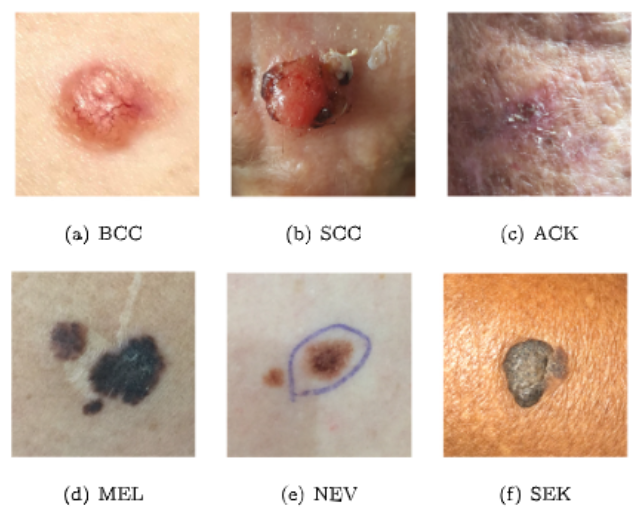
*Imagen adaptada de Pacheco et al., 2020*

*Este trabajo se enmarca dentro de un proyecto perteneciente al portfolio del programa de Inteligencia Artificial del Hospital Italiano de Buenos Aires, que tiene como fin brindar una herramienta de soporte a la decisión clínica para profesionales no especialistas con el fin último de asistir en la derivación a especialistas de pacientes con lesiones sospechosas de malignidad. Así mismo, forma parte del plan de tesis de la doctoranda titulado "Aportes a la inteligencia artificial traslacional: nuevos métodos de aprendizaje automático justos y adaptables para el procesamiento de imágenes dermatoscópicas en escenarios clínicos."*

#Librerías y conexión a Drive

General

In [1]:
import os, sys
from timeit import default_timer as timer
from time import time
from random import randint
import glob
import random

Tratamiento de datos

In [2]:
import pandas as pd
import numpy as np
import math
import collections

Gráficos e imágenes

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import NullFormatter


import cv2
from PIL import Image
import pylab as pl

plt.style.use('default')

Machine Learning

In [4]:
import sklearn

from sklearn.utils import class_weight
from sklearn.utils.class_weight import compute_class_weight

from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MultiLabelBinarizer, LabelEncoder

from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report

from sklearn.model_selection import train_test_split, GroupShuffleSplit, GridSearchCV, KFold

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA

Deep Learning

In [5]:
import tensorflow
import tensorflow as tf

import keras
import keras.backend as K
from keras import models, Model, layers, optimizers, Input
from keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler, Callback

In [6]:
print(tensorflow.__version__)
print(keras.__version__)

2.6.0
2.6.0


In [7]:
!pip install wandb
import wandb
from wandb.keras import WandbCallback

     |████████████████████████████████| 1.7 MB 11.3 MB/s 
     |████████████████████████████████| 97 kB 6.2 MB/s 
     |████████████████████████████████| 170 kB 35.0 MB/s 
     |████████████████████████████████| 133 kB 36.2 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 
  Created wheel for subprocess32: filename=subprocess32-3.5.4-py3-none-any.whl size=6502 sha256=fd3267cc27ca7b004507534ccc4b93ec078301ad5a9aff1f163a0de4bc4f51a0
  Stored in directory: /root/.cache/pip/wheels/50/ca/fa/8fca8d246e64f19488d07567547ddec8eb084e8c0d7a59226a
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8807 sha256=0216bc9549fd9b1713a3c41860e3f04914d14e365f54555f7992b3720fd49223
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built subprocess32 pathtools


In [8]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


#Funciones

In [9]:
#Gráfico de la curva ROC y obtención del AUC

def plot_ROC(y_true, y_probs, color =  '#07D0DC'):
  fpr, tpr, thresholds = metrics.roc_curve(y_true, y_probs)
  auc = metrics.roc_auc_score(y_true, y_probs)
  ns_probs = [0 for _ in range(len(y_true))]
  plt.plot(fpr, tpr, marker='.', label='(AUC = %0.2f)' %(auc), color = color)
  plt.plot(fpr, fpr, linestyle = '--', color = 'gray')
  plt.xlabel('1 - Especificidad')
  plt.ylabel('Sensibilidad')
  plt.legend(bbox_to_anchor=(1,1))


In [10]:
#Gráfico de la matriz de confusión

def cm_analysis(y_true, y_pred, labels, filename='', ymap=None, figsize=(10,10)):
    if ymap is not None:
        y_pred = [ymap[yi] for yi in y_pred]
        y_true = [ymap[yi] for yi in y_true]
        labels = [ymap[yi] for yi in labels]
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100
    annot = np.empty_like(cm).astype(str)
    nrows, ncols = cm.shape
    for i in range(nrows):
        for j in range(ncols):
            c = cm[i, j]
            p = cm_perc[i, j]
            if i == j:
                s = cm_sum[i]
                annot[i, j] = '%.1f%%\n%d/%d' % (p, c, s)
            elif c == 0:
                annot[i, j] = ''
            else:
                annot[i, j] = '%.1f%%\n%d' % (p, c)
    cm = pd.DataFrame(cm, index=labels, columns=labels)
    cm.index.name = 'Ground Truth'
    cm.columns.name = 'Predicción'
    fig, ax = plt.subplots(figsize=figsize)

    akws = {"ha": 'center', "va": 'top'}
    sns.heatmap(cm, annot=annot, annot_kws=akws, fmt='', ax=ax, cmap="Blues") #rocket_r
    #plt.savefig(filename)

    plt.show()

#A) Análisis exploratorio

In [274]:
dataset_ID='PAD_UFES'

In [275]:
#Archivo de metada original
data = pd.read_csv('/content/gdrive/My Drive/PAD UFES/metadata.csv')
data

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,cancer_history,has_piped_water,has_sewage_system,fitspatrick,region,diameter_1,diameter_2,diagnostic,itch,grew,hurt,changed,bleed,elevation,img_id,biopsed
0,PAT_1516,1765,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ARM,NaN,NaN,NEV,False,False,False,False,False,False,PAT_1516_1765_530.png,False
1,PAT_46,881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3.0,NECK,6.0,5.0,BCC,True,True,False,True,True,True,PAT_46_881_939.png,True
2,PAT_1545,1867,NaN,NaN,NaN,NaN,77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,FACE,NaN,NaN,ACK,True,False,False,False,False,False,PAT_1545_1867_547.png,False
3,PAT_1989,4061,NaN,NaN,NaN,NaN,75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,HAND,NaN,NaN,ACK,True,False,False,False,False,False,PAT_1989_4061_934.png,False
4,PAT_684,1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,False,False,False,1.0,FOREARM,5.0,5.0,BCC,True,True,False,False,True,True,PAT_684_1302_588.png,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2293,PAT_1708,3156,NaN,NaN,NaN,NaN,73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,HAND,NaN,NaN,ACK,True,False,False,False,False,False,PAT_1708_3156_175.png,False
2294,PAT_46,880,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3.0,CHEST,13.0,12.0,BCC,True,True,False,True,False,False,PAT_46_880_140.png,True
2295,PAT_1343,1217,NaN,NaN,NaN,NaN,74,NaN,NaN,NaN,NaN,NaN,NaN,NaN,FOREARM,NaN,NaN,SEK,False,False,False,False,False,False,PAT_1343_1217_404.png,False
2296,PAT_326,690,False,False,POMERANIA,POMERANIA,58,True,FEMALE,True,True,False,False,3.0,FACE,5.0,4.0,BCC,True,False,False,False,False,True,PAT_326_690_823.png,True


In [ ]:
#Carpetas para los múltiples experimentos
images_dir ='/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/'
exp_dir ='/content/gdrive/My Drive/Clasificacion/'
n_split = '20210803-54'
exp_dir = exp_dir+n_split
exp_dir

if (os.path.exists(exp_dir)):
    print('ALERTA. Ya existe ', exp_dir)
else:
    print('Creando nuevo directorio ', exp_dir)
    os.makedirs(exp_dir)

*Se verifica que exista una imagen para cada fila del dataset. Se detecta la falta de tres imágenes que son eliminadas del dataset.*

In [277]:
#Verificación de que estén todas las imágenes
for i in range(len(data)):
  data.img_id[i] = images_dir+data.img_id[i].replace('.png', '.jpg')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [278]:
for i in range(len(data)):
  if not(os.path.exists(data.img_id[i])):
    data.drop(i, inplace=True)

data.reset_index(drop=True, inplace=True)
data

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,cancer_history,has_piped_water,has_sewage_system,fitspatrick,region,diameter_1,diameter_2,diagnostic,itch,grew,hurt,changed,bleed,elevation,img_id,biopsed
0,PAT_1516,1765,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ARM,NaN,NaN,NEV,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False
1,PAT_46,881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3.0,NECK,6.0,5.0,BCC,True,True,False,True,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True
2,PAT_1545,1867,NaN,NaN,NaN,NaN,77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,FACE,NaN,NaN,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False
3,PAT_1989,4061,NaN,NaN,NaN,NaN,75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,HAND,NaN,NaN,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False
4,PAT_684,1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,False,False,False,1.0,FOREARM,5.0,5.0,BCC,True,True,False,False,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,PAT_1708,3156,NaN,NaN,NaN,NaN,73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,HAND,NaN,NaN,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False
2291,PAT_46,880,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3.0,CHEST,13.0,12.0,BCC,True,True,False,True,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True
2292,PAT_1343,1217,NaN,NaN,NaN,NaN,74,NaN,NaN,NaN,NaN,NaN,NaN,NaN,FOREARM,NaN,NaN,SEK,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False
2293,PAT_326,690,False,False,POMERANIA,POMERANIA,58,True,FEMALE,True,True,False,False,3.0,FACE,5.0,4.0,BCC,True,False,False,False,False,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True


*Se identifica que hay valores que no fueron completados durante la tabulación, así como valores que fueron identificados como desconocidos (unknown), por lo que se decide tratar a todos estos datos como desconocidos (unknown)*

In [279]:
data = data.fillna('UNK')
data

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,cancer_history,has_piped_water,has_sewage_system,fitspatrick,region,diameter_1,diameter_2,diagnostic,itch,grew,hurt,changed,bleed,elevation,img_id,biopsed
0,PAT_1516,1765,UNK,UNK,UNK,UNK,8,UNK,UNK,UNK,UNK,UNK,UNK,UNK,ARM,UNK,UNK,NEV,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False
1,PAT_46,881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3,NECK,6,5,BCC,True,True,False,True,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True
2,PAT_1545,1867,UNK,UNK,UNK,UNK,77,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FACE,UNK,UNK,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False
3,PAT_1989,4061,UNK,UNK,UNK,UNK,75,UNK,UNK,UNK,UNK,UNK,UNK,UNK,HAND,UNK,UNK,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False
4,PAT_684,1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,False,False,False,1,FOREARM,5,5,BCC,True,True,False,False,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,PAT_1708,3156,UNK,UNK,UNK,UNK,73,UNK,UNK,UNK,UNK,UNK,UNK,UNK,HAND,UNK,UNK,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False
2291,PAT_46,880,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3,CHEST,13,12,BCC,True,True,False,True,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True
2292,PAT_1343,1217,UNK,UNK,UNK,UNK,74,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FOREARM,UNK,UNK,SEK,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False
2293,PAT_326,690,False,False,POMERANIA,POMERANIA,58,True,FEMALE,True,True,False,False,3,FACE,5,4,BCC,True,False,False,False,False,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True


*Para simplificar el análisis y dada la poca cantidad de datos disponibles, se decide binarizar la variable diagnóstico en dos categorías: maligno y benigno. En consecuencia:*


**Lesiones malignas**

- BCC: *carcinoma basocelular*
- SCC: *carcinoma espinocelular*
- MEL: *melanoma*

**Lesiones benignas**

- NV: *nevo melanocítico*
- SEK: *queratosis seborreica*
- ACK: *queratosis actínica (lesión precancerosa)*


In [280]:
data['malignancy'] = data['diagnostic'].replace('ACK', False).replace('NEV', False).replace('SEK', False).replace('MEL', True).replace('BCC', True).replace('SCC', True)
data

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,cancer_history,has_piped_water,has_sewage_system,fitspatrick,region,diameter_1,diameter_2,diagnostic,itch,grew,hurt,changed,bleed,elevation,img_id,biopsed,malignancy
0,PAT_1516,1765,UNK,UNK,UNK,UNK,8,UNK,UNK,UNK,UNK,UNK,UNK,UNK,ARM,UNK,UNK,NEV,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,False
1,PAT_46,881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3,NECK,6,5,BCC,True,True,False,True,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,True
2,PAT_1545,1867,UNK,UNK,UNK,UNK,77,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FACE,UNK,UNK,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,False
3,PAT_1989,4061,UNK,UNK,UNK,UNK,75,UNK,UNK,UNK,UNK,UNK,UNK,UNK,HAND,UNK,UNK,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,False
4,PAT_684,1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,False,False,False,1,FOREARM,5,5,BCC,True,True,False,False,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,PAT_1708,3156,UNK,UNK,UNK,UNK,73,UNK,UNK,UNK,UNK,UNK,UNK,UNK,HAND,UNK,UNK,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,False
2291,PAT_46,880,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3,CHEST,13,12,BCC,True,True,False,True,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,True
2292,PAT_1343,1217,UNK,UNK,UNK,UNK,74,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FOREARM,UNK,UNK,SEK,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,False
2293,PAT_326,690,False,False,POMERANIA,POMERANIA,58,True,FEMALE,True,True,False,False,3,FACE,5,4,BCC,True,False,False,False,False,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,True


##1) Imágenes, pacientes y lesiones

###a) Distribución de imágenes por paciente

*Se evalúa cuántos pacientes fueron considerados para la conformación de este dataset, así como cuántas imágenes posee cada uno de ellos ya que se sabe que un mismo paciente puede tener más de una lesión cutánea, así como más de una imagen por cada una de sus lesiones.*

In [281]:
print('Hay un total de %d pacientes' %(len(data.patient_id.unique())))
print('Hay %d pacientes con más de una imagen' %(len(data.patient_id.value_counts()[data.patient_id.value_counts()>1])))


Hay un total de 1373 pacientes
Hay 543 pacientes con más de una imagen


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


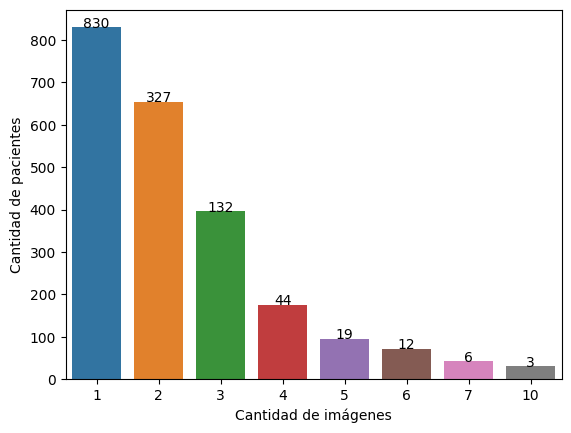

In [282]:
patients = data.patient_id.value_counts()

num = []
quan = []


for i,v in enumerate(np.unique(patients.values)):
  n = v
  q = len(data.patient_id.value_counts()[data.patient_id.value_counts()==v]) * v
  num.append(n)
  quan.append(q)

bar = sns.barplot(num,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Cantidad de imágenes')

for i,v in enumerate((quan)):
  bar.text(i, v,  str(int(v/(i+1))), horizontalalignment='center')


###b) Imágenes de una misma lesión

*Se evalúa cuántas imágenes correspondientes a una lesión única existen en el dataset. Esto no necesariamente implica la presencia de duplicados, sino que también puede tratarse de la fotografía de una misma lesión en dos instancias de consulta, por ejemplo.*

In [283]:
#Conversión de los id_lesion en strings
for i in range(len(data)):
  data['lesion_id'][i] = 'LES_'+str(data['lesion_id'][i])

data

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,cancer_history,has_piped_water,has_sewage_system,fitspatrick,region,diameter_1,diameter_2,diagnostic,itch,grew,hurt,changed,bleed,elevation,img_id,biopsed,malignancy
0,PAT_1516,LES_1765,UNK,UNK,UNK,UNK,8,UNK,UNK,UNK,UNK,UNK,UNK,UNK,ARM,UNK,UNK,NEV,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,False
1,PAT_46,LES_881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3,NECK,6,5,BCC,True,True,False,True,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,True
2,PAT_1545,LES_1867,UNK,UNK,UNK,UNK,77,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FACE,UNK,UNK,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,False
3,PAT_1989,LES_4061,UNK,UNK,UNK,UNK,75,UNK,UNK,UNK,UNK,UNK,UNK,UNK,HAND,UNK,UNK,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,False
4,PAT_684,LES_1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,False,False,False,1,FOREARM,5,5,BCC,True,True,False,False,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,PAT_1708,LES_3156,UNK,UNK,UNK,UNK,73,UNK,UNK,UNK,UNK,UNK,UNK,UNK,HAND,UNK,UNK,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,False
2291,PAT_46,LES_880,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3,CHEST,13,12,BCC,True,True,False,True,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,True
2292,PAT_1343,LES_1217,UNK,UNK,UNK,UNK,74,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FOREARM,UNK,UNK,SEK,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,False
2293,PAT_326,LES_690,False,False,POMERANIA,POMERANIA,58,True,FEMALE,True,True,False,False,3,FACE,5,4,BCC,True,False,False,False,False,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,True


*Para empezar se analiza que no existan incongruencias entre los identificadores de lesiones. Es decir, una misma lesión (identificada a través de su ID), debería pertenecer al mismo paciente. Se detecta que existen errores relacionados a esta nomenclatura, y se procede a corregirlos incorporando una cadena "_b" a los id_lesion que corresonden a otro paciente.*

In [284]:
image_patient = {}
n = 0

for i in range(len(data)):
  key = data['lesion_id'][i]
  
  if key in image_patient:
    if (image_patient[key] != data['patient_id'][i]): #existe el id_lesion pero los pacientes son distintos
      n+=1
      print("Existe el id_lesion - %s - pero los pacientes son diferentes: %s, %s" %(key, data['patient_id'][i], image_patient[key]))
      key = data.lesion_id[i]+'_b'
      data.lesion_id[i]= key
      image_patient[key]=data['patient_id'][i]
  else:
    image_patient[key]=data['patient_id'][i]

print('\n Hay %d casos que comparten el id de lesión pero el paciente es distinto' %(n))

Existe el id_lesion - LES_1867 - pero los pacientes son diferentes: PAT_995, PAT_1545
Existe el id_lesion - LES_1516 - pero los pacientes son diferentes: PAT_281, PAT_802
Existe el id_lesion - LES_738 - pero los pacientes son diferentes: PAT_358, PAT_1210
Existe el id_lesion - LES_1410 - pero los pacientes son diferentes: PAT_747, PAT_1410
Existe el id_lesion - LES_86 - pero los pacientes son diferentes: PAT_56, PAT_1014
Existe el id_lesion - LES_762 - pero los pacientes son diferentes: PAT_1217, PAT_374
Existe el id_lesion - LES_1600 - pero los pacientes son diferentes: PAT_1461, PAT_827
Existe el id_lesion - LES_361 - pero los pacientes son diferentes: PAT_93, PAT_236
Existe el id_lesion - LES_264 - pero los pacientes son diferentes: PAT_170, PAT_1062
Existe el id_lesion - LES_295 - pero los pacientes son diferentes: PAT_192, PAT_256
Existe el id_lesion - LES_964 - pero los pacientes son diferentes: PAT_513, PAT_1277
Existe el id_lesion - LES_313 - pero los pacientes son diferentes: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [285]:
id_nuevos = []
id_originales = []

for k in (image_patient.keys()):
  if ('_b' not in k):
    id_originales.append(k)
  else:
    id_nuevos.append(k)

print('Hay %d id_originales' %(len(id_originales)))
print('Hay %d id_nuevos' %(len(id_nuevos)))
print('El total de lesiones únicas es', len(id_nuevos)+len(id_originales))

Hay 1640 id_originales
Hay 250 id_nuevos
El total de lesiones únicas es 1890


In [286]:
data.lesion_id.value_counts()

LES_1246      6
LES_361_b     5
LES_1402_b    4
LES_2574      4
LES_322       4
             ..
LES_302       1
LES_817       1
LES_479       1
LES_804       1
LES_1347      1
Name: lesion_id, Length: 1890, dtype: int64

*Se revisan las lesiones con más de una imagen para corroborar que nuevamente no exista un problema con la identificación de pacientes*

In [287]:
for i, v in enumerate(data.lesion_id.value_counts().index):
  if(data.lesion_id.value_counts()[v]>1):
    sub = data[data.lesion_id==v]
    if (sub.diagnostic.unique().shape[0]>1):
      print('La lesion %s tiene más de un diagnóstico' %(v))
      print(sub)


*Se revisa que todos los id_lesion correspondan a un mismo paciente*

In [288]:
for i, v in enumerate(data.lesion_id.unique()):
  sub = data[data.lesion_id==v]
  if (sub.patient_id.unique().shape[0]>1):
    print('La lesion %s tiene más de un paciente' %(v))
    print(sub)


*Se evalúa cuántas imágenes existen por lesión única. Existe un sólo caso en el cual la misma lesión fue fotografiada 5 oportunidades y otro caso en el que una lesión fue registrada 6 veces. Abundan los casos de lesiones con una única imagen, seguido de casos con dos o tres imágenes por lesión.*

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


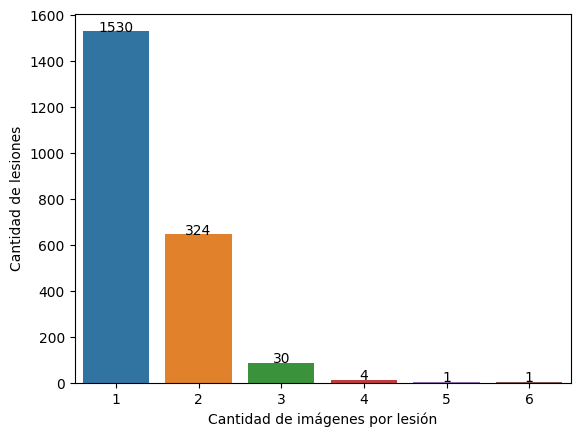

In [289]:
lesions = data.lesion_id.value_counts()

num = []
quan = []


for i,v in enumerate(np.unique(lesions.values)):
  n = v
  q = len(data.lesion_id.value_counts()[data.lesion_id.value_counts()==v]) * v
  num.append(n)
  quan.append(q)

bar = sns.barplot(num,quan)
bar.set(ylabel='Cantidad de lesiones', xlabel='Cantidad de imágenes por lesión')

for i,v in enumerate((quan)):
  bar.text(i, v, str(int(v/(i+1))), horizontalalignment='center')


###c) Distribución de lesiones por paciente

*Se quiere identificar cuántas lesiones únicas (no imágenes) han sido registradas para cada uno de los pacientes incluidos en este estudio.*

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


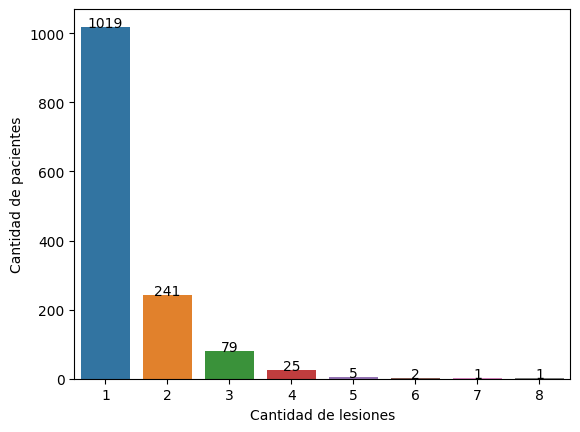

In [290]:
patients = data.patient_id.unique()

num = []
quan = []

for i,v in enumerate(patients):
    q = len(data[data.patient_id == v].lesion_id.unique())
    quan.append(q)

dic = {i:quan.count(i) for i in quan}
dic = collections.OrderedDict(sorted(dic.items()))

bar = sns.barplot(np.asarray(list(dic.keys())),np.asarray(list(dic.values())))
bar.set(ylabel='Cantidad de pacientes', xlabel='Cantidad de lesiones')

for i,v in enumerate((np.asarray(list(dic.values())))):
  bar.text(i, v, str(int(v)), horizontalalignment='center')

##2) Análisis a nivel lesión 

*Se procede a analizar las características correspondientes a las lesiones. Para ello, se evalúa si las imágenes duplicadas (con más de una imagen) presentan diferencias en término de sus características. Para cada característica, así mismo, se evalúa como se distribuye este atributo en relación al diagnóstico final de la lesión.*

In [291]:
data['malignancy'] = data['malignancy'].replace(False, 'Benigno').replace(True, 'Maligno') 

In [326]:
int(data['diameter_1'][1])

6

In [329]:
#Las variables numéricas son agrupadas 

data['diameter_1_group'] = ''
for i in range(len(data)):
  try:
    if (data['diameter_1'][i]<=10):
      data['diameter_1_group'][i] = 10
    elif (data['diameter_1'][i]<=20):
      data['diameter_1_group'][i] = 20
    elif (data['diameter_1'][i]<=30):
      data['diameter_1_group'][i] = 30
    elif (data['diameter_1'][i]<=40):
      data['diameter_1_group'][i] = 40
    elif (data['diameter_1'][i]<=50):
      data['diameter_1_group'][i] = 50
    elif (data['diameter_1'][i]<=60):
      data['diameter_1_group'][i] = 60
    elif (data['diameter_1'][i]<=70):
      data['diameter_1_group'][i] = 70
    elif (data['diameter_1'][i]<=80):
      data['diameter_1_group'][i] = 80
    elif (data['diameter_1'][i]<=90):
      data['diameter_1_group'][i] = 90
    elif (data['diameter_1'][i]<=100):
      data['diameter_1_group'][i] = 100
    elif (data['diameter_1'][i]<=110):
      data['diameter_1_group'][i] = 110
  except:
    data['diameter_1_group'][i] = data['diameter_1'][i]
    
data['diameter_2_group'] = ''
for i in range(len(data)):
  try:    
    if (data['diameter_2'][i]<=10):
      data['diameter_2_group'][i] = 10
    elif (data['diameter_2'][i]<=20):
      data['diameter_2_group'][i] = 20
    elif (data['diameter_2'][i]<=30):
      data['diameter_2_group'][i] = 30
    elif (data['diameter_2'][i]<=40):
      data['diameter_2_group'][i] = 40
    elif (data['diameter_2'][i]<=50):
      data['diameter_2_group'][i] = 50
    elif (data['diameter_2'][i]<=60):
      data['diameter_2_group'][i] = 60
    elif (data['diameter_2'][i]<=70):
      data['diameter_2_group'][i] = 70
    elif (data['diameter_2'][i]<=80):
      data['diameter_2_group'][i] = 80
    elif (data['diameter_2'][i]<=90):
      data['diameter_2_group'][i] = 90
    elif (data['diameter_2'][i]<=100):
      data['diameter_2_group'][i] = 100
    elif (data['diameter_2'][i]<=110):
      data['diameter_2_group'][i] = 110
  except:
      data['diameter_2_group'][i] = data['diameter_2'][i]
    

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: Setting

In [332]:
lesiones_duplicadas = data.copy()
lesiones_duplicadas.drop('img_id', axis='columns', inplace=True)
lesiones_duplicadas = lesiones_duplicadas[lesiones_duplicadas.duplicated(subset='lesion_id', keep=False)]
lesiones_duplicadas

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,cancer_history,has_piped_water,has_sewage_system,fitspatrick,region,diameter_1,diameter_2,diagnostic,itch,grew,hurt,changed,bleed,elevation,biopsed,malignancy,diameter_1_group,diameter_2_group
1,PAT_46,LES_881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3,NECK,6,5,BCC,True,True,False,True,True,True,True,Maligno,10,10
4,PAT_684,LES_1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,False,False,False,1,FOREARM,5,5,BCC,True,True,False,False,True,True,True,Maligno,10,10
6,PAT_778,LES_1471,False,True,GERMANY,ITALY,52,False,FEMALE,False,True,True,True,3,FACE,15,10,BCC,False,True,False,True,True,True,True,Maligno,20,10
10,PAT_2140,LES_4726,UNK,UNK,UNK,UNK,45,UNK,UNK,UNK,UNK,UNK,UNK,UNK,NECK,UNK,UNK,ACK,True,False,False,False,False,True,False,Benigno,UNK,UNK
13,PAT_636,LES_1204,False,False,BRAZIL,BRAZIL,78,False,FEMALE,True,True,True,True,2,CHEST,20,18,BCC,True,True,True,True,True,True,True,Maligno,20,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2278,PAT_747,LES_1409,False,False,UNK,BRAZIL,55,False,MALE,True,False,True,True,3,FOREARM,15,10,ACK,True,True,False,False,True,True,True,Benigno,20,10
2282,PAT_492,LES_937,False,True,POMERANIA,POMERANIA,70,False,MALE,False,False,False,False,2,CHEST,18,13,SCC,False,True,False,False,False,True,True,Maligno,20,20
2285,PAT_1407,LES_1402_b,UNK,UNK,UNK,UNK,81,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FOREARM,UNK,UNK,ACK,True,False,False,False,False,False,False,Benigno,UNK,UNK
2291,PAT_46,LES_880,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3,CHEST,13,12,BCC,True,True,False,True,False,False,True,Maligno,20,20


In [333]:
print('Hay %d entradas duplicadas a nivel lesion_id' %(lesiones_duplicadas.shape[0]))

Hay 765 entradas duplicadas a nivel lesion_id


In [334]:
def cols_having_unique(df):
    my_cols = []
    for col in df.columns:
        if df[col].nunique(dropna=False) > 1:
            my_cols.append(col)
    return df[my_cols].copy()

In [335]:
for i,v in enumerate(lesiones_duplicadas.lesion_id.unique()):
  sub = lesiones_duplicadas[lesiones_duplicadas.lesion_id==v]
  print(cols_having_unique(sub))

Empty DataFrame
Columns: []
Index: [1, 1672]
Empty DataFrame
Columns: []
Index: [4, 1792]
Empty DataFrame
Columns: []
Index: [6, 1505]
Empty DataFrame
Columns: []
Index: [10, 2151]
Empty DataFrame
Columns: []
Index: [13, 2107]
Empty DataFrame
Columns: []
Index: [16, 1747, 1815]
Empty DataFrame
Columns: []
Index: [22, 1876]
Empty DataFrame
Columns: []
Index: [33, 271]
Empty DataFrame
Columns: []
Index: [36, 209, 1561, 1656]
Empty DataFrame
Columns: []
Index: [37, 1134]
Empty DataFrame
Columns: []
Index: [38, 1363]
Empty DataFrame
Columns: []
Index: [39, 1010]
Empty DataFrame
Columns: []
Index: [40, 336, 836]
Empty DataFrame
Columns: []
Index: [46, 445, 744, 2058]
Empty DataFrame
Columns: []
Index: [49, 1417]
Empty DataFrame
Columns: []
Index: [51, 1470, 2180]
Empty DataFrame
Columns: []
Index: [52, 1380]
Empty DataFrame
Columns: []
Index: [53, 1479]
Empty DataFrame
Columns: []
Index: [54, 773]
Empty DataFrame
Columns: []
Index: [56, 888]
Empty DataFrame
Columns: []
Index: [59, 1818]
Emp

*Se detecta que la única diferencia entre estas entradas corresponde al img_id. No hay cambios en las características de la lesión como se supuso. Para analizar la distribución de características se procede a crear un nuevo dataset, eliminando los duplicados*

In [336]:
les_data = data.copy()
les_data.drop('img_id', axis='columns', inplace=True)
les_data.drop_duplicates(inplace=True, keep='first')
les_data

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,cancer_history,has_piped_water,has_sewage_system,fitspatrick,region,diameter_1,diameter_2,diagnostic,itch,grew,hurt,changed,bleed,elevation,biopsed,malignancy,diameter_1_group,diameter_2_group
0,PAT_1516,LES_1765,UNK,UNK,UNK,UNK,8,UNK,UNK,UNK,UNK,UNK,UNK,UNK,ARM,UNK,UNK,NEV,False,False,False,False,False,False,False,Benigno,UNK,UNK
1,PAT_46,LES_881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3,NECK,6,5,BCC,True,True,False,True,True,True,True,Maligno,10,10
2,PAT_1545,LES_1867,UNK,UNK,UNK,UNK,77,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FACE,UNK,UNK,ACK,True,False,False,False,False,False,False,Benigno,UNK,UNK
3,PAT_1989,LES_4061,UNK,UNK,UNK,UNK,75,UNK,UNK,UNK,UNK,UNK,UNK,UNK,HAND,UNK,UNK,ACK,True,False,False,False,False,False,False,Benigno,UNK,UNK
4,PAT_684,LES_1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,False,False,False,1,FOREARM,5,5,BCC,True,True,False,False,True,True,True,Maligno,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2288,PAT_273,LES_421,False,False,POMERANIA,POMERANIA,41,True,MALE,False,False,False,False,2,FACE,9,5,BCC,True,UNK,True,UNK,True,True,True,Maligno,10,10
2289,PAT_491,LES_934,False,False,POMERANIA,POMERANIA,43,True,FEMALE,True,True,False,False,2,FACE,9,5,SCC,True,UNK,False,UNK,True,True,True,Maligno,10,10
2290,PAT_1708,LES_3156,UNK,UNK,UNK,UNK,73,UNK,UNK,UNK,UNK,UNK,UNK,UNK,HAND,UNK,UNK,ACK,True,False,False,False,False,False,False,Benigno,UNK,UNK
2292,PAT_1343,LES_1217_b,UNK,UNK,UNK,UNK,74,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FOREARM,UNK,UNK,SEK,False,False,False,False,False,False,False,Benigno,UNK,UNK


###a) Picazón

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None, None, None, None, None, None]

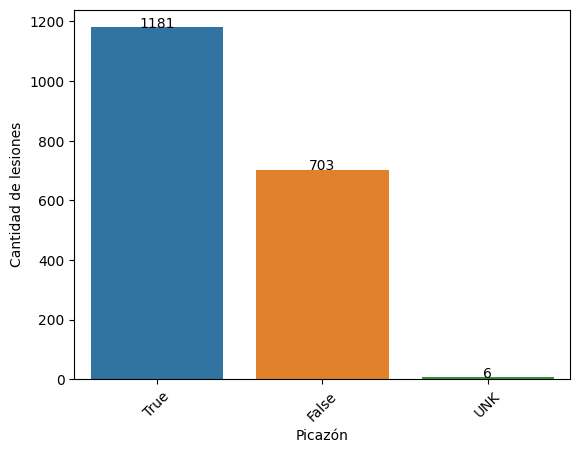

In [337]:
condition = []
quan = [] 

for i,v in enumerate(les_data.itch.value_counts().index):
  condition.append(v)
  quan.append(les_data.itch.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de lesiones', xlabel='Picazón')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)

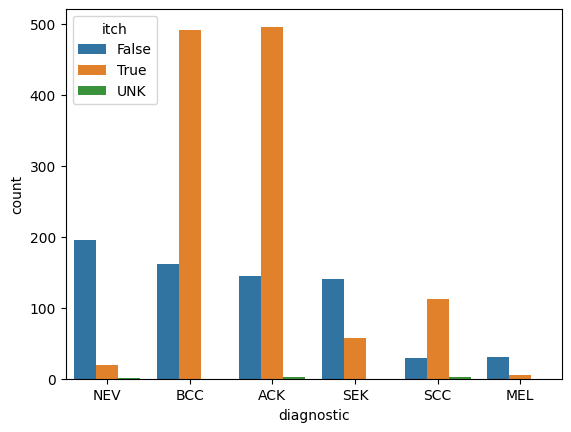

In [338]:
sns.countplot(x="diagnostic", hue="itch", data=les_data)

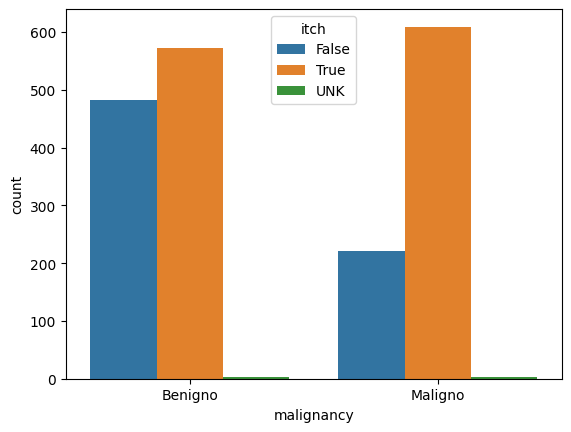

In [339]:
sns.countplot(x="malignancy", hue="itch", data=les_data)

###b) Crecimiento

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None, None, None, None, None, None]

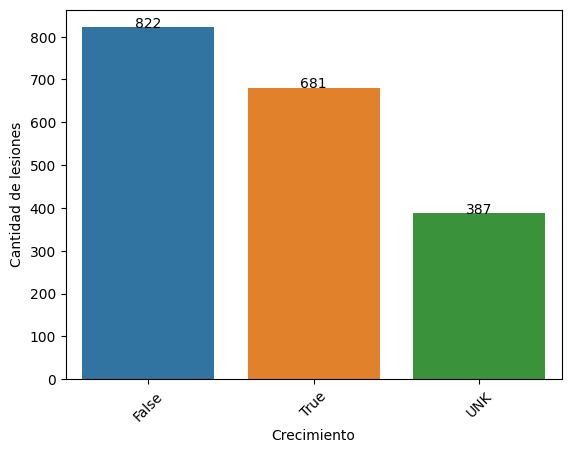

In [340]:
condition = []
quan = [] 

for i,v in enumerate(les_data.grew.value_counts().index):
  condition.append(v)
  quan.append(les_data.grew.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de lesiones', xlabel='Crecimiento')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)

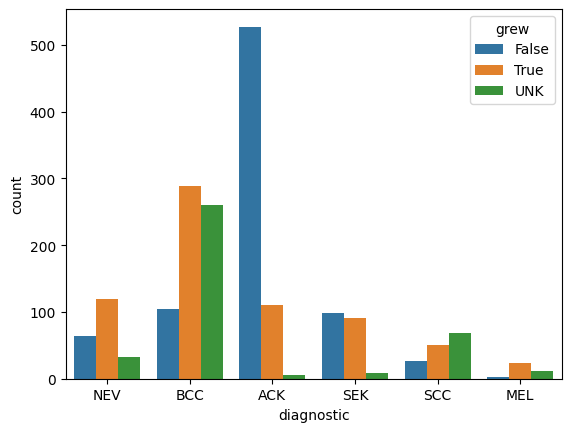

In [341]:
sns.countplot(x="diagnostic", hue="grew", data=les_data)

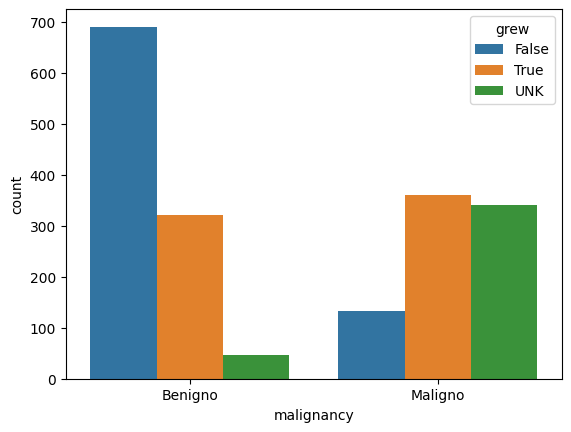

In [342]:
sns.countplot(x="malignancy", hue="grew", data=les_data)

*Se destaca que la mayoría de las lesiones benignas no muestran crecimiento*

###c) Dolor

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None, None, None, None, None, None]

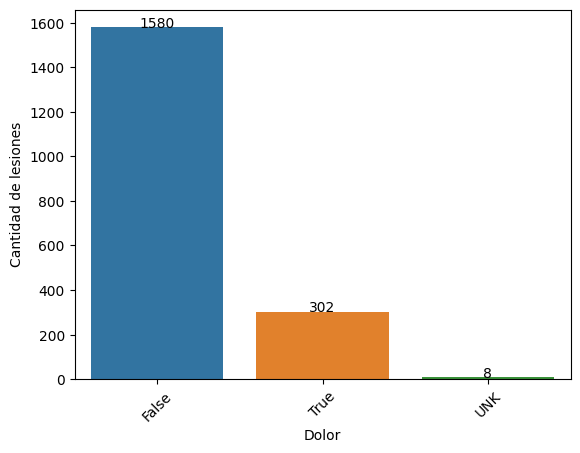

In [343]:
condition = []
quan = [] 

for i,v in enumerate(les_data.hurt.value_counts().index):
  condition.append(v)
  quan.append(les_data.hurt.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de lesiones', xlabel='Dolor')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)

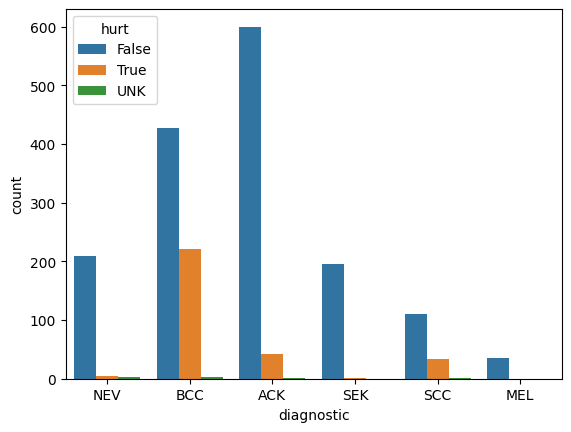

In [344]:
sns.countplot(x="diagnostic", hue="hurt", data=les_data)

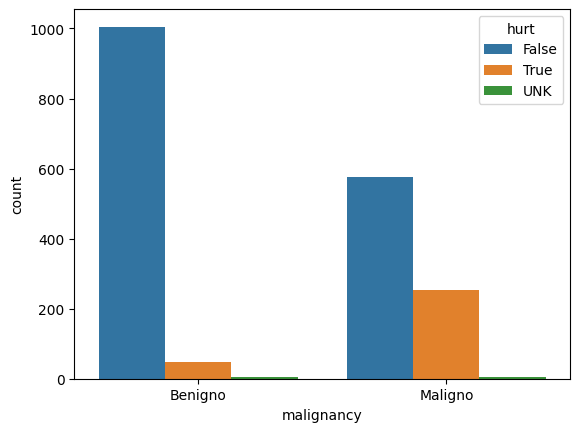

In [345]:
sns.countplot(x="malignancy", hue="hurt", data=les_data)

*Se detecta que muy pocas lesiones benignas suponen algún tipo de dolor para el paciente*

###d) Modificación

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None, None, None, None, None, None]

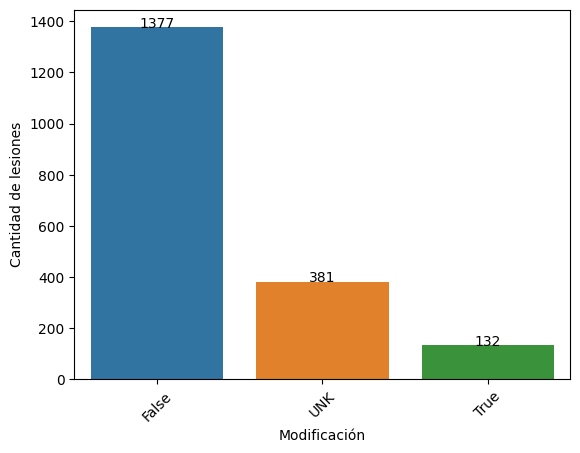

In [346]:
condition = []
quan = [] 

for i,v in enumerate(les_data.changed.value_counts().index):
  condition.append(v)
  quan.append(les_data.changed.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de lesiones', xlabel='Modificación')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)

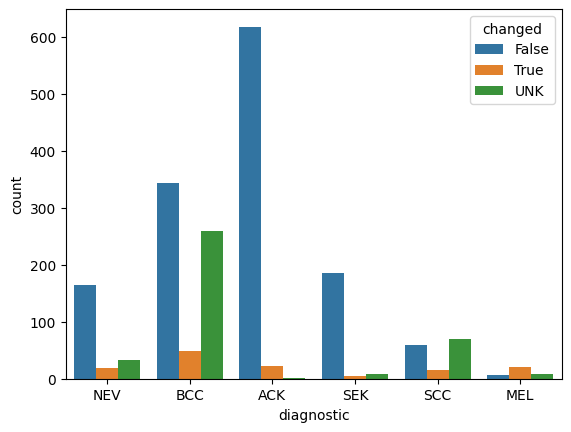

In [347]:
sns.countplot(x="diagnostic", hue="changed", data=les_data)

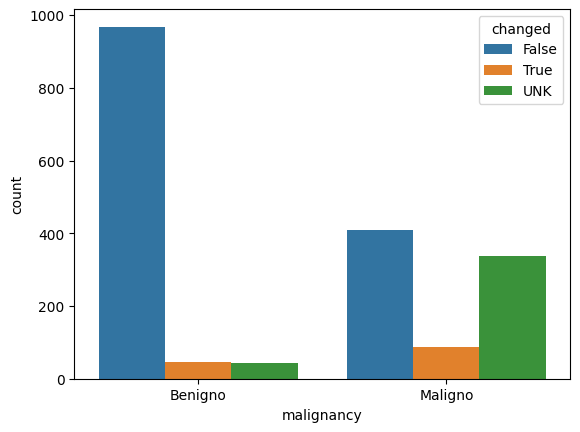

In [348]:
sns.countplot(x="malignancy", hue="changed", data=les_data)

###e) Sangrado

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None, None, None, None, None, None]

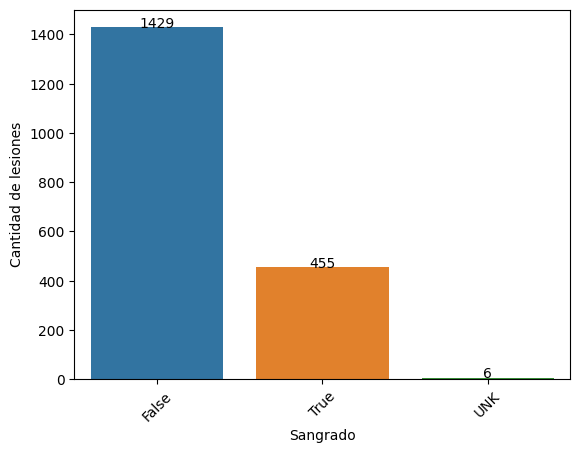

In [349]:
condition = []
quan = [] 

for i,v in enumerate(les_data.bleed.value_counts().index):
  condition.append(v)
  quan.append(les_data.bleed.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de lesiones', xlabel='Sangrado')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)

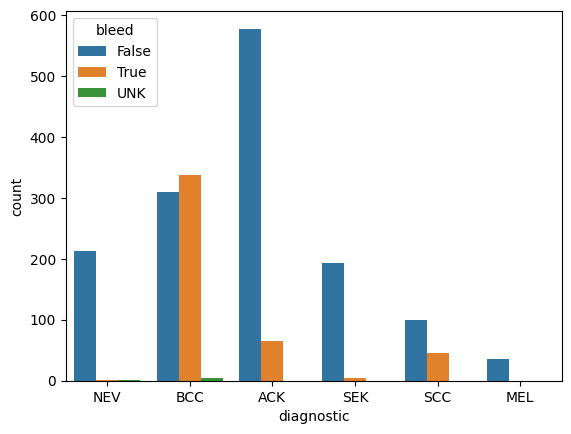

In [350]:
sns.countplot(x="diagnostic", hue="bleed", data=les_data)

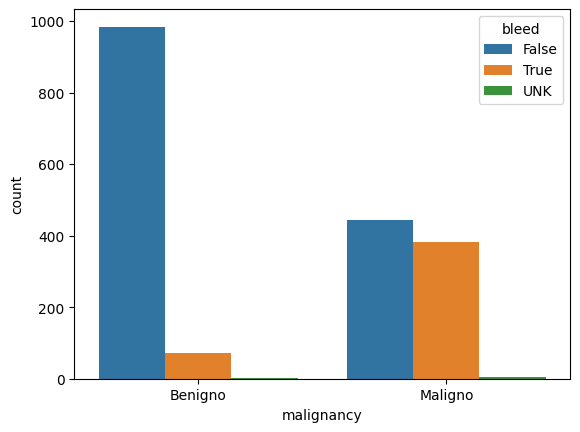

In [351]:
sns.countplot(x="malignancy", hue="bleed", data=les_data)

###f) Elevación

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None, None, None, None, None, None]

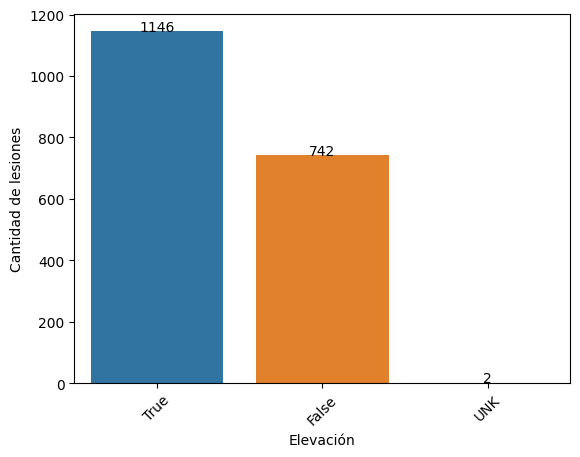

In [352]:
condition = []
quan = [] 

for i,v in enumerate(les_data.elevation.value_counts().index):
  condition.append(v)
  quan.append(les_data.elevation.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de lesiones', xlabel='Elevación')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)

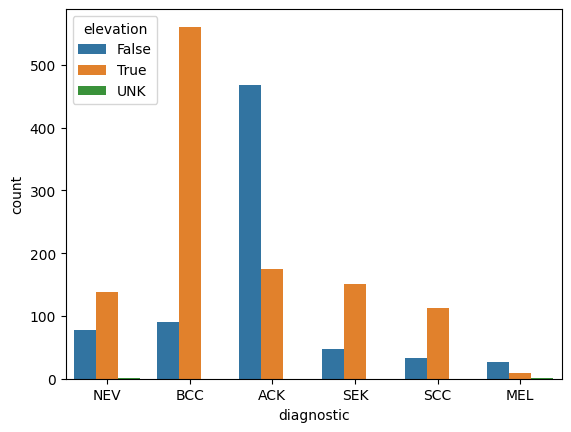

In [353]:
sns.countplot(x="diagnostic", hue="elevation", data=les_data)

*Para esta característica en particular, se identifica que la mayoría de los carcinomas basocelulares presentan elevación, lo cual es una característica del tipo de lesión*

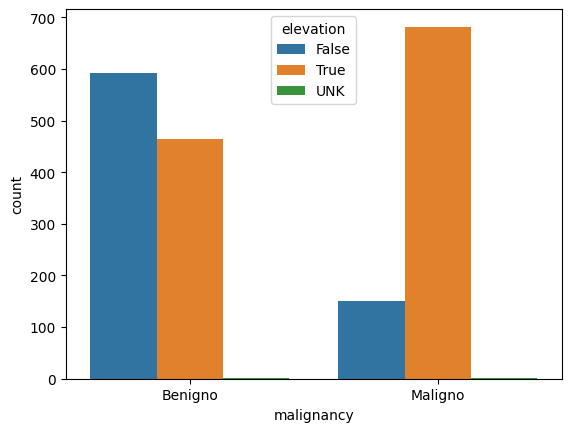

In [354]:
sns.countplot(x="malignancy", hue="elevation", data=les_data)

*En general, se identifica que las lesiones benignas no presentan picazón, ni crecimiento, ni dolor, ni cambios ni sangrado.*

###g) Región

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

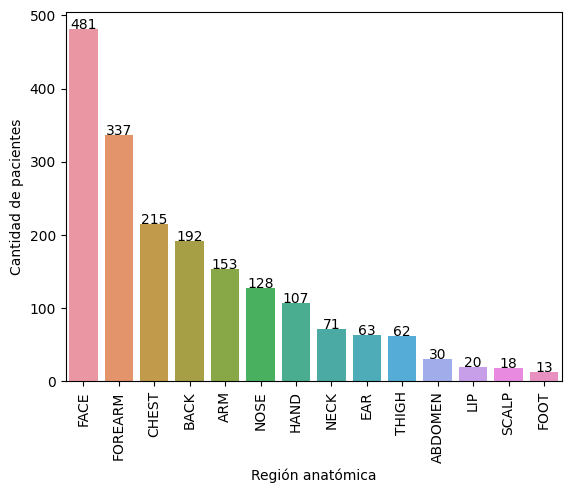

In [355]:
condition = []
quan = [] 

for i,v in enumerate(les_data.region.value_counts().index):
  condition.append(v)
  quan.append(les_data.region.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Región anatómica')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=90)

*La mayoría de las lesiones se localizan en la cara como resultado de la exposición a la radiación ultravioleta que supone un factor de riesgo para el desarrollo de lesiones cutáneas.*

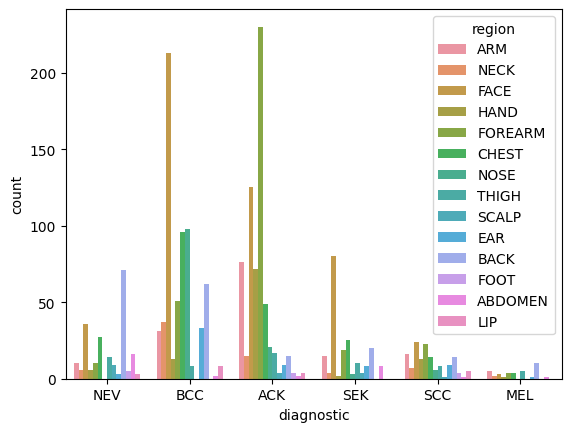

In [356]:
sns.countplot(x="diagnostic", hue="region", data=les_data)

*El carcinoma basocelular (BCC) y la queratosis seborreica (SEK) son lesiones que aparecen con frecuencia en la cara, lo cual se revela de este gráfico. Así como la abundancia de nevos melanocíticos (NEV) en la espalda.*

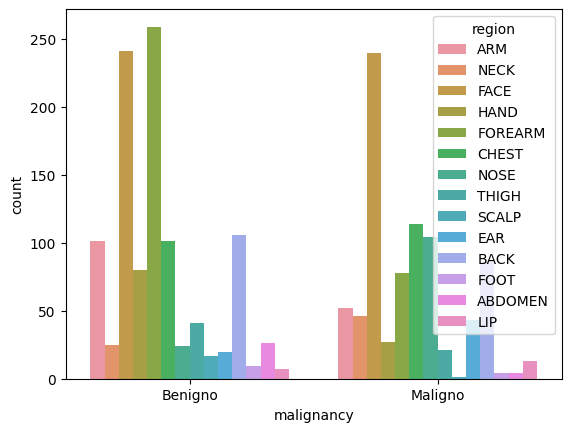

In [357]:
sns.countplot(x="malignancy", hue="region", data=les_data)

###h) Diámetro 1

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

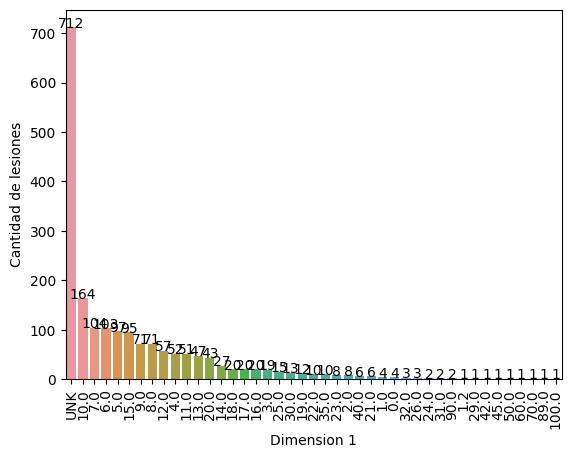

In [358]:
condition = []
quan = [] 

for i,v in enumerate(les_data.diameter_1.value_counts().index):
  condition.append(v)
  quan.append(les_data.diameter_1.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de lesiones', xlabel='Dimension 1')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=90)

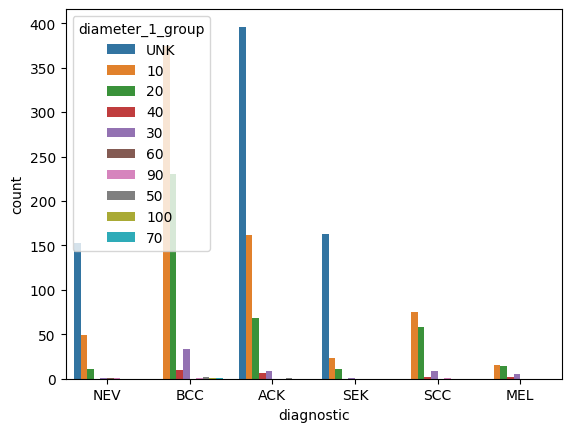

In [359]:
sns.countplot(x="diagnostic", hue="diameter_1_group", data=les_data)

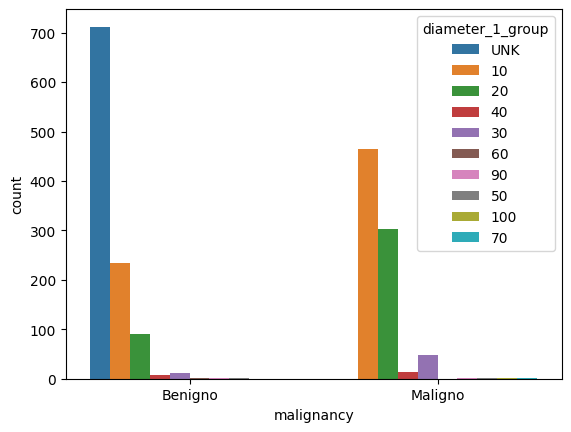

In [360]:
sns.countplot(x="malignancy", hue="diameter_1_group", data=les_data)

###i) Diámetro 2

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

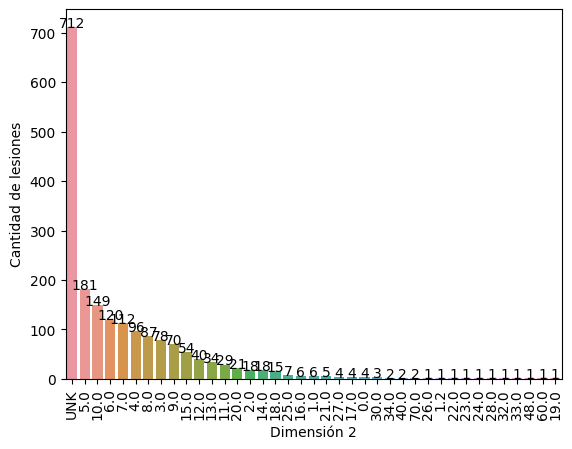

In [361]:
condition = []
quan = [] 

for i,v in enumerate(les_data.diameter_2.value_counts().index):
  condition.append(v)
  quan.append(les_data.diameter_2.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de lesiones', xlabel='Dimensión 2')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=90)

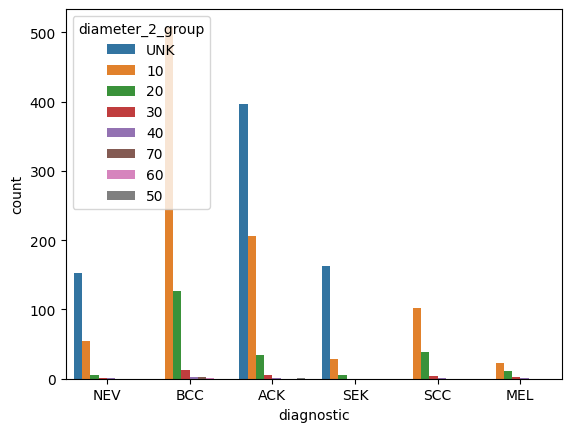

In [362]:
sns.countplot(x="diagnostic", hue="diameter_2_group", data=les_data)

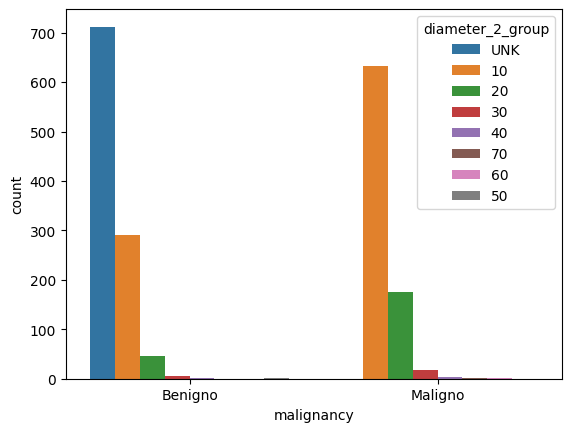

In [363]:
sns.countplot(x="malignancy", hue="diameter_2_group", data=les_data)

*En ambos casos, en la medición de dimensiones de la lesión, se observa que todas las lesiones malignas son medidas. Esto puede ser consecuencia de que uno de los criterios incluidos en la regla ABCDE para diferenciar el melanoma supone que la lesión debe ser superior a 6mm.*

###j) Biospia de lesión

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[Text(0, 0.5, 'Cantidad de lesiones'), Text(0.5, 0, 'Biopsia')]

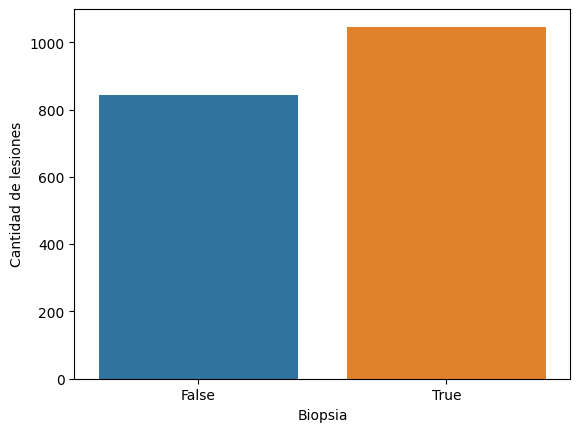

In [364]:
condition = []
quan = [] 

for i,v in enumerate(les_data.biopsed.value_counts().index):
  condition.append(v)
  quan.append(les_data.biopsed.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de lesiones', xlabel='Biopsia')


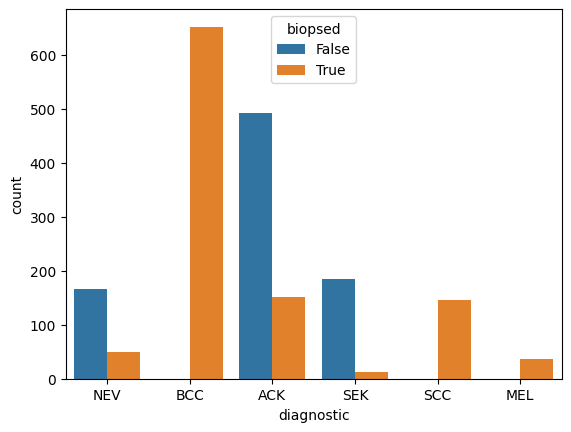

In [365]:
sns.countplot(x="diagnostic", hue="biopsed", data=les_data)

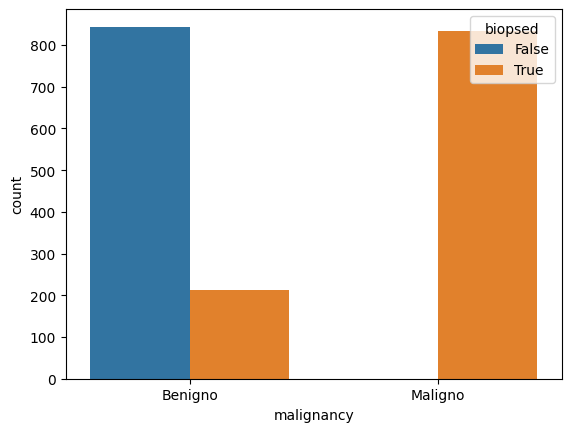

In [366]:
sns.countplot(x="malignancy", hue="biopsed", data=les_data)

*Se identifica que todas las lesiones malignas, es decir, melanoma (MEL), carcinoma basocelular (BCC) y carcinoma espinocelular (SCC) han sido confirmadas por biopsia. Respecto a las lesiones benignas, las mismas sólo son biopsiadas en caso de sospecha de malignidad de modo de no realizar a los pacientes una práctica necesaria con el riesgo de incrementar morbilidad/mortalidad.*

###k) Diagnóstico

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None, None, None, None, None, None, None, None, None, None, None, None]

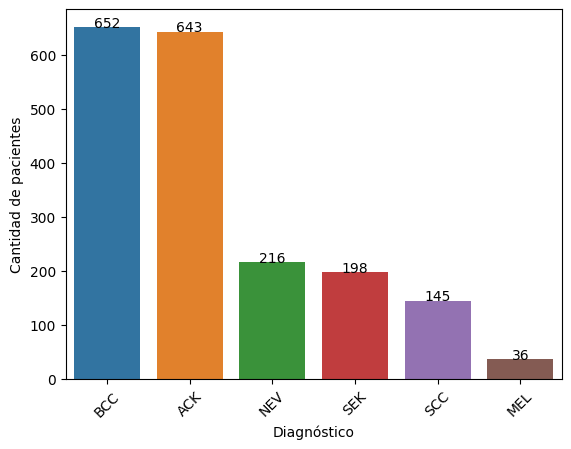

In [367]:
condition = []
quan = [] 

for i,v in enumerate(les_data.diagnostic.value_counts().index):
  condition.append(v)
  quan.append(les_data.diagnostic.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Diagnóstico')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)

*La distribución de diagnósticos coincide en cierta medida con la prevalencia reportada para este tipo de lesiones. En relación a los tipos de cáncer de piel, el BCC representa aproximadamente el 75% de los casos, el SCC el 20% y el MEL el 5% de ellos.*

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None, None, None, None]

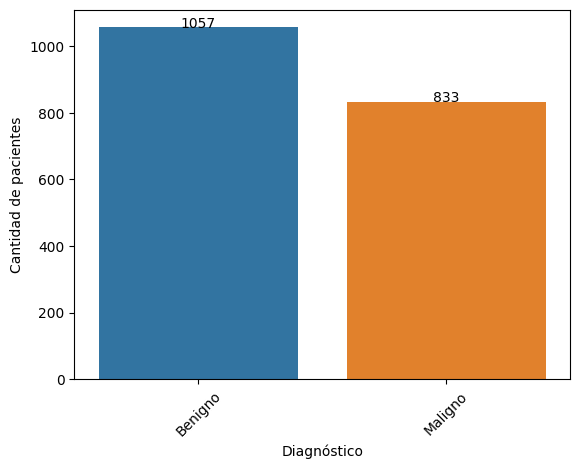

In [368]:
condition = []
quan = [] 

for i,v in enumerate(les_data.malignancy.value_counts().index):
  condition.append(v)
  quan.append(les_data.malignancy.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Diagnóstico')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)

##3) Análisis a nivel paciente

*Se procede a analizar las características de los pacientes incluidos en esta base de datos. Para ello, se decide crear un nuevo dataset que incorpore sólo una vez a cada paciente, independientemente de la cantidad de lesiones y de imágenes que se tengan de cada uno de ellos.*

In [370]:
#Se agrupan las variables numéricas

data['age_group'] = ''
for i in range(len(data)):
  if (data['age'][i]<=10):
    data['age_group'][i] = 10
  elif (data['age'][i]<=20):
    data['age_group'][i] = 20
  elif (data['age'][i]<=30):
    data['age_group'][i] = 30
  elif (data['age'][i]<=40):
    data['age_group'][i] = 40
  elif (data['age'][i]<=50):
    data['age_group'][i] = 50
  elif (data['age'][i]<=60):
    data['age_group'][i] = 60
  elif (data['age'][i]<=70):
    data['age_group'][i] = 70
  elif (data['age'][i]<=80):
    data['age_group'][i] = 80
  elif (data['age'][i]<=90):
    data['age_group'][i] = 90
  elif (data['age'][i]<=100):
    data['age_group'][i] = 100
  elif (data['age'][i]<=110):
    data['age_group'][i] = 110
  else:
    data['age_group'][i] = data['age'][i]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWa

In [372]:
pat_data = data.drop_duplicates(subset ="patient_id", keep = 'first', inplace = False)
pat_data

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,cancer_history,has_piped_water,has_sewage_system,fitspatrick,region,diameter_1,diameter_2,diagnostic,itch,grew,hurt,changed,bleed,elevation,img_id,biopsed,malignancy,diameter_1_group,diameter_2_group,age_group
0,PAT_1516,LES_1765,UNK,UNK,UNK,UNK,8,UNK,UNK,UNK,UNK,UNK,UNK,UNK,ARM,UNK,UNK,NEV,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,Benigno,UNK,UNK,10
1,PAT_46,LES_881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,True,True,True,3,NECK,6,5,BCC,True,True,False,True,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,Maligno,10,10,60
2,PAT_1545,LES_1867,UNK,UNK,UNK,UNK,77,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FACE,UNK,UNK,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,Benigno,UNK,UNK,80
3,PAT_1989,LES_4061,UNK,UNK,UNK,UNK,75,UNK,UNK,UNK,UNK,UNK,UNK,UNK,HAND,UNK,UNK,ACK,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,Benigno,UNK,UNK,80
4,PAT_684,LES_1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,False,False,False,1,FOREARM,5,5,BCC,True,True,False,False,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,Maligno,10,10,80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2287,PAT_1294,LES_1031_b,UNK,UNK,UNK,UNK,35,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FACE,UNK,UNK,ACK,True,False,True,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,Benigno,UNK,UNK,40
2288,PAT_273,LES_421,False,False,POMERANIA,POMERANIA,41,True,MALE,False,False,False,False,2,FACE,9,5,BCC,True,UNK,True,UNK,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,Maligno,10,10,50
2289,PAT_491,LES_934,False,False,POMERANIA,POMERANIA,43,True,FEMALE,True,True,False,False,2,FACE,9,5,SCC,True,UNK,False,UNK,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,Maligno,10,10,50
2292,PAT_1343,LES_1217_b,UNK,UNK,UNK,UNK,74,UNK,UNK,UNK,UNK,UNK,UNK,UNK,FOREARM,UNK,UNK,SEK,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,Benigno,UNK,UNK,80


###a) Fumador

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


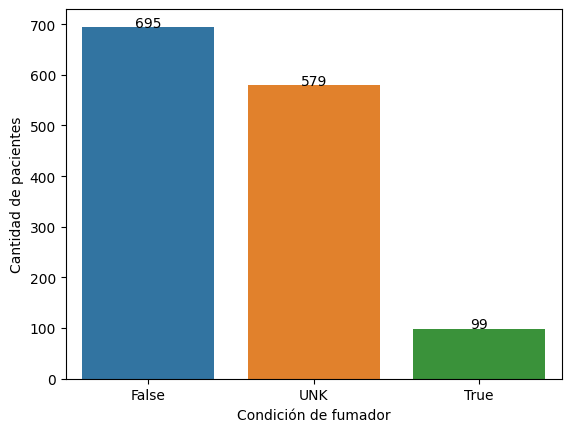

In [373]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.smoke.value_counts().index):
  condition.append(v)
  quan.append(pat_data.smoke.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Condición de fumador')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')


###b) Bebedor

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


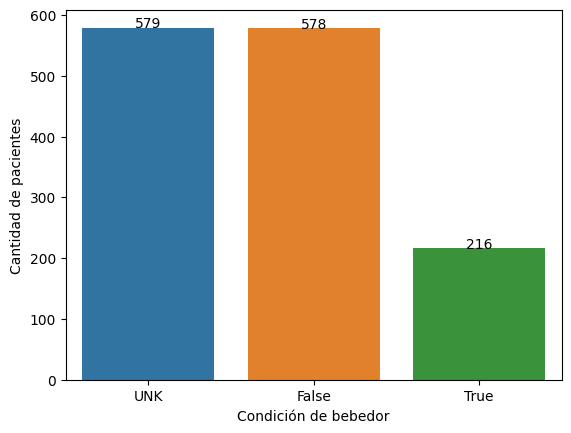

In [374]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.drink.value_counts().index):
  condition.append(v)
  quan.append(pat_data.drink.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Condición de bebedor')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')


###c) Origen padre

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

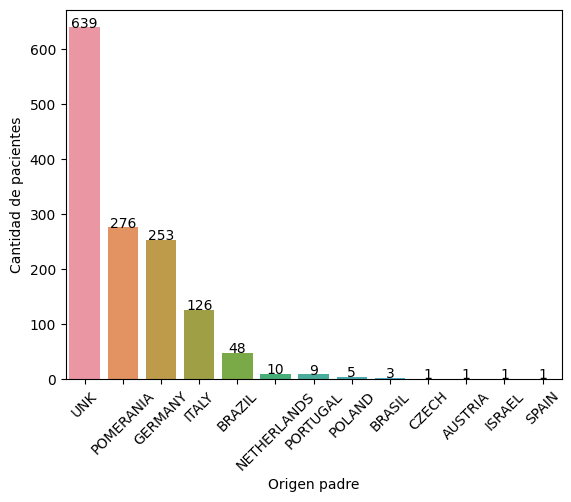

In [375]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.background_father.value_counts().index):
  condition.append(v)
  quan.append(pat_data.background_father.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Origen padre')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)



###d) Origen madre

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

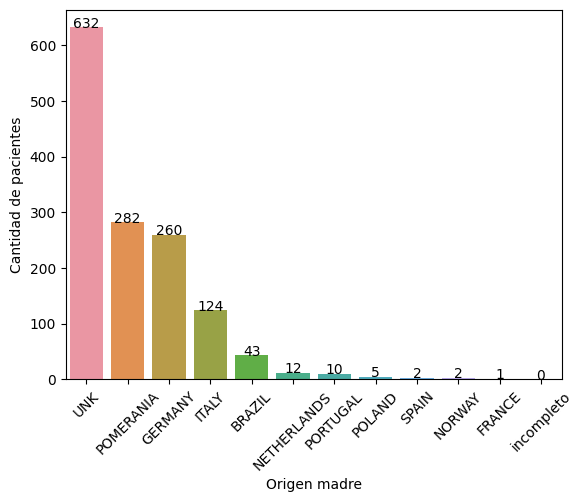

In [376]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.background_mother.value_counts().index):
  condition.append(v)
  quan.append(pat_data.background_mother.value_counts()[v])

condition.append('incompleto')
quan.append(pat_data.background_mother.isna().sum())

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Origen madre')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)

###e) Edad

In [377]:
pat_data.age.value_counts()

55    42
62    41
58    40
71    39
68    37
      ..
16     2
24     2
18     1
9      1
6      1
Name: age, Length: 84, dtype: int64

In [378]:
pat_data.age_group.value_counts()

70     333
60     330
80     251
50     175
40     113
90      94
30      42
20      20
100      8
10       7
Name: age_group, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


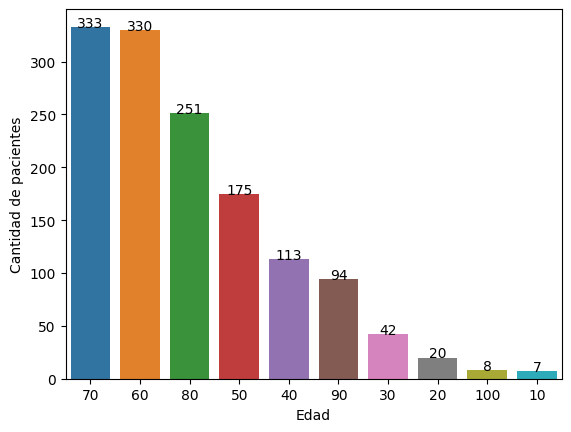

In [380]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.age_group.value_counts().index):
  condition.append(str(v))
  quan.append(pat_data.age_group.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Edad')


for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')


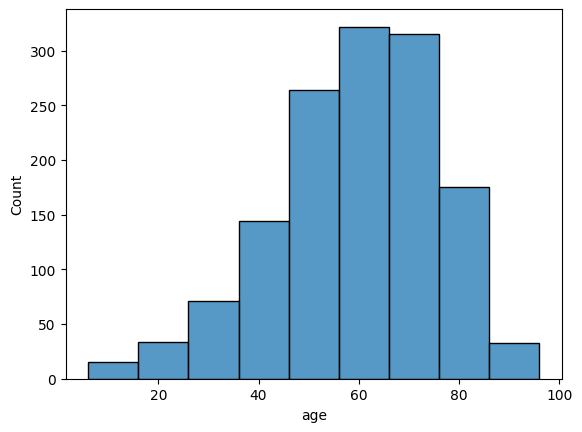

In [381]:
sns.histplot(x='age', data=pat_data, binwidth=10)

*La mayoría de los pacientes se encuentra en el rango de 50-70 años de edad*

###f) Pesticida

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


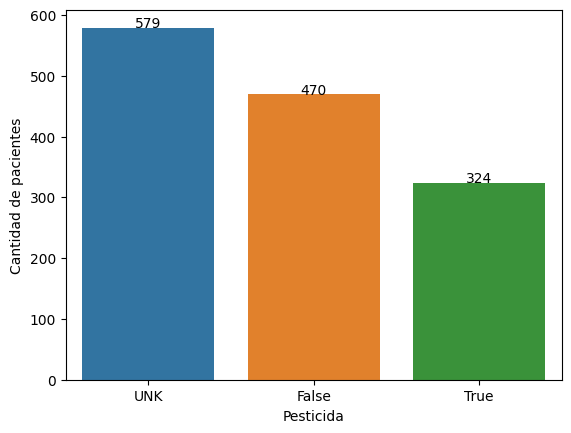

In [382]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.pesticide.value_counts().index):
  condition.append(str(v))
  quan.append(pat_data.pesticide.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Pesticida')


for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')


###g) Género

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


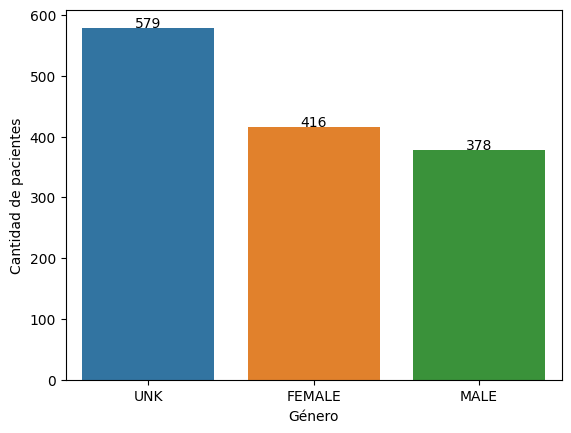

In [383]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.gender.value_counts().index):
  condition.append(str(v))
  quan.append(pat_data.gender.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Género')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')


###h) Antecedente cáncer

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


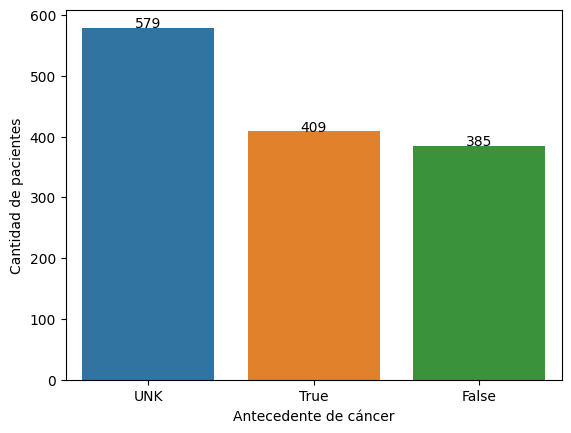

In [384]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.cancer_history.value_counts().index):
  condition.append(str(v))
  quan.append(pat_data.cancer_history.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Antecedente de cáncer')


for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')


###i) Antecedente cáncer de piel

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


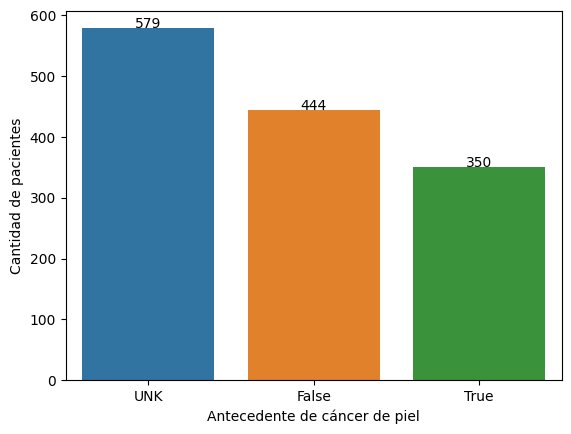

In [385]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.skin_cancer_history.value_counts().index):
  condition.append(str(v))
  quan.append(pat_data.skin_cancer_history.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Antecedente de cáncer de piel')


for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')


###j) Fototipo

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


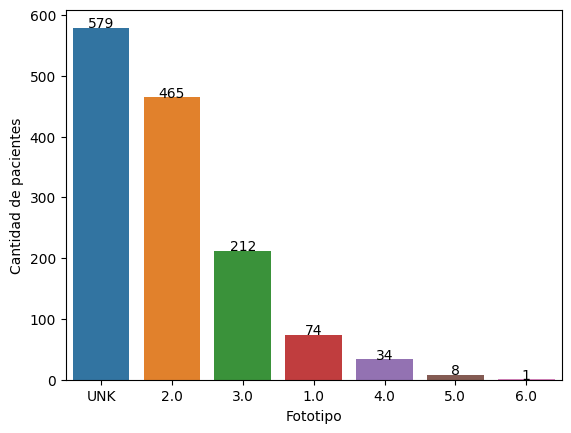

In [386]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.fitspatrick.value_counts().index):
  condition.append(str(v))
  quan.append(pat_data.fitspatrick.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Fototipo')


for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')


*Se identifica predominancia de fototipos II y III que corresponden a las tonalidades de piel intermedias*

###k) Agua potable

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None, None, None, None, None, None]

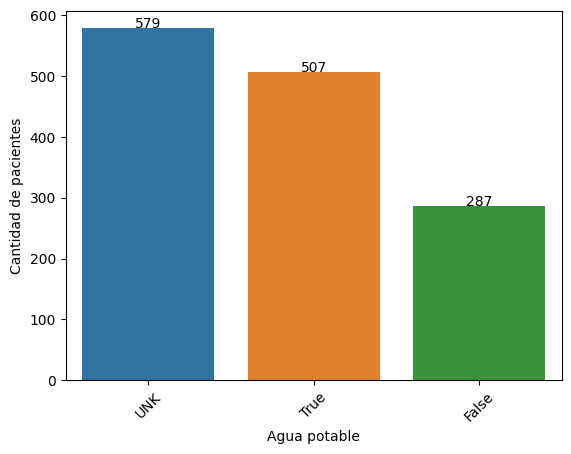

In [387]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.has_piped_water.value_counts().index):
  condition.append(v)
  quan.append(pat_data.has_piped_water.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Agua potable')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)

###l) Sistema cloacas

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[None, None, None, None, None, None]

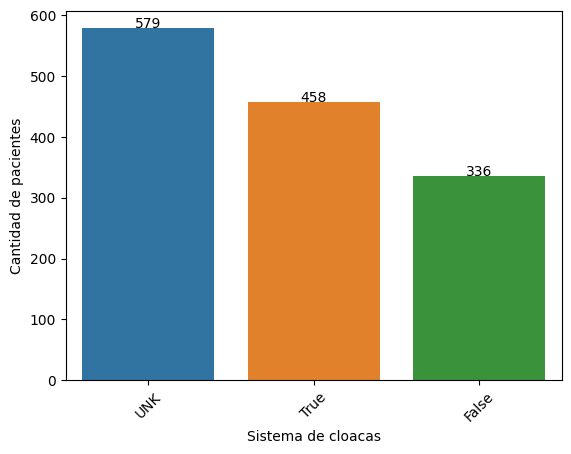

In [388]:
condition = []
quan = [] 

for i,v in enumerate(pat_data.has_sewage_system.value_counts().index):
  condition.append(v)
  quan.append(pat_data.has_sewage_system.value_counts()[v])

bar = sns.barplot(condition,quan)
bar.set(ylabel='Cantidad de pacientes', xlabel='Sistema de cloacas')

for i,v in enumerate((quan)):
  bar.text(i, v, str(v), horizontalalignment='center')

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)

*Con excepción de la edad, reportada para todos los pacientes, encontramos mucha información faltante referente a los mismos.*

#B) Visualización

##1) Metadata

*Para hacer la visualización y el análisis correspondiente, se procede a codificar todas las variables, dado que incluso las numéricas y booleanas poseen en algunos casos el valor "desconocido"*

In [389]:
data.columns

Index(['patient_id', 'lesion_id', 'smoke', 'drink', 'background_father',
       'background_mother', 'age', 'pesticide', 'gender',
       'skin_cancer_history', 'cancer_history', 'has_piped_water',
       'has_sewage_system', 'fitspatrick', 'region', 'diameter_1',
       'diameter_2', 'diagnostic', 'itch', 'grew', 'hurt', 'changed', 'bleed',
       'elevation', 'img_id', 'biopsed', 'malignancy', 'diameter_1_group',
       'diameter_2_group', 'age_group'],
      dtype='object')

In [390]:
data.dtypes

patient_id             object
lesion_id              object
smoke                  object
drink                  object
background_father      object
background_mother      object
age                     int64
pesticide              object
gender                 object
skin_cancer_history    object
cancer_history         object
has_piped_water        object
has_sewage_system      object
fitspatrick            object
region                 object
diameter_1             object
diameter_2             object
diagnostic             object
itch                   object
grew                   object
hurt                   object
changed                object
bleed                  object
elevation              object
img_id                 object
biopsed                  bool
malignancy             object
diameter_1_group       object
diameter_2_group       object
age_group              object
dtype: object

In [391]:
le = LabelEncoder()

###a) Características de pacientes

*Se tendrá en consideración toda la información disponible para los pacientes. En el caso de la edad, se tomará su agrupamiento de décadas.*

In [392]:
pat_data
predictores_paciente = ['smoke', 'drink', 'background_father', 'background_mother', 'age_group', 'pesticide', 'gender','skin_cancer_history', 'cancer_history', 'has_piped_water', 'has_sewage_system', 'fitspatrick']
targets = ['diagnostic', 'malignancy']

In [393]:
for i,v in enumerate(predictores_paciente):
  print('\nProcesando columna %s...'%(v))
  pat_data[v] = [str(x) for x in pat_data[v]]
  le.fit(pat_data[v])
  print(le.classes_)
  pat_data[v] = le.transform(pat_data[v])


Procesando columna smoke...
['False' 'True' 'UNK']

Procesando columna drink...
['False' 'True' 'UNK']

Procesando columna background_father...
['AUSTRIA' 'BRASIL' 'BRAZIL' 'CZECH' 'GERMANY' 'ISRAEL' 'ITALY'
 'NETHERLANDS' 'POLAND' 'POMERANIA' 'PORTUGAL' 'SPAIN' 'UNK']

Procesando columna background_mother...
['BRAZIL' 'FRANCE' 'GERMANY' 'ITALY' 'NETHERLANDS' 'NORWAY' 'POLAND'
 'POMERANIA' 'PORTUGAL' 'SPAIN' 'UNK']

Procesando columna age_group...
['10' '100' '20' '30' '40' '50' '60' '70' '80' '90']

Procesando columna pesticide...
['False' 'True' 'UNK']

Procesando columna gender...
['FEMALE' 'MALE' 'UNK']

Procesando columna skin_cancer_history...
['False' 'True' 'UNK']

Procesando columna cancer_history...
['False' 'True' 'UNK']

Procesando columna has_piped_water...
['False' 'True' 'UNK']

Procesando columna has_sewage_system...
['False' 'True' 'UNK']

Procesando columna fitspatrick...
['1.0' '2.0' '3.0' '4.0' '5.0' '6.0' 'UNK']


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [394]:
for i,v in enumerate(targets):
  print('\nProcesando columna %s...'%(v))
  pat_data[v] = [str(x) for x in pat_data[v]]
  le.fit(pat_data[v])
  print(le.classes_)
  pat_data[v] = le.transform(pat_data[v])


Procesando columna diagnostic...
['ACK' 'BCC' 'MEL' 'NEV' 'SCC' 'SEK']

Procesando columna malignancy...
['Benigno' 'Maligno']


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


*Dataset de pacientes únicos codificado.*

In [395]:
pat_data

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,cancer_history,has_piped_water,has_sewage_system,fitspatrick,region,diameter_1,diameter_2,diagnostic,itch,grew,hurt,changed,bleed,elevation,img_id,biopsed,malignancy,diameter_1_group,diameter_2_group,age_group
0,PAT_1516,LES_1765,2,2,12,10,8,2,2,2,2,2,2,6,ARM,UNK,UNK,3,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,0,UNK,UNK,0
1,PAT_46,LES_881,0,0,9,7,55,0,0,1,1,1,1,2,NECK,6,5,1,True,True,False,True,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,1,10,10,6
2,PAT_1545,LES_1867,2,2,12,10,77,2,2,2,2,2,2,6,FACE,UNK,UNK,0,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,0,UNK,UNK,8
3,PAT_1989,LES_4061,2,2,12,10,75,2,2,2,2,2,2,6,HAND,UNK,UNK,0,True,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,0,UNK,UNK,8
4,PAT_684,LES_1302,0,1,9,7,79,0,1,1,0,0,0,0,FOREARM,5,5,1,True,True,False,False,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,1,10,10,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2287,PAT_1294,LES_1031_b,2,2,12,10,35,2,2,2,2,2,2,6,FACE,UNK,UNK,0,True,False,True,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,0,UNK,UNK,4
2288,PAT_273,LES_421,0,0,9,7,41,1,1,0,0,0,0,1,FACE,9,5,1,True,UNK,True,UNK,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,1,10,10,5
2289,PAT_491,LES_934,0,0,9,7,43,1,0,1,1,0,0,1,FACE,9,5,4,True,UNK,False,UNK,True,True,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,1,10,10,5
2292,PAT_1343,LES_1217_b,2,2,12,10,74,2,2,2,2,2,2,6,FOREARM,UNK,UNK,5,False,False,False,False,False,False,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,0,UNK,UNK,8


In [396]:
features = pat_data[predictores_paciente]
classes = pat_data[['diagnostic']]
malignancy = pat_data[['malignancy']]

X = features.to_numpy()
y = classes.to_numpy()
y_bin = malignancy.to_numpy()

####Visualización para múltiples categorías (n = 6)

perplexity=5 in 42 sec


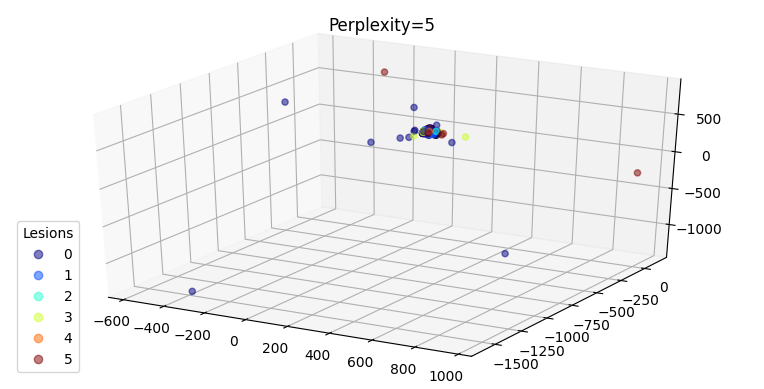

perplexity=10 in 23 sec


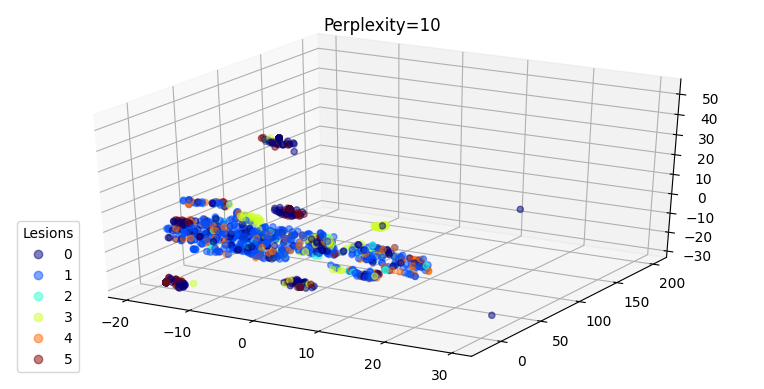

perplexity=15 in 23 sec


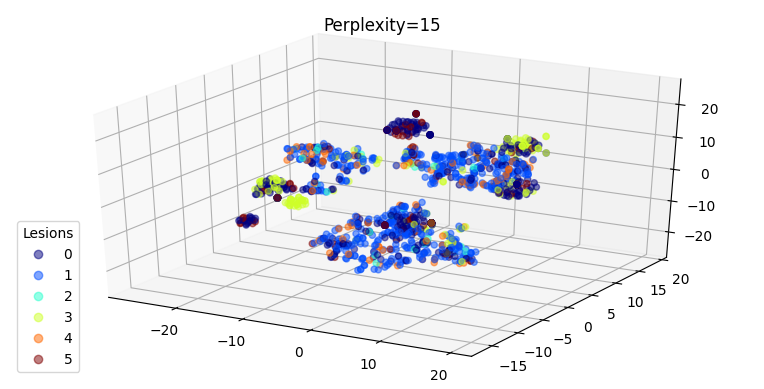

perplexity=25 in 23 sec


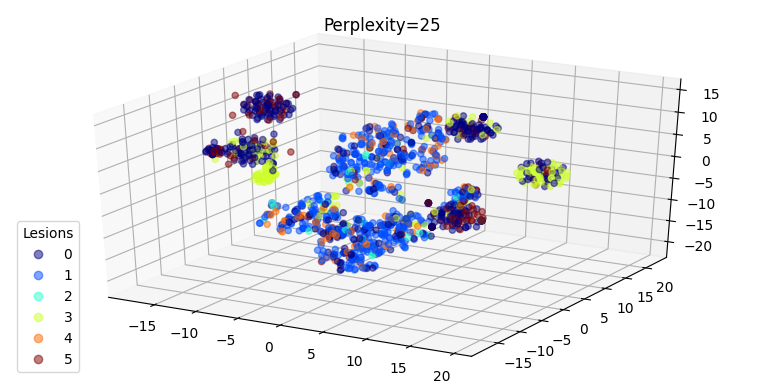

perplexity=35 in 31 sec


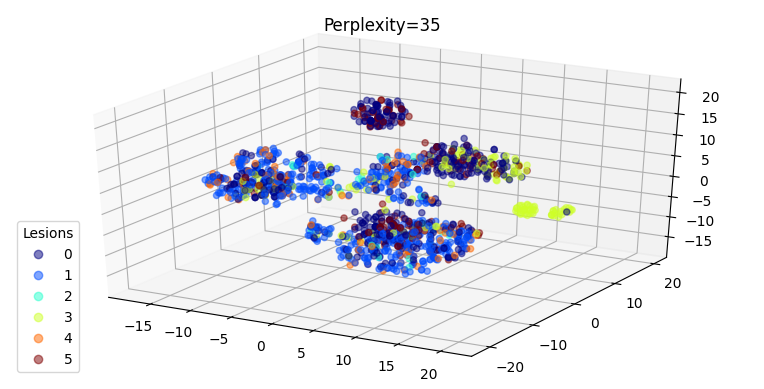

perplexity=45 in 58 sec


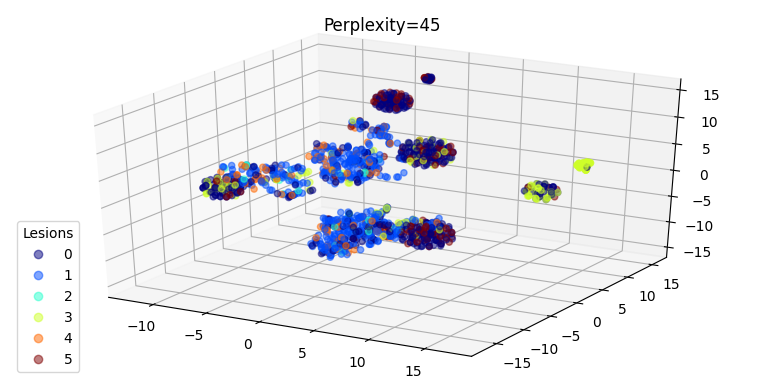

perplexity=50 in 27 sec


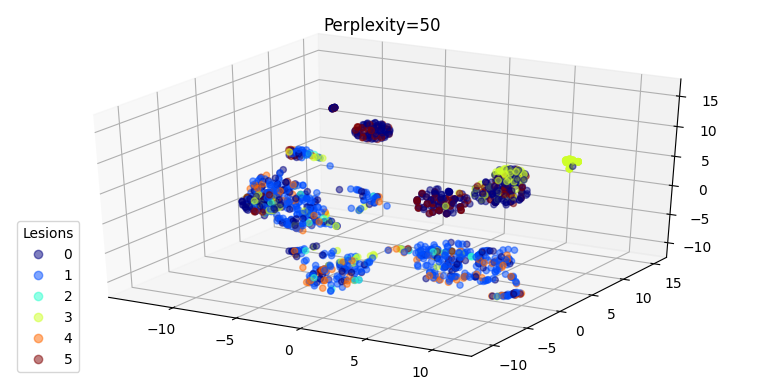

In [397]:
perplexities = [5, 10, 15, 25, 35, 45, 50]

cmap_classes = plt.cm.get_cmap('jet', len(np.unique(y)))

for i, perplexity in enumerate(perplexities):
    fig = plt.figure(figsize=plt.figaspect(0.5))  
    ax = fig.add_subplot(111, projection='3d')
   
    t0 = time()
    tsne = TSNE(n_components=3, init='random',random_state=0, perplexity=perplexity)
    tsne_features = tsne.fit_transform(X)
    t1 = time()
    print("perplexity=%d in %.2g sec" % (perplexity, t1 - t0))
    ax.set_title("Perplexity=%d" % perplexity)
    scatter = ax.scatter3D(tsne_features[:,0], tsne_features[:,1], tsne_features[:,2],cmap=cmap_classes, c= y,alpha=0.5)
    ax.legend(*scatter.legend_elements(),loc="lower left", title="Lesions")

    plt.show()


####Visualización para problema binario

perplexity=5 in 42 sec


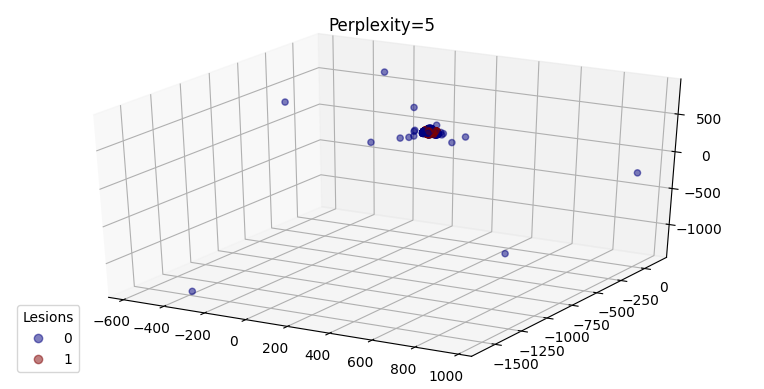

perplexity=10 in 23 sec


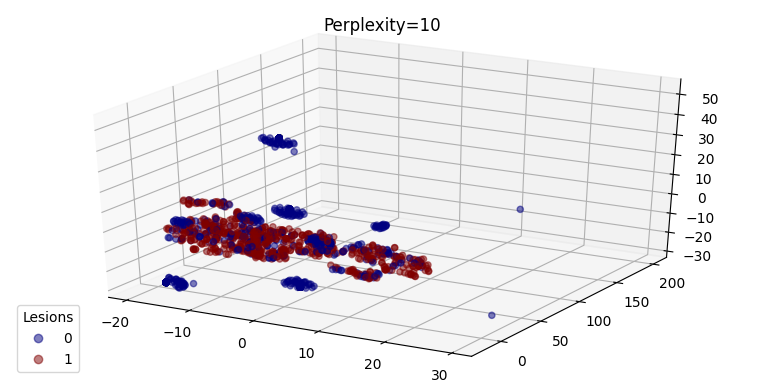

perplexity=15 in 23 sec


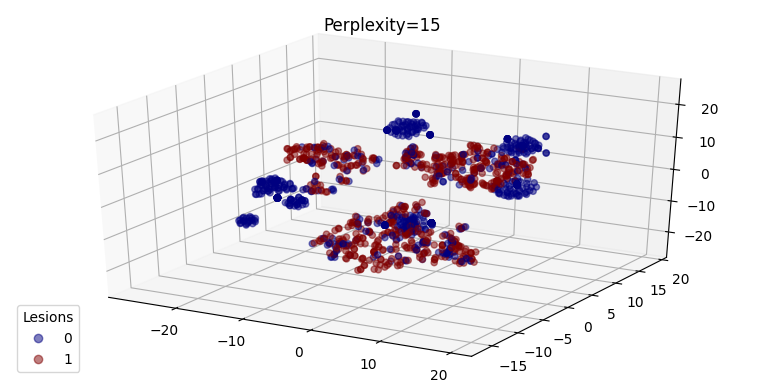

perplexity=25 in 23 sec


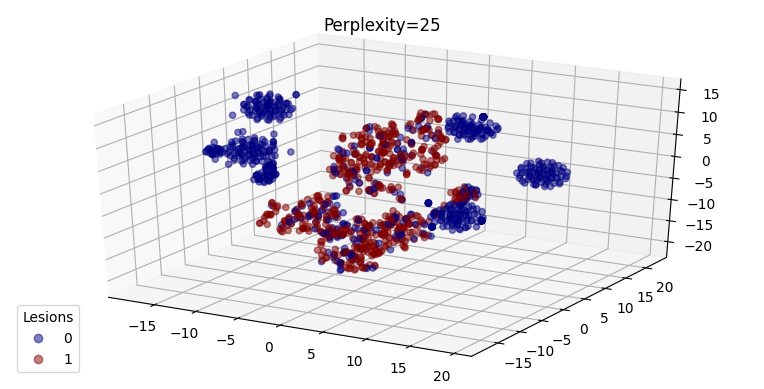

perplexity=35 in 24 sec


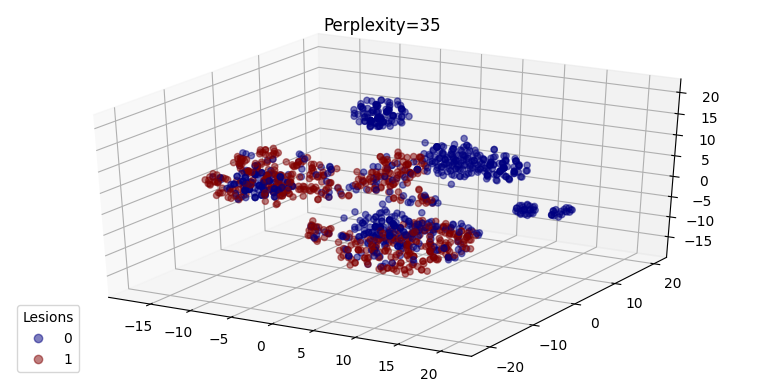

perplexity=45 in 26 sec


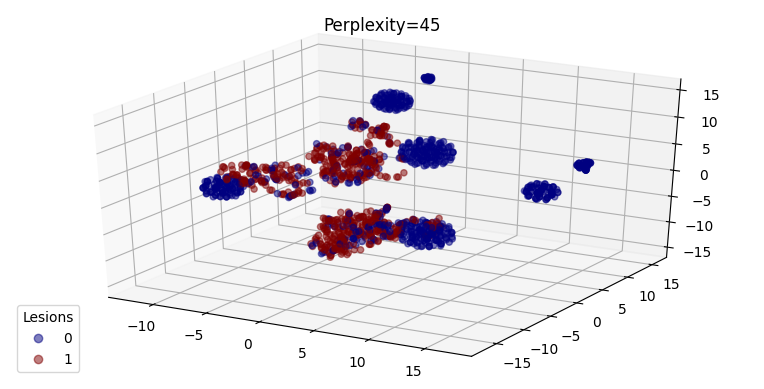

perplexity=50 in 26 sec


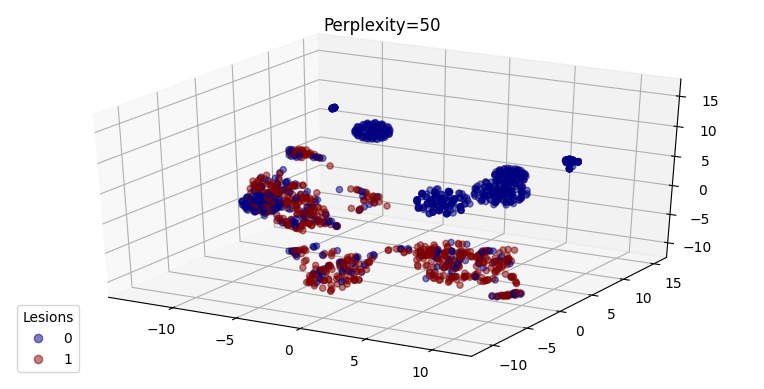

In [398]:
perplexities = [5, 10, 15, 25, 35, 45, 50]

cmap_classes = plt.cm.get_cmap('jet', len(np.unique(y_bin)))

for i, perplexity in enumerate(perplexities):
    fig = plt.figure(figsize=plt.figaspect(0.5))  
    ax = fig.add_subplot(111, projection='3d')
   
    t0 = time()
    tsne = TSNE(n_components=3, init='random',random_state=0, perplexity=perplexity)
    tsne_features = tsne.fit_transform(X)
    t1 = time()
    print("perplexity=%d in %.2g sec" % (perplexity, t1 - t0))
    ax.set_title("Perplexity=%d" % perplexity)
    scatter = ax.scatter3D(tsne_features[:,0], tsne_features[:,1], tsne_features[:,2],cmap=cmap_classes, c= y_bin,alpha=0.5)
    ax.legend(*scatter.legend_elements(),loc="lower left", title="Lesions")

    plt.show()


*La visualización usando el hiperparámetro perplejidad en valores altos permite diferenciar en cierta medida una tendencia a la separación entre lesiones malignas y benignas, algo que no ocurrió para el caso de múltiples categorías.*

###b) Características de lesiones

*Se opta por no incluir a las variables "biopsia", "diámetro_1" y "diámetro_2" en el análisis, dado que no existen lesiones malignas que no hayan sido biopsiadas ni medidas. Esto podría condicionar a los algoritmos a diferenciar las lesiones por la ausencia/presencia de biopsias y mediciones y no por verdaderos predictores.*



In [399]:
predictores_lesion = ['region', 'itch', 'grew', 'hurt', 'changed', 'bleed','elevation'] #'diameter_1', 'diameter_2', 'biopsed']
targets = ['diagnostic', 'malignancy']

In [400]:
les_data_reducida = les_data.copy()
drop_cols = []

for v in (les_data_reducida.columns):
  
  if (v not in predictores_lesion and v not in targets):
    les_data_reducida.drop([v], axis=1, inplace=True)
les_data_reducida

,region,diagnostic,itch,grew,hurt,changed,bleed,elevation,malignancy
0,ARM,NEV,False,False,False,False,False,False,Benigno
1,NECK,BCC,True,True,False,True,True,True,Maligno
2,FACE,ACK,True,False,False,False,False,False,Benigno
3,HAND,ACK,True,False,False,False,False,False,Benigno
4,FOREARM,BCC,True,True,False,False,True,True,Maligno
...,...,...,...,...,...,...,...,...,...
2288,FACE,BCC,True,UNK,True,UNK,True,True,Maligno
2289,FACE,SCC,True,UNK,False,UNK,True,True,Maligno
2290,HAND,ACK,True,False,False,False,False,False,Benigno
2292,FOREARM,SEK,False,False,False,False,False,False,Benigno


In [401]:
for i,v in enumerate(predictores_lesion):
  print('\nProcesando columna %s...'%(v))
  les_data_reducida[v] = [str(x) for x in les_data_reducida[v]]
  le.fit(les_data_reducida[v])
  print(le.classes_)
  les_data_reducida[v] = le.transform(les_data_reducida[v])

for i,v in enumerate(targets):
  print('\nProcesando columna %s...'%(v))
  les_data_reducida[v] = [str(x) for x in les_data_reducida[v]]
  le.fit(les_data_reducida[v])
  print(le.classes_)
  les_data_reducida[v] = le.transform(les_data_reducida[v])


Procesando columna region...
['ABDOMEN' 'ARM' 'BACK' 'CHEST' 'EAR' 'FACE' 'FOOT' 'FOREARM' 'HAND' 'LIP'
 'NECK' 'NOSE' 'SCALP' 'THIGH']

Procesando columna itch...
['False' 'True' 'UNK']

Procesando columna grew...
['False' 'True' 'UNK']

Procesando columna hurt...
['False' 'True' 'UNK']

Procesando columna changed...
['False' 'True' 'UNK']

Procesando columna bleed...
['False' 'True' 'UNK']

Procesando columna elevation...
['False' 'True' 'UNK']

Procesando columna diagnostic...
['ACK' 'BCC' 'MEL' 'NEV' 'SCC' 'SEK']

Procesando columna malignancy...
['Benigno' 'Maligno']


In [402]:
features = les_data_reducida[predictores_lesion]
classes = les_data_reducida[['diagnostic']]
malignancy = les_data_reducida[['malignancy']]

X = features.to_numpy()
y = classes.to_numpy()
y_bin = malignancy.to_numpy()

*Dataset de lesiones únicas codificado.*

In [403]:
les_data_reducida

,region,diagnostic,itch,grew,hurt,changed,bleed,elevation,malignancy
0,1,3,0,0,0,0,0,0,0
1,10,1,1,1,0,1,1,1,1
2,5,0,1,0,0,0,0,0,0
3,8,0,1,0,0,0,0,0,0
4,7,1,1,1,0,0,1,1,1
...,...,...,...,...,...,...,...,...,...
2288,5,1,1,2,1,2,1,1,1
2289,5,4,1,2,0,2,1,1,1
2290,8,0,1,0,0,0,0,0,0
2292,7,5,0,0,0,0,0,0,0


####Visualización para múltiples categorías (n = 6)

perplexity=5 in 51 sec


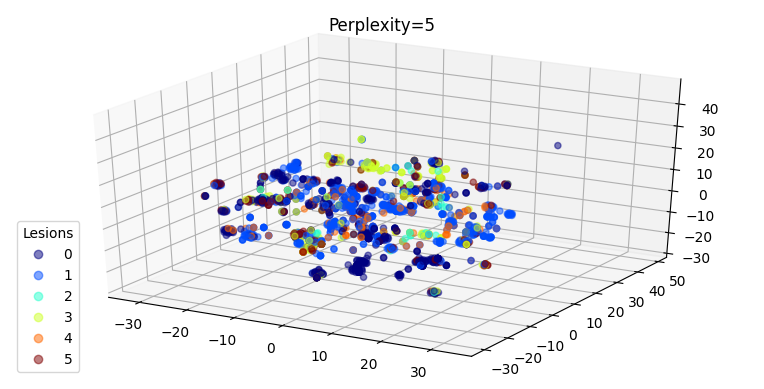

perplexity=10 in 33 sec


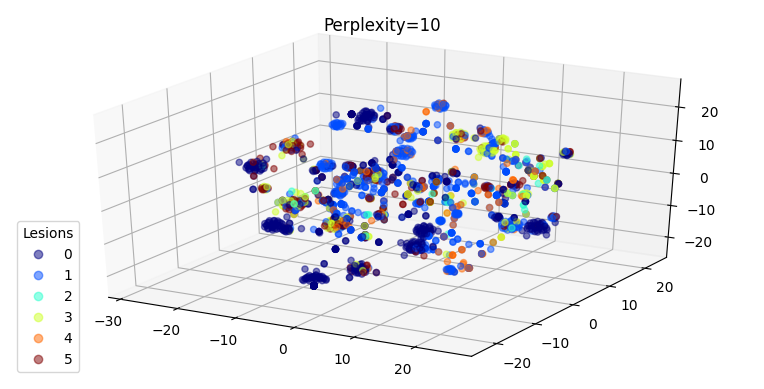

perplexity=15 in 33 sec


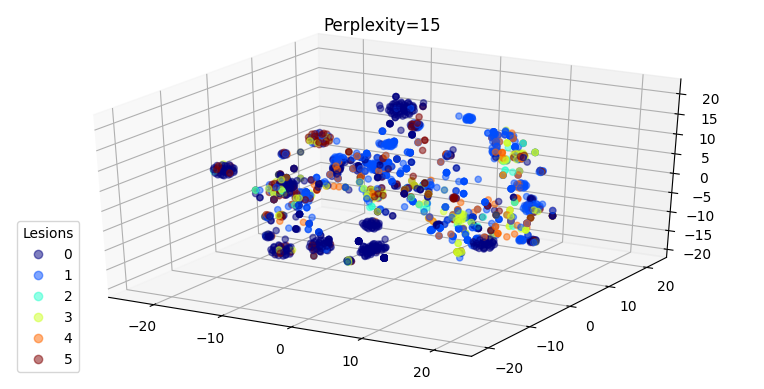

perplexity=25 in 33 sec


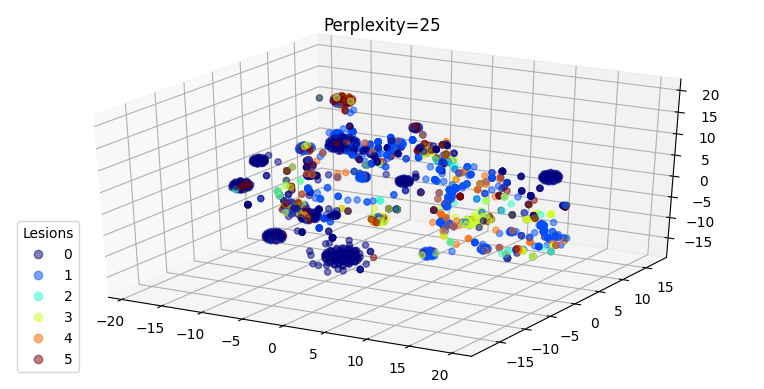

perplexity=35 in 34 sec


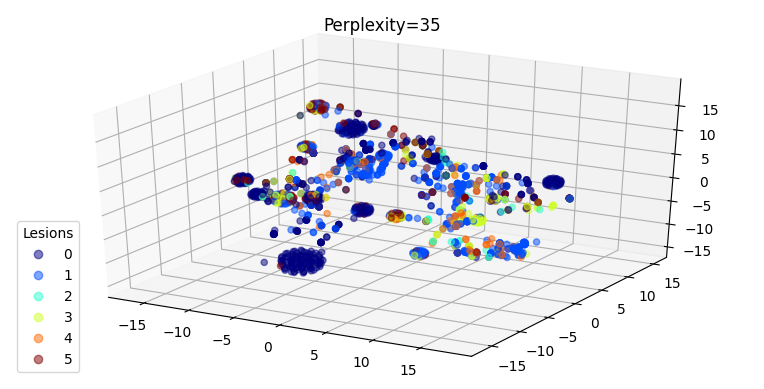

perplexity=45 in 37 sec


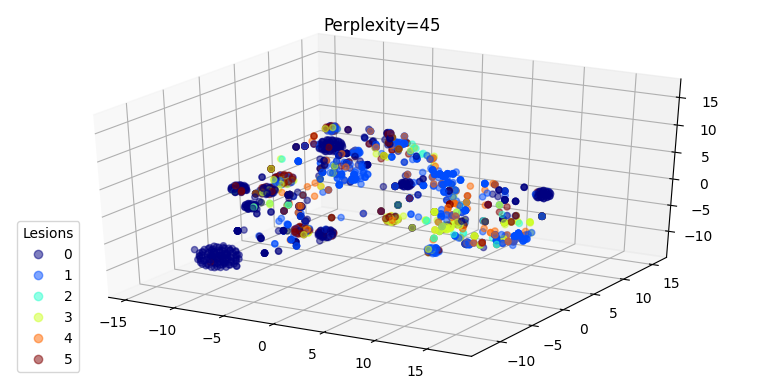

perplexity=50 in 38 sec


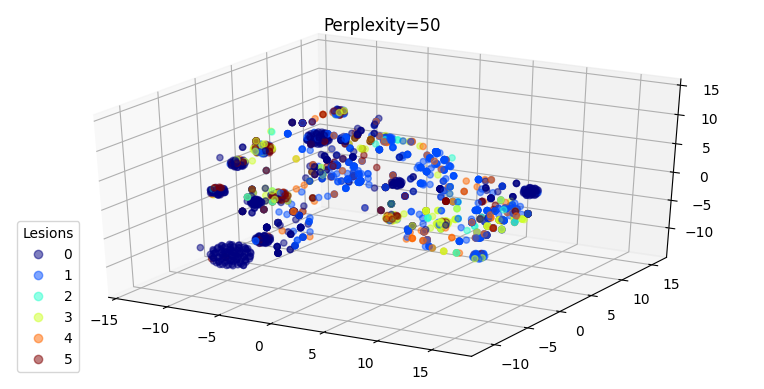

In [404]:
perplexities = [5, 10, 15, 25, 35, 45, 50]

cmap_classes = plt.cm.get_cmap('jet', len(np.unique(y)))

for i, perplexity in enumerate(perplexities):
    fig = plt.figure(figsize=plt.figaspect(0.5))  
    ax = fig.add_subplot(111, projection='3d')
   
    t0 = time()
    tsne = TSNE(n_components=3, init='random',random_state=0, perplexity=perplexity)
    tsne_features = tsne.fit_transform(X)
    t1 = time()
    print("perplexity=%d in %.2g sec" % (perplexity, t1 - t0))
    ax.set_title("Perplexity=%d" % perplexity)
    scatter = ax.scatter3D(tsne_features[:,0], tsne_features[:,1], tsne_features[:,2],cmap=cmap_classes, c= y,alpha=0.5)
    ax.legend(*scatter.legend_elements(),loc="lower left", title="Lesions")

    plt.show()


####Visualización para problema binario

perplexity=5 in 49 sec


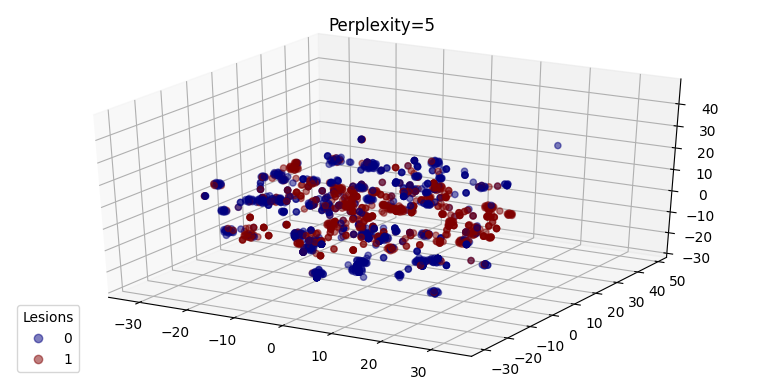

perplexity=10 in 33 sec


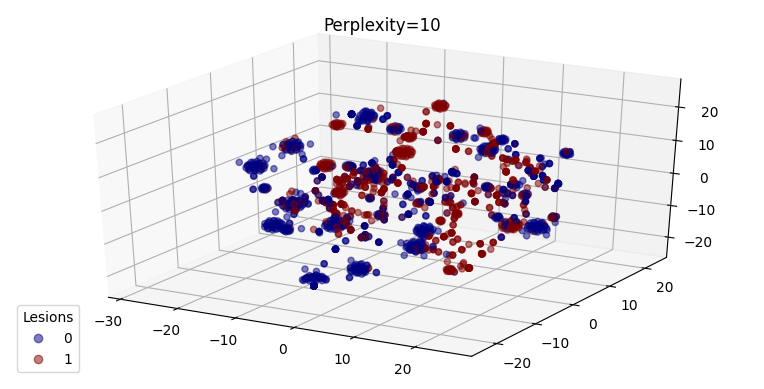

perplexity=15 in 33 sec


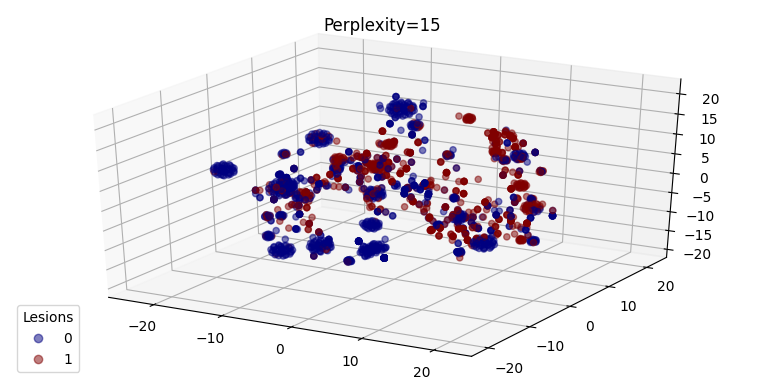

perplexity=25 in 33 sec


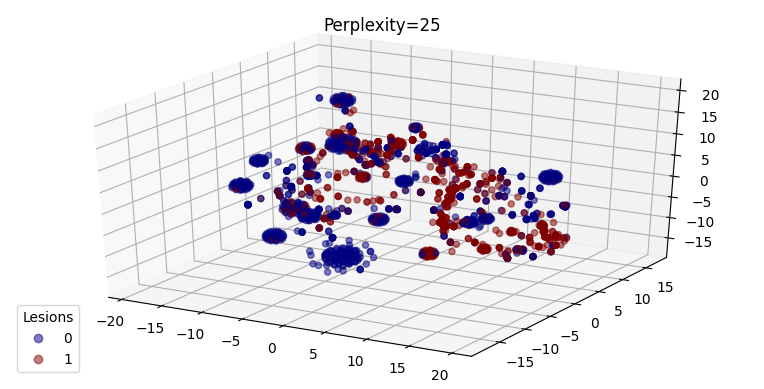

perplexity=35 in 34 sec


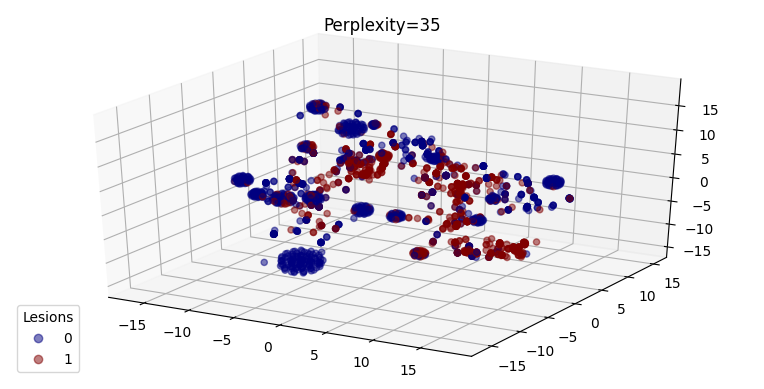

perplexity=45 in 37 sec


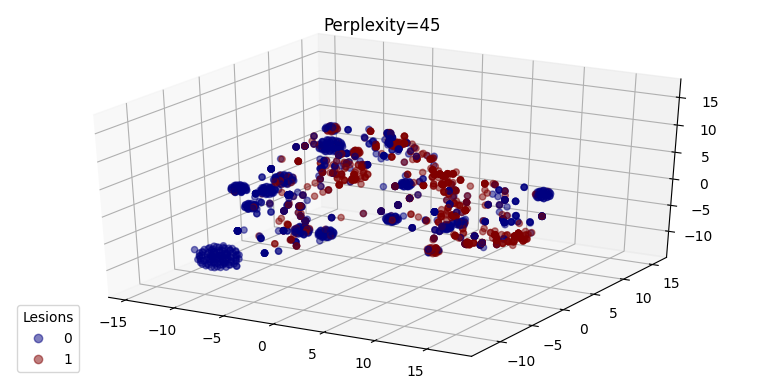

perplexity=50 in 38 sec


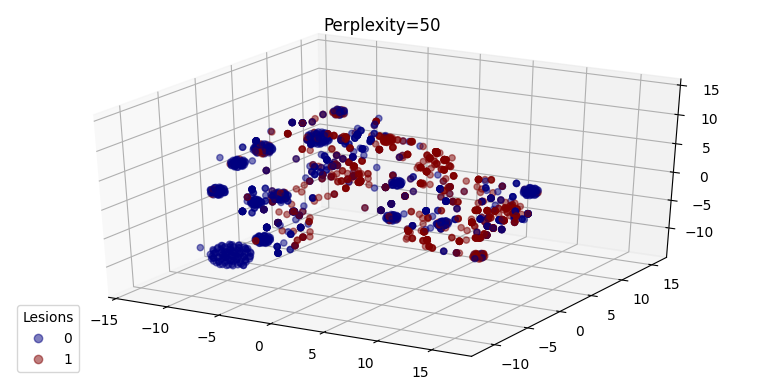

In [405]:
perplexities = [5, 10, 15, 25, 35, 45, 50]

cmap_classes = plt.cm.get_cmap('jet', len(np.unique(y_bin)))

for i, perplexity in enumerate(perplexities):
    fig = plt.figure(figsize=plt.figaspect(0.5))  
    ax = fig.add_subplot(111, projection='3d')
   
    t0 = time()
    tsne = TSNE(n_components=3, init='random',random_state=0, perplexity=perplexity)
    tsne_features = tsne.fit_transform(X)
    t1 = time()
    print("perplexity=%d in %.2g sec" % (perplexity, t1 - t0))
    ax.set_title("Perplexity=%d" % perplexity)
    scatter = ax.scatter3D(tsne_features[:,0], tsne_features[:,1], tsne_features[:,2],cmap=cmap_classes, c= y_bin,alpha=0.5)
    ax.legend(*scatter.legend_elements(),loc="lower left", title="Lesions")

    plt.show()


*Al visualizar las características de lesiones coloreadas en base al diagnóstico o condición de malignidad, no se identifica una clara diferenciación entre las categorías de interés, aunque sí se observan agrupamientos aislados.*

##2) Imágenes originales 

*Carga y redimensionamiento de todas las imágenes*

In [ ]:
all_image_path = data.img_id

X = []
img_h, img_w = 224, 224

for i,v in enumerate(all_image_path):
  img = cv2.imread(v)
  img = cv2.resize(img, (img_h, img_w))
  X.append(img)

X = np.asarray(X)
X.shape

In [ ]:
X_1d =  X.reshape(-1,X[0].size)
X_1d.shape

In [406]:
image_data = data.copy()
predictores = ['smoke', 'drink', 'background_father', 'background_mother', 'pesticide', 'gender', 'age_group','skin_cancer_history', 'cancer_history', 'has_piped_water', 'has_sewage_system','fitspatrick', 'region', 'itch', 'grew', 'hurt', 'changed', 'bleed','elevation']#, 'diameter_1', 'diameter_2', 'biopsed']
targets = ['diagnostic', 'malignancy']

In [408]:
for i,v in enumerate(predictores):
  print('\nProcesando columna %s...'%(v))
  image_data[v] = [str(x) for x in image_data[v]]
  le.fit(image_data[v])
  print(le.classes_)
  image_data[v] = le.transform(image_data[v])

for i,v in enumerate(targets):
  print('\nProcesando columna %s...'%(v))
  image_data[v] = [str(x) for x in image_data[v]]
  le.fit(image_data[v])
  print(le.classes_)
  image_data[v] = le.transform(image_data[v])


Procesando columna smoke...
['False' 'True' 'UNK']

Procesando columna drink...
['False' 'True' 'UNK']

Procesando columna background_father...
['AUSTRIA' 'BRASIL' 'BRAZIL' 'CZECH' 'GERMANY' 'ISRAEL' 'ITALY'
 'NETHERLANDS' 'POLAND' 'POMERANIA' 'PORTUGAL' 'SPAIN' 'UNK']

Procesando columna background_mother...
['BRAZIL' 'FRANCE' 'GERMANY' 'ITALY' 'NETHERLANDS' 'NORWAY' 'POLAND'
 'POMERANIA' 'PORTUGAL' 'SPAIN' 'UNK']

Procesando columna pesticide...
['False' 'True' 'UNK']

Procesando columna gender...
['FEMALE' 'MALE' 'UNK']

Procesando columna age_group...
['10' '100' '20' '30' '40' '50' '60' '70' '80' '90']

Procesando columna skin_cancer_history...
['False' 'True' 'UNK']

Procesando columna cancer_history...
['False' 'True' 'UNK']

Procesando columna has_piped_water...
['False' 'True' 'UNK']

Procesando columna has_sewage_system...
['False' 'True' 'UNK']

Procesando columna fitspatrick...
['1.0' '2.0' '3.0' '4.0' '5.0' '6.0' 'UNK']

Procesando columna region...
['ABDOMEN' 'ARM' 'BACK

*Dataset original codificado completamente.*

In [409]:
image_data

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,cancer_history,has_piped_water,has_sewage_system,fitspatrick,region,diameter_1,diameter_2,diagnostic,itch,grew,hurt,changed,bleed,elevation,img_id,biopsed,malignancy,diameter_1_group,diameter_2_group,age_group
0,PAT_1516,LES_1765,2,2,12,10,8,2,2,2,2,2,2,6,1,UNK,UNK,3,0,0,0,0,0,0,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,0,UNK,UNK,0
1,PAT_46,LES_881,0,0,9,7,55,0,0,1,1,1,1,2,10,6,5,1,1,1,0,1,1,1,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,1,10,10,6
2,PAT_1545,LES_1867,2,2,12,10,77,2,2,2,2,2,2,6,5,UNK,UNK,0,1,0,0,0,0,0,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,0,UNK,UNK,8
3,PAT_1989,LES_4061,2,2,12,10,75,2,2,2,2,2,2,6,8,UNK,UNK,0,1,0,0,0,0,0,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,0,UNK,UNK,8
4,PAT_684,LES_1302,0,1,9,7,79,0,1,1,0,0,0,0,7,5,5,1,1,1,0,0,1,1,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,1,10,10,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,PAT_1708,LES_3156,2,2,12,10,73,2,2,2,2,2,2,6,8,UNK,UNK,0,1,0,0,0,0,0,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,0,UNK,UNK,8
2291,PAT_46,LES_880,0,0,9,7,55,0,0,1,1,1,1,2,3,13,12,1,1,1,0,1,0,0,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,1,20,20,6
2292,PAT_1343,LES_1217_b,2,2,12,10,74,2,2,2,2,2,2,6,7,UNK,UNK,5,0,0,0,0,0,0,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,False,0,UNK,UNK,8
2293,PAT_326,LES_690,0,0,9,7,58,1,0,1,1,0,0,2,5,5,4,1,1,0,0,0,0,1,/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/...,True,1,10,10,6


In [410]:
classes = image_data[['diagnostic']]
malignancy = image_data[['malignancy']]
skin_tone = image_data[['fitspatrick']]

y = classes.to_numpy()
y_bin = malignancy.to_numpy()
y_tone = skin_tone.to_numpy()

####Visualización para múltiples categorías (n = 6)

perplexity=5 in 80 sec


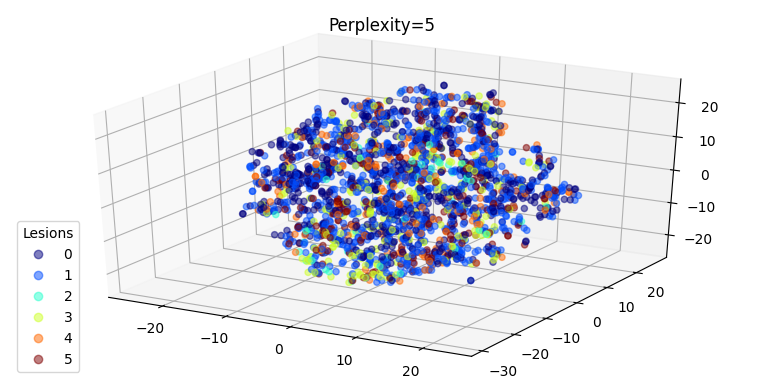

perplexity=10 in 81 sec


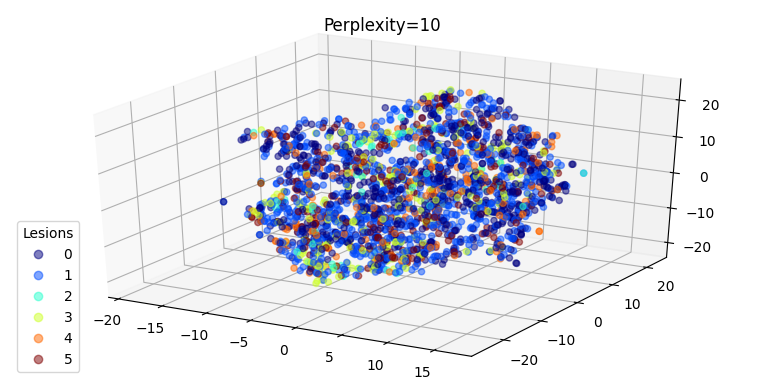

perplexity=15 in 1e+02 sec


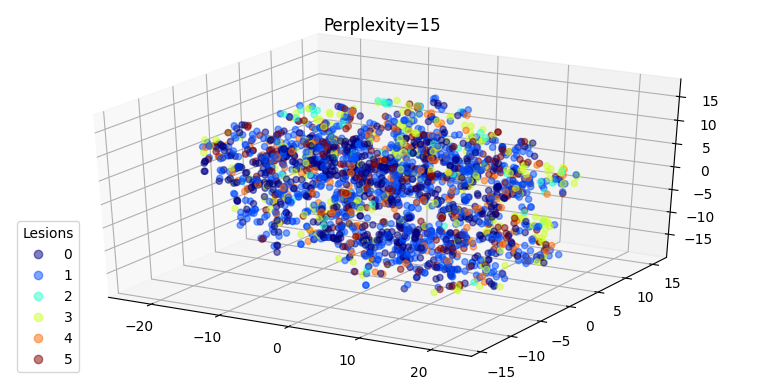

perplexity=25 in 98 sec


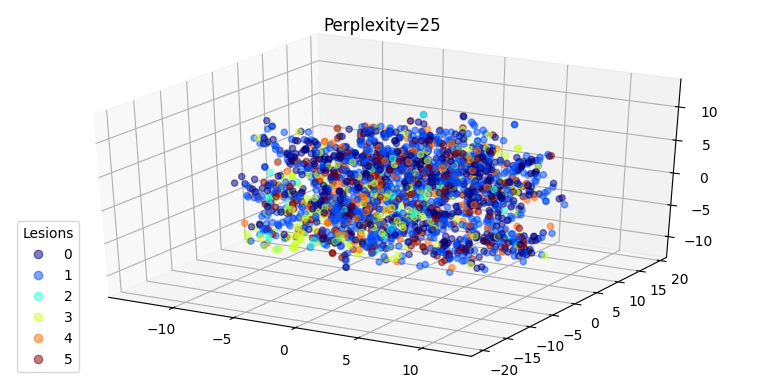

perplexity=35 in 82 sec


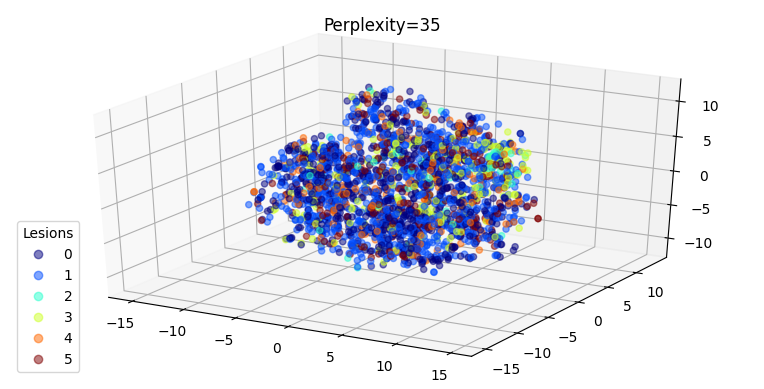

perplexity=45 in 88 sec


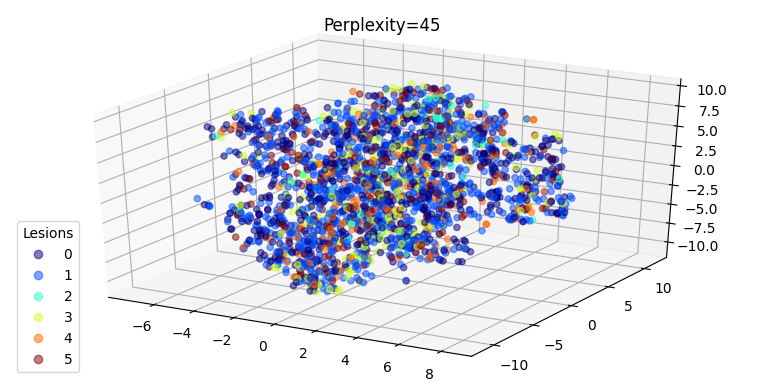

perplexity=50 in 82 sec


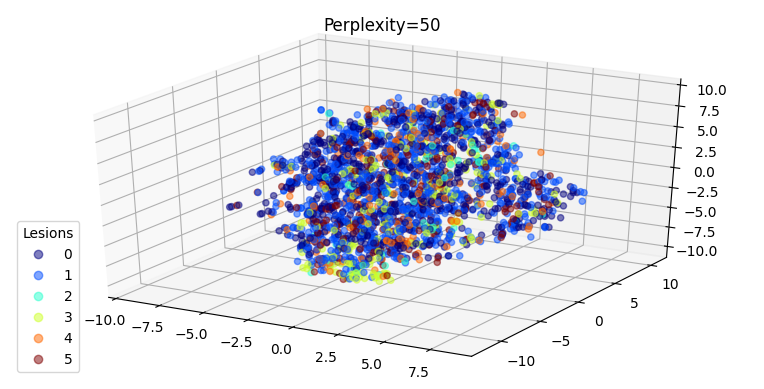

In [ ]:
perplexities = [5, 10, 15, 25, 35, 45, 50]

cmap_classes = plt.cm.get_cmap('jet', len(np.unique(y)))

pca = PCA(n_components=50)
X_pca = pca.fit_transform(X_1d)


for i, perplexity in enumerate(perplexities):
    fig = plt.figure(figsize=plt.figaspect(0.5))  
    ax = fig.add_subplot(111, projection='3d')
   
    t0 = time()
    tsne = TSNE(n_components=3, init='random',random_state=0, perplexity=perplexity)
    tsne_features = tsne.fit_transform(X_pca)
    t1 = time()
    print("perplexity=%d in %.2g sec" % (perplexity, t1 - t0))
    ax.set_title("Perplexity=%d" % perplexity)
    scatter = ax.scatter3D(tsne_features[:,0], tsne_features[:,1], tsne_features[:,2],cmap=cmap_classes, c= y,alpha=0.5)
    ax.legend(*scatter.legend_elements(),loc="lower left", title="Lesions")

    plt.show()

####Visualización para problema binario

perplexity=5 in 79 sec


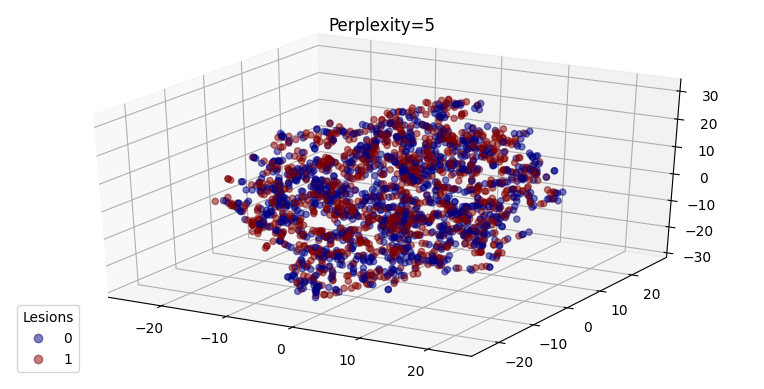

perplexity=10 in 93 sec


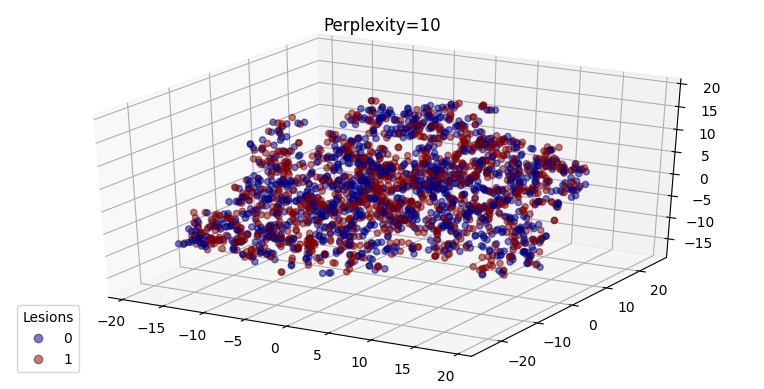

perplexity=15 in 77 sec


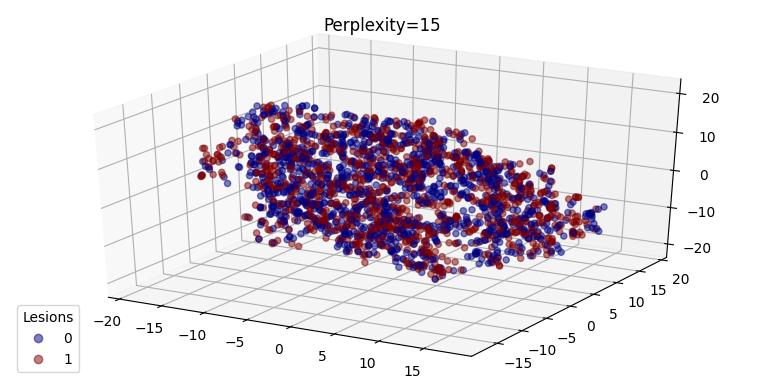

perplexity=25 in 81 sec


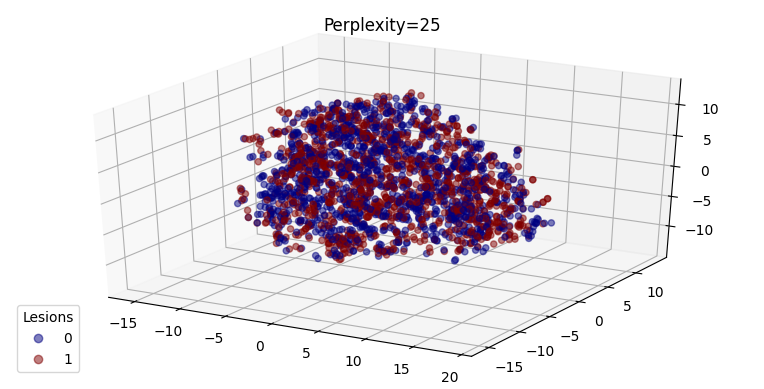

perplexity=35 in 96 sec


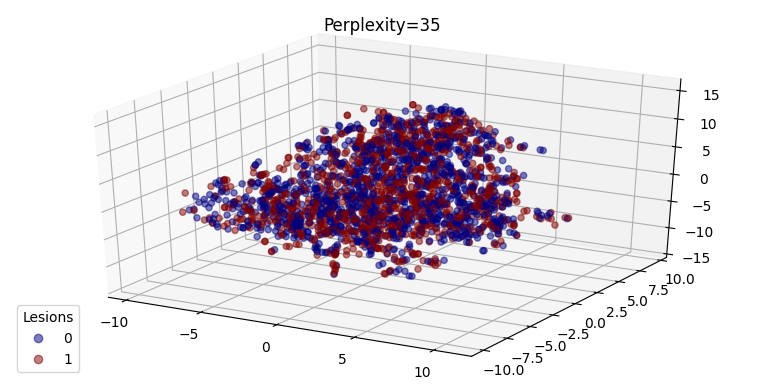

perplexity=45 in 93 sec


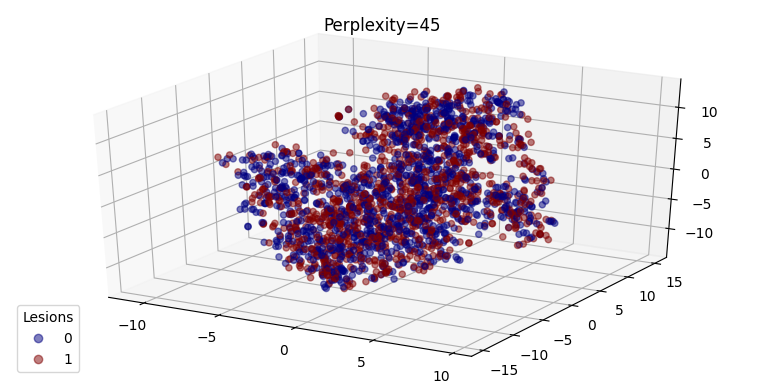

perplexity=50 in 91 sec


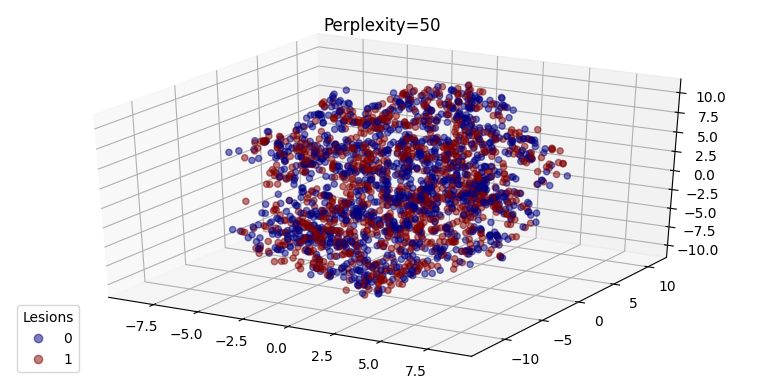

In [ ]:
perplexities = [5, 10, 15, 25, 35, 45, 50]

pca = PCA(n_components=50)
X_pca = pca.fit_transform(X_1d)

cmap_classes = plt.cm.get_cmap('jet', len(np.unique(y_bin)))

for i, perplexity in enumerate(perplexities):
    fig = plt.figure(figsize=plt.figaspect(0.5))  
    ax = fig.add_subplot(111, projection='3d')
   
    t0 = time()
    tsne = TSNE(n_components=3, init='random',random_state=0, perplexity=perplexity)
    tsne_features = tsne.fit_transform(X_pca)
    t1 = time()
    print("perplexity=%d in %.2g sec" % (perplexity, t1 - t0))
    ax.set_title("Perplexity=%d" % perplexity)
    scatter = ax.scatter3D(tsne_features[:,0], tsne_features[:,1], tsne_features[:,2],cmap=cmap_classes, c= y_bin,alpha=0.5)
    ax.legend(*scatter.legend_elements(),loc="lower left", title="Lesions")

    plt.show()

####Visualización para distintos fototipos

perplexity=5 in 1.3e+02 sec


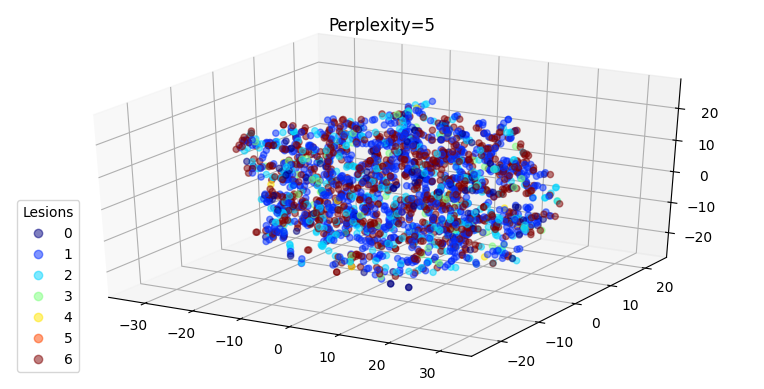

perplexity=10 in 79 sec


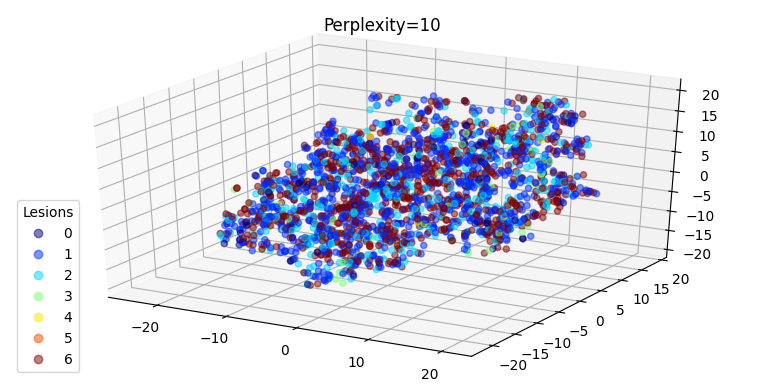

perplexity=15 in 1.1e+02 sec


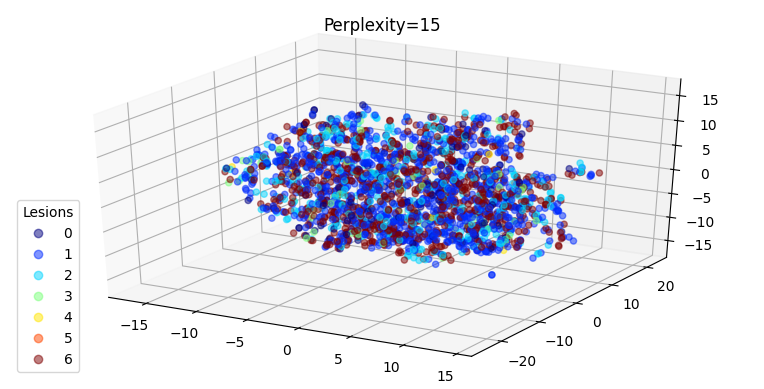

perplexity=25 in 91 sec


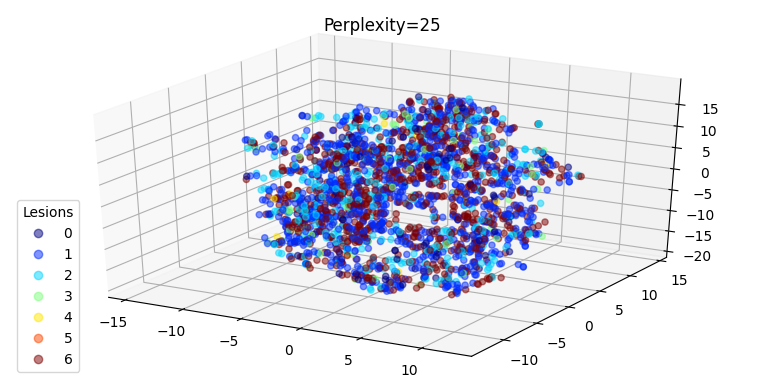

perplexity=35 in 99 sec


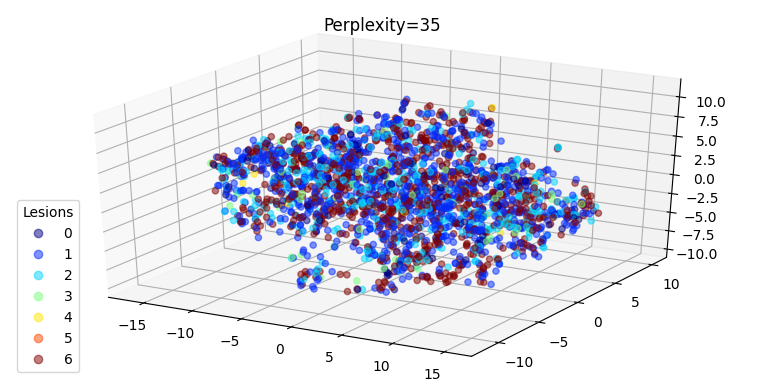

perplexity=45 in 91 sec


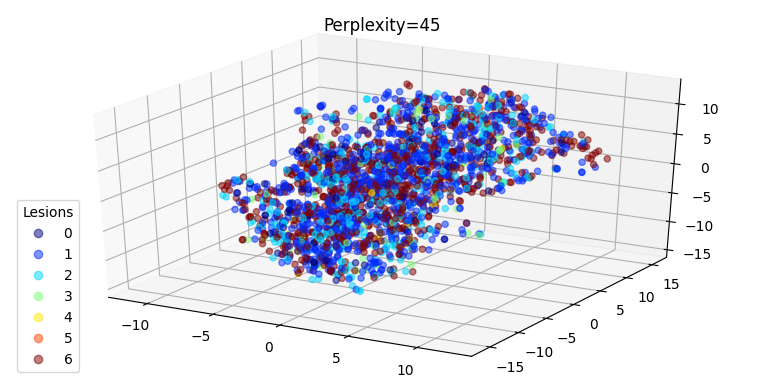

perplexity=50 in 1.1e+02 sec


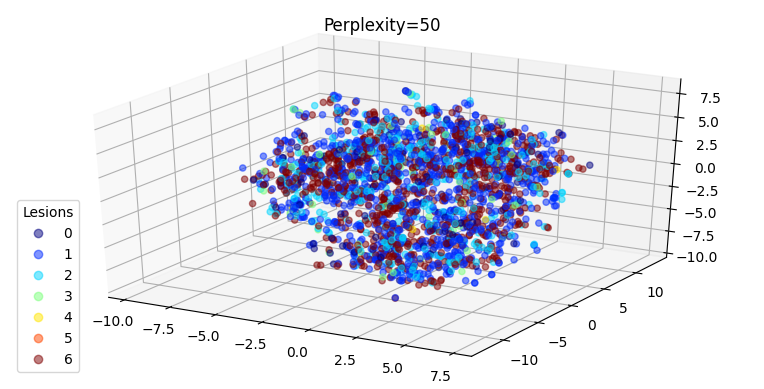

In [ ]:
perplexities = [5, 10, 15, 25, 35, 45, 50]

pca = PCA(n_components=50)
X_pca = pca.fit_transform(X_1d)

cmap_classes = plt.cm.get_cmap('jet', len(np.unique(y_tone)))

for i, perplexity in enumerate(perplexities):
    fig = plt.figure(figsize=plt.figaspect(0.5))  
    ax = fig.add_subplot(111, projection='3d')
   
    t0 = time()
    tsne = TSNE(n_components=3, init='random',random_state=0, perplexity=perplexity)
    tsne_features = tsne.fit_transform(X_pca)
    t1 = time()
    print("perplexity=%d in %.2g sec" % (perplexity, t1 - t0))
    ax.set_title("Perplexity=%d" % perplexity)
    scatter = ax.scatter3D(tsne_features[:,0], tsne_features[:,1], tsne_features[:,2],cmap=cmap_classes, c= y_tone,alpha=0.5)
    ax.legend(*scatter.legend_elements(),loc="lower left", title="Lesions")

    plt.show()

*Trabajar con las características proyectadas (usando PCA) de los píxeles crudos de las imágenes para visualizar a través de TSNE, no permitió distinguir algún tipo de agrupamiento con respecto al diagnóstico, la malignidad o el color de piel.*


#C) Modelos de Machine Learning

##1) Preparación de datos

*Visualización del dataset e incorporación de una columna con la localización de las imágenes en el directorio*

###a) Binarización

*Dado que no disponemos de muchas imágenes para las seis categorías que se consideran, se procede a binarizar el problema de modo de entrenar modelos para la diferenciación de lesiones cutáneas MALIGNAS (identificadas con 1) y BENIGNAS (identificadas con 0)*

In [411]:
x = np.asarray(data.img_id)
y = np.asarray(data.malignancy.replace('Maligno',1).replace('Benigno',0))

In [412]:
x,y

(array(['/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/PAT_1516_1765_530.jpg',
        '/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/PAT_46_881_939.jpg',
        '/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/PAT_1545_1867_547.jpg',
        ...,
        '/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/PAT_1343_1217_404.jpg',
        '/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/PAT_326_690_823.jpg',
        '/content/gdrive/My Drive/PAD UFES/PAD_UFES_20/PAT_1714_3189_989.jpg'],
       dtype=object), array([0, 1, 0, ..., 0, 1, 0]))

In [413]:
print('En total hay %d imágenes de lesiones BENIGNAS y %d imágenes de lesiones MALIGNAS --> relación %.2f' %(y.tolist().count(0), y.tolist().count(1), y.tolist().count(0)/y.tolist().count(1)))


En total hay 1208 imágenes de lesiones BENIGNAS y 1087 imágenes de lesiones MALIGNAS --> relación 1.11


###b) Partición train-test

*Para realizar la partición en subconjuntos de entrenamiento, validación y testeo se tuvo en consideración que un mismo paciente fuese incluido en uno y sólo uno de estos.*

In [416]:
rnd_state = 4
test_split = 0.10
val_split = 0.15

groups = data['patient_id']
gss = GroupShuffleSplit(n_splits=1, train_size=1-test_split, random_state=rnd_state)

for tr_index, test_index in gss.split(x, y, groups):
    x_tr, x_test = x[tr_index], x[test_index]
    y_tr, y_test = y[tr_index], y[test_index]

groups2 = data['patient_id'][tr_index]
gss2 = GroupShuffleSplit(n_splits=1, train_size=1-val_split, random_state=rnd_state)

old_idx = groups2.index.tolist()

for train_index_dummy, val_index_dummy in gss2.split(x_tr, y_tr, groups2):
    train_index = np.asarray(old_idx)[train_index_dummy]
    val_index = np.asarray(old_idx)[val_index_dummy]

x_train, x_val = x[train_index], x[val_index]
y_train, y_val = y[train_index], y[val_index]

In [417]:
#Verificación de que no exista superposición de índices
for i,v in enumerate (train_index):
  if v in test_index:
    print(v)

for i,v in enumerate (val_index):
  if v in test_index:
    print(v)

for i,v in enumerate (train_index):
  if v in val_index:
    print(v)

In [418]:
pat_train = data.patient_id[train_index]
pat_val = data.patient_id[val_index]
pat_test = data.patient_id[test_index]

In [419]:
#Verificación de que no exista superposición de pacientes
for i,v in enumerate (pat_train):
  if v in pat_test:
    print(v)

for i,v in enumerate (pat_val):
  if v in pat_test:
    print(v)

for i,v in enumerate (pat_train):
  if v in pat_val:
    print(v)

In [420]:
#Índices originales para recuperar la metadata
train_index, val_index, test_index

(array([   0,    3,    4, ..., 2289, 2292, 2294]),
 array([   1,    2,    8,   15,   16,   25,   27,   31,   32,   33,   34,
          36,   43,   53,   60,   67,   74,   90,  101,  106,  112,  121,
         135,  148,  151,  153,  164,  165,  170,  174,  180,  199,  200,
         204,  209,  210,  215,  244,  265,  271,  272,  274,  294,  296,
         299,  300,  305,  340,  345,  362,  369,  371,  374,  378,  379,
         380,  390,  402,  413,  414,  417,  419,  422,  430,  439,  440,
         447,  448,  457,  467,  468,  474,  478,  485,  487,  491,  501,
         502,  503,  514,  518,  542,  543,  552,  570,  572,  601,  603,
         625,  636,  642,  644,  647,  654,  660,  664,  676,  678,  679,
         687,  690,  695,  698,  699,  721,  746,  757,  762,  774,  776,
         791,  793,  798,  803,  807,  813,  818,  819,  832,  834,  845,
         856,  857,  858,  864,  866,  876,  877,  884,  897,  898,  909,
         915,  920,  924,  925,  926,  927,  930,  944,  946,

In [421]:
ix_train = np.arange(0, len(x_train))
ix_val = np.arange(0, len(x_val))
ix_test = np.arange(0, len(x_test))

In [422]:
x_train.shape, x_val.shape, x_test.shape, y_train.shape, y_val.shape, y_test.shape

((1734,), (326,), (235,), (1734,), (326,), (235,))

In [423]:
print('En entrenamiento hay %d BENIGNAS y %d MALIGNAS --> relación %.2f' %(y_train.tolist().count(0), y_train.tolist().count(1), y_train.tolist().count(0)/y_train.tolist().count(1)))
print('En validación hay %d BENIGNAS y %d MALIGNAS --> relación %.2f' %(y_val.tolist().count(0), y_val.tolist().count(1), y_val.tolist().count(0)/y_val.tolist().count(1)))
print('En testeo hay %d BENIGNAS y %d MALIGNAS --> relación %.2f' %(y_test.tolist().count(0), y_test.tolist().count(1), y_test.tolist().count(0)/y_test.tolist().count(1)))

En entrenamiento hay 939 BENIGNAS y 795 MALIGNAS --> relación 1.18
En validación hay 154 BENIGNAS y 172 MALIGNAS --> relación 0.90
En testeo hay 115 BENIGNAS y 120 MALIGNAS --> relación 0.96


###c) Procesamiento de imágenes

In [426]:
def rotation(img, angle):
    angle = int(random.uniform(-angle, angle))
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((int(w/2), int(h/2)), angle, 1)
    img = cv2.warpAffine(img, M, (w, h),borderMode= cv2.INTER_CUBIC)
    return img

def vertical_flip(img, flag):
    if flag:
        return cv2.flip(img, 0)
    else:
        return img
def horizontal_flip(img, flag):
    if flag:
        return cv2.flip(img, 1)
    else:
        return img


def fill(img, h, w):
    img = cv2.resize(img, (h, w), cv2.INTER_CUBIC)
    return img

def zoom(img, value):
    if value > 1 or value < 0:
        print('Value for zoom should be less than 1 and greater than 0')
        return img
    value = random.uniform(value, 1)
    h, w = img.shape[:2]
    h_taken = int(value*h)
    w_taken = int(value*w)
    h_start = random.randint(0, h-h_taken)
    w_start = random.randint(0, w-w_taken)
    img = img[h_start:h_start+h_taken, w_start:w_start+w_taken, :]
    img = fill(img, h, w)
    return img

def augmentation_fc(img_arr):

    if random.random() < 50 / 100.:
        img_arr = vertical_flip(img_arr, True)

    if random.random() < 50 / 100.:
        img_arr = horizontal_flip(img_arr, True)

    if random.random() < 75 / 100.:
        angles = np.arange(0,179,5)
        angle = random.choice(angles)
        img_arr =  rotation(img_arr, angle)

    if random.random() < 50 / 100.:
        values = np.arange(0.7,0.999, 0.005)
        value = random.choice(values)
        img_arr =  zoom(img_arr, value)
    
    
    return img_arr


In [427]:
def compute_normalization_3(x):

    mean =np.zeros(3)
    std = np.zeros(3)

    for i, v in enumerate(x):
        img = cv2.imread(v)
        img = img.astype('float32')/255.

        for channel in range(img.shape[2]):
            mean[channel] += img[:, :, channel].mean()
            std[channel] += img[:, :, channel].std()
        
    dataset_mean = mean/(len(x))
    dataset_std = std/(len(x))

    print(dataset_mean, dataset_std)

In [ ]:
compute_normalization_3(x)

[0.4621938  0.52256297 0.66520435] [0.10245821 0.10335288 0.09197754]


In [428]:
def BGR(image_path, dim, norm_dict=None, augment=False):
    img = cv2.imread(image_path)
    bgr_img = cv2.resize(img, (dim[1], dim[0]), interpolation=cv2.INTER_AREA)
    
    if (augment==True):
        bgr_img = augmentation_fc(bgr_img)  

    return bgr_img


In [429]:
def BGR_norm(image_path, dim, norm_dict, augment=False):
    
    img = cv2.imread(image_path)
    img = img.astype('float32')/255.

    mediaB = norm_dict['blue'][0] 
    sdB = norm_dict['blue'][1] 

    mediaG = norm_dict['green'][0]
    sdG = norm_dict['green'][1]

    mediaR = norm_dict['red'][0]
    sdR = norm_dict['red'][1]

    bgr_img = cv2.resize(img, (dim[1], dim[0]), interpolation=cv2.INTER_AREA)

    if (augment==True):
        bgr_img = augmentation_fc(bgr_img)      

    bgr_img[:, :, 0] = (bgr_img[:, :, 0] - mediaB) / sdB
    bgr_img[:, :, 1] = (bgr_img[:, :, 1] - mediaG) / sdG
    bgr_img[:, :, 2] = (bgr_img[:, :, 2] - mediaR) / sdR

    return bgr_img


##2) RNC para imágenes

*RNC: redes neuronales convolucionales*

###a) Configuración

In [430]:
#GENERADORES
dim = (224,224) 
batch_size = 32
batch_size_val = 32
n_classes = 1
n_channels = 3
myshuffle = True
augment_train = True
augment_validation = False
augmentation = 'Vertical Flip, Zoom, Horizontal Flip, Rotation (0-179)'
interpolation='INTER AREA' 
preprocessing = 'BGR norm' 

if (dataset_ID=='PAD_UFES'):
    channels_names = ['blue', 'green', 'red']
    channels_mean_sd = [[0.46219379, 0.10245821], [0.52256295, 0.10335288], [0.66520433, 0.09197754]] 
    channels_mean_sd_str = [str(pair) for pair in channels_mean_sd]
    norm_dict= dict(zip(channels_names, channels_mean_sd))
    norm_dict_str = dict(zip(channels_names, channels_mean_sd_str))
  
#MODELO
pretrained_network = 'VGG19' 
freeze = '-' 

additional_layers = "Flatten+FC+Dropout"
dense_layers = '512-relu'
classification_layer='FC(1, sigmoid)'
kernel_regularizer_l1 = '-'
kernel_regularizer_l2 = '-'
kernel_regularizer_l1_l2 = 0.0005
dropout=0.5


optimizer = 'Adam'
learning_rate = 0.0005
adam_beta1 = 0.9
adam_beta2 = 0.999
adam_e = 1.0
sgd_momentum = '-'

loss = 'binary_crossentropy'
metric = 'accuracy'

#PESOS
from sklearn.utils.class_weight import compute_class_weight
cw = compute_class_weight('balanced', np.unique(y_train), y_train)
labels = [0,1]
class_weights = dict(zip(labels,cw))


#CALLBACKS
checkpoints = 'val, loss, early'
checkpoint_early = 100
checkpoint_early_monitor = 'val_accuracy'
steps_per_epoch = int(len(x_train)/batch_size) 
epochs = 300
validation_steps = int(len(x_val)/batch_size_val)
lr_decay = 'no'
lr_cycle = 'no'

*Se utilizó la herramienta Weights and Biases (https://wandb.ai/site) para monitorizar los entrenamientos de la red neuronal convolucional.*

In [ ]:
wandb.login(key='your-own-key')
wandb.init(project='PAD_UFES', name=str(n_split), save_code=True)

# --- dataset ----
wandb.config.experiment_ID = n_split
wandb.config.dataset_ID = dataset_ID
wandb.config.rnd_seed = None
wandb.config.rnd_state = rnd_state
wandb.config.class_mapping = 'O benigno, 1 maligno' #integerMapping
wandb.config.val_split = val_split
wandb.config.n_classes = n_classes

# --- images ---
wandb.config.dim = dim
wandb.config.batch_size = batch_size
wandb.config.batch_size_val = batch_size_val
wandb.config.train_aug = augment_train
wandb.config.val_aug = augment_validation
wandb.config.augmentation = augmentation
wandb.config.interpolation = interpolation
wandb.config.preprocessing = preprocessing
wandb.config.normalization = norm_dict_str

# --- network ----
wandb.config.pretrained_network = pretrained_network
wandb.config.freeze = freeze
wandb.config.extra_layers = additional_layers
wandb.config.dense_layers = dense_layers
wandb.config.final_layer = classification_layer
wandb.config.kernel_regularizer_l1 = kernel_regularizer_l1
wandb.config.kernel_regularizer_l2 = kernel_regularizer_l2
wandb.config.kernel_regularizer_l1_l2 = kernel_regularizer_l1_l2
wandb.config.dropout = dropout

# --- training process ---
wandb.config.optimizer = optimizer
wandb.config.adam_beta1 = adam_beta1
wandb.config.adam_beta2 = adam_beta2
wandb.config.adam_e = adam_e
wandb.config.sgd_momentum = sgd_momentum
wandb.config.lr = learning_rate
wandb.config.loss = loss
wandb.config.metric = metric
wandb.config.class_weights_a = [x for x in class_weights.keys()]
wandb.config.class_weights_b = [x for x in class_weights.values()]
wandb.config.early_stopping = checkpoint_early
wandb.config.early_stopping_monitor = checkpoint_early_monitor
wandb.config.steps_per_epoch = steps_per_epoch
wandb.config.epochs = epochs
wandb.config.val_steps = validation_steps



wandb: W&B API key is configured (use `wandb login --relogin` to force relogin)
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publically.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: agustinaricci (use `wandb login --relogin` to force relogin)


###b) Ajuste de modelos

####Callbacks

In [ ]:
#Checkpoint para monitorizar val_acc

def set_val_acc_checkpoint(main_dir, model_name):
    filepath = (main_dir + "/#-{epoch:02d}-{val_accuracy:.2f}.hdf5").replace('#', model_name)
    checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    return checkpoint

#Checkpoint para monitorizar loss_acc

def set_val_loss_checkpoint(main_dir, model_name):
    filepath = (main_dir + "/#-{epoch:02d}-{val_loss:.2f}.hdf5").replace('#', model_name)
    checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
    return checkpoint

#Checkpoint para frenar el entrenamiento si no evoluciona

def set_early_stopping (patience = 5, monitor='val_loss'):
    early_stopping = EarlyStopping(monitor=monitor,
                                   min_delta=0,
                                   patience=patience,
                                   verbose=0, mode='auto')
    return early_stopping


####Arquitectura VGG19

In [ ]:
def compiled_VGG19(dim=(224,224), n_classes = 1, lr=0.001, beta_1=0.9, beta_2=0.999, e= 0.1, freeze=False):
    
    from keras.applications.vgg19 import VGG19
    
    conv_base = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    x = conv_base.layers[-1].output
    
    regularizer = keras.regularizers.l1_l2(kernel_regularizer_l1_l2,kernel_regularizer_l1_l2)
    
    for layer in conv_base.layers:      
        for attr in ['kernel_regularizer']:
            if hasattr(layer, attr):
              setattr(layer, attr, regularizer)

    x = layers.Flatten()(x)
    x = layers.Dense(512, 'relu')(x)
    x = layers.Dropout(dropout)(x)
    
    predictions = layers.Dense(n_classes, activation='sigmoid')(x)
    model = models.Model(inputs=conv_base.input, outputs=predictions)
    
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr, beta_1=adam_beta1, beta_2=adam_beta2, epsilon=adam_e),loss='binary_crossentropy', metrics=['accuracy'])
    return model

####Generador

In [ ]:
#Generador personalizado para conformar los lotes de imágenes para el entrenamiento de la RNC

class DataGenerator(keras.utils.data_utils.Sequence):
    'Generates data for Keras'

    def __init__(self, paths, labels, list_IDs=None, norm_dict=None, batch_size=20, dim=(224,224), n_channels=3, n_classes=1,
                 shuffle=False, normalize=None, augment=False, interpolation='COLOR'):  # poner nomrslize none
        'Initialization'
        self.dim = dim
        self.paths = paths
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()
        self.augment = augment
        self.interpolation = interpolation
        self.norm_dict = norm_dict

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))
        # return int(self.steps)

    def __getitem__(self, index):
        'Generate one batch of data'
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data

        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)
            # print("Epoch end..,Shuffling data")

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples'  # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, self.dim[0], self.dim[1], self.n_channels)) #*self.dim
        y = np.empty((self.batch_size, self.n_classes), dtype='float64')
        # y = np.empty((self.batch_size), dtype=int) #change to float32

        # Generate data
        for i, ID in enumerate(list_IDs_temp):

          X[i,] = BGR_norm(self.paths[ID], self.dim, self.norm_dict, augment=self.augment)
          #X[i,] = BGR(self.paths[ID], self.dim, self.norm_dict, self.augment)

          y[i,] = self.labels[ID]  

        return X, y



####Parámetros

In [ ]:
#Parámetros de entrenamiento

train_params = {'dim': dim,
                'batch_size': batch_size,
                'n_classes': n_classes,
                'n_channels': n_channels,
                'shuffle': myshuffle,
                'augment': augment_train,
                'interpolation': interpolation,
                }  

#Parámetros de validación

validation_params = {'dim': dim,
                      'batch_size': batch_size_val,
                      'n_classes': n_classes,
                      'n_channels': n_channels,
                      'shuffle': myshuffle,
                      'augment': augment_validation,
                      'interpolation': interpolation,
                      }


In [ ]:
#Generadores
train_generator = DataGenerator(x_train, y_train, ix_train, norm_dict, **train_params)
validation_generator = DataGenerator(x_val, y_val, ix_val, norm_dict, **validation_params)

In [ ]:
#Callbacks

check_val_acc = set_val_acc_checkpoint(exp_dir, pretrained_network)
check_val_loss =set_val_loss_checkpoint(exp_dir, pretrained_network)
early_stopping = set_early_stopping(checkpoint_early, checkpoint_early_monitor)

callbacks_list = [check_val_acc, check_val_loss, early_stopping,  WandbCallback(save_model=False)] 


####Compilación y ajuste

In [ ]:
model = compiled_VGG19(lr=learning_rate)

In [ ]:
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=epochs, validation_steps=validation_steps,
                                 validation_data=validation_generator, callbacks=callbacks_list, class_weight=class_weights)


###c) Resultados

*Se realizaron 54 experimentos modificando algunos de los hiperparámetros como learning_rate, parámetros de regularización (l1, l2, l1 y l2), proporción de dropout. También se probó aplicar aumento de datos durante el entrenamiento, así como normalización de las imágenes en base a la media y desvío estándar por canal. Se incorporaron diferentes capas a la red pre-entrenada en ImageNet como GlobalAveragePooling, GlobalMaxPooling, Flatten, Dropout, FullyConnected con distinta cantidad de neuronas. En la siguiente imagen se muestran sólo algunos de estos experimentos registrados a través de la plataforma WandB (Weights and Biases)*

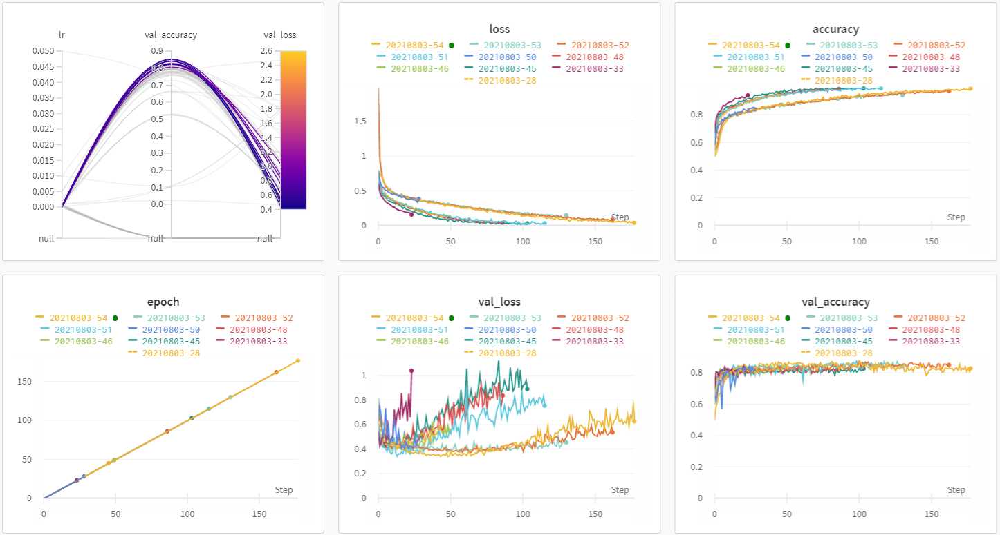

*Se seleccionó el checkpoint del epoch n°87 del entrenamiento n°54, en base a los resultados computados para el conjunto de validación*

*La configuración para este caso fue la siguiente:*



*   *Ajuste fino de VGG19 (pesos de ImageNet)*
*   *Capas adicionales: flatten, capa densa de 512 neuronas y activación ReLu, dropout de 0.5 y capa densa con activación sigmoidea para la predicción*
*   *Tamaño del lote = 32*
*   *Aumento de datos en entrenamiento (rotación y flips horizontales y verticales)*
*   *Imagen 224x224, en BGR y normalizada empleando los valores promedio de la media y desviación estándar de cada canal para todo el dataset*
*   *Epochs = 300*
*   *Paciencia early stopping = 100*
*   *Optimizador: Adam (B0=0.9, B1=0.999, e=1.0)*
*   *Learning rate = 0.0005*
*   *Función costo ponderada con la inversa de la frecuencia por clase: binary_crossentropy*
*   *Regularizador l1,l2 = 0.0005*




In [431]:
cnn = models.load_model(os.path.join(exp_dir,'VGG19-82-0.87.hdf5')) #VGG19-49-0.34
cnn.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

*Resultados en entrenamiento*

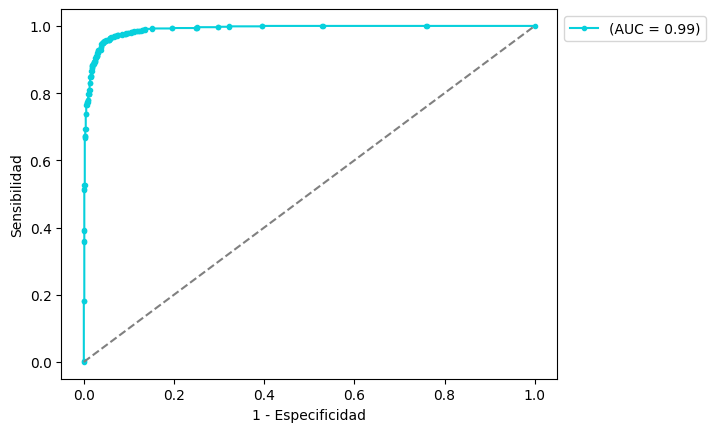

In [ ]:
y_pred = []

for i,v in enumerate(x_train):
  img = BGR_norm(v, dim, norm_dict, augment=False)
  img = np.expand_dims(img, axis=0)
  pred = cnn.predict(img)  
  y_pred.append(pred)

y_pred = np.asarray([x[0] for x in y_pred])

plot_ROC(y_train, y_pred)

*Resultados en validación*

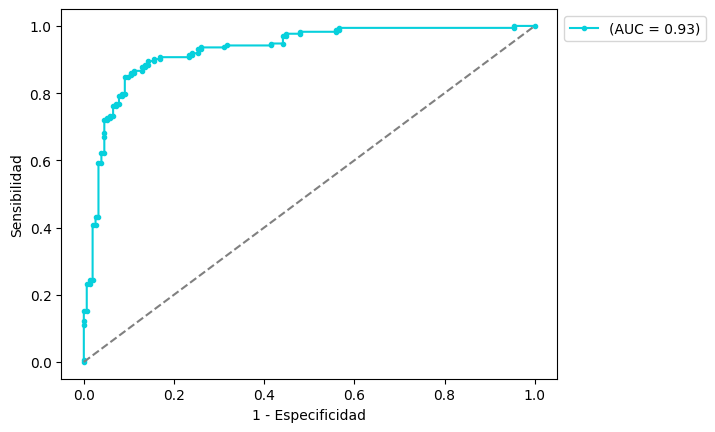

In [ ]:
y_pred = []

for i,v in enumerate(x_val):
  img = BGR_norm(v, dim, norm_dict, augment=False)
  img = np.expand_dims(img, axis=0)
  pred = cnn.predict(img)  
  y_pred.append(pred)

y_pred = np.asarray([x[0] for x in y_pred])

plot_ROC(y_val, y_pred)

*Resultados en testeo*

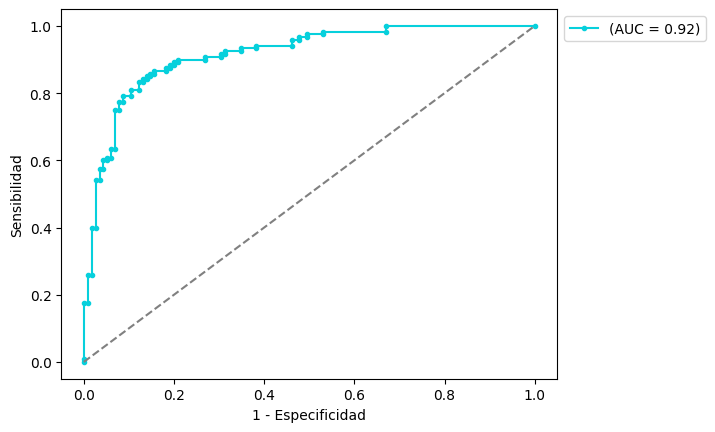

In [ ]:
y_pred = []

for i,v in enumerate(x_test):
  img = BGR_norm(v, dim, norm_dict, augment=False)
  img = np.expand_dims(img, axis=0)
  pred = cnn.predict(img)  
  y_pred.append(pred)

y_pred = np.asarray([x[0] for x in y_pred])

plot_ROC(y_test, y_pred)

##2) ML para metadata

*ML: machine learning*

###a) Características de pacientes

In [432]:
predictores_paciente

['smoke',
 'drink',
 'background_father',
 'background_mother',
 'age_group',
 'pesticide',
 'gender',
 'skin_cancer_history',
 'cancer_history',
 'has_piped_water',
 'has_sewage_system',
 'fitspatrick']

In [433]:
x_train = []
y_train = []

x_val = []
y_val = []

x_test = []
y_test = []

In [434]:
#Entrenamiento

x_train = []
y_train = []
for i,v in enumerate(train_index):
  try:
    sub = pat_data.loc[v]
    aux = []
    for j,w in enumerate(predictores_paciente):
      aux.append(sub[w])
    x_train.append(np.asarray(aux))
    y_train.append(sub['malignancy'])
  except:
    pass

x_train = np.asarray(x_train)
y_train = np.asarray(y_train)

#Validación

x_val = []
y_val = []
for i,v in enumerate(val_index):
  try:
    sub = pat_data.loc[v]
    aux = []
    for j,w in enumerate(predictores_paciente):
      aux.append(sub[w])
    x_val.append(np.asarray(aux))
    y_val.append(sub['malignancy'])
  except:
    pass

x_val = np.asarray(x_val)
y_val = np.asarray(y_val)

#Testeo

x_test = []
y_test = []
for i,v in enumerate(test_index):
  try:
    sub = pat_data.loc[v]
    aux = []
    for j,w in enumerate(predictores_paciente):
      aux.append(sub[w])
    x_test.append(np.asarray(aux))
    y_test.append(sub['malignancy'])
  except:
    pass

x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

In [435]:
x_train.shape, y_train.shape, x_val.shape, y_val.shape, x_test.shape, y_test.shape

((1049, 12), (1049,), (186, 12), (186,), (138, 12), (138,))

In [436]:
print('En entrenamiento hay %d BENIGNAS y %d MALIGNAS --> relación %.2f' %(y_train.tolist().count(0), y_train.tolist().count(1), y_train.tolist().count(0)/y_train.tolist().count(1)))
print('En validación hay %d BENIGNAS y %d MALIGNAS --> relación %.2f' %(y_val.tolist().count(0), y_val.tolist().count(1), y_val.tolist().count(0)/y_val.tolist().count(1)))
print('En testeo hay %d BENIGNAS y %d MALIGNAS --> relación %.2f' %(y_test.tolist().count(0), y_test.tolist().count(1), y_test.tolist().count(0)/y_test.tolist().count(1)))

En entrenamiento hay 601 BENIGNAS y 448 MALIGNAS --> relación 1.34
En validación hay 103 BENIGNAS y 83 MALIGNAS --> relación 1.24
En testeo hay 74 BENIGNAS y 64 MALIGNAS --> relación 1.16


####Perceptrón Multicapa

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Resultados en  Entrenamiento 



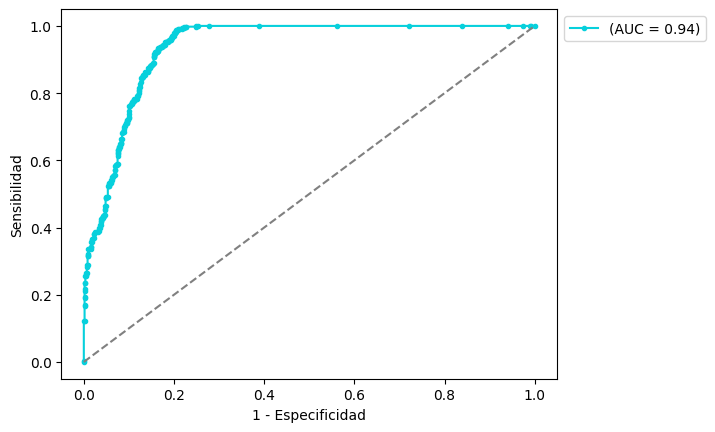

Resultados en  Validación 



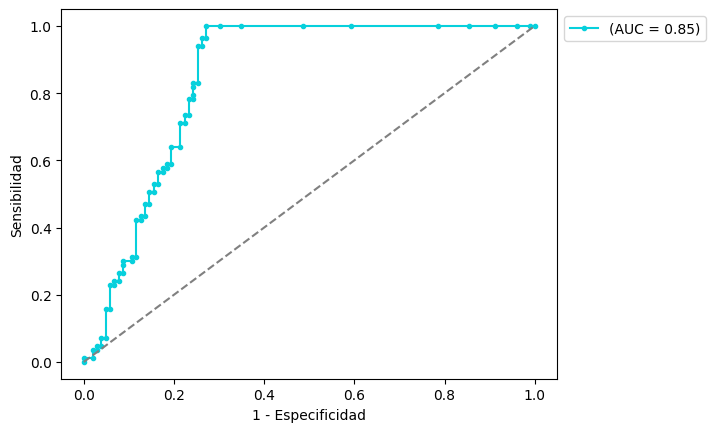

Resultados en  Testeo 



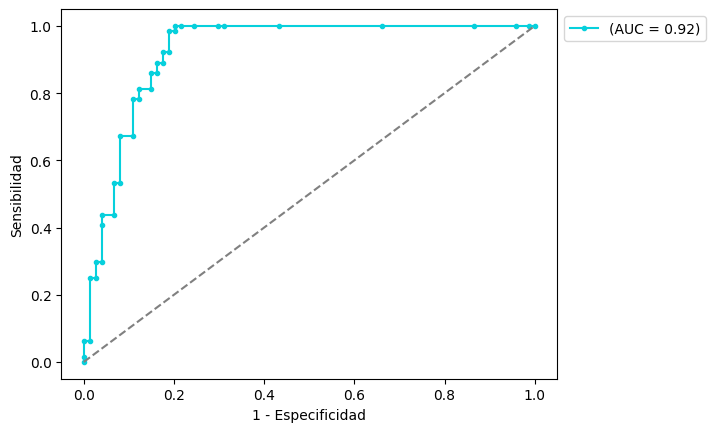

In [437]:
mlp = MLPClassifier()
mlp.fit(x_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [x_train, x_val, x_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = mlp.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

####Random Forest

Resultados en  Entrenamiento 



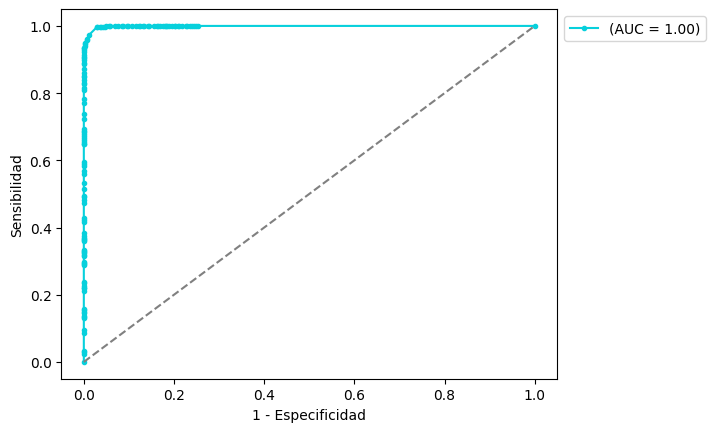

Resultados en  Validación 



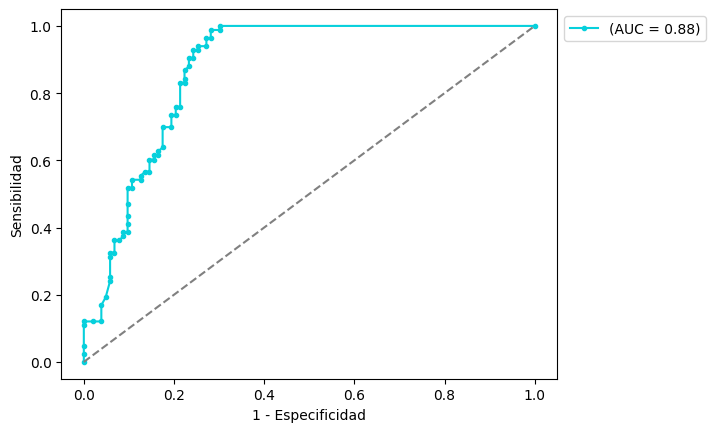

Resultados en  Testeo 



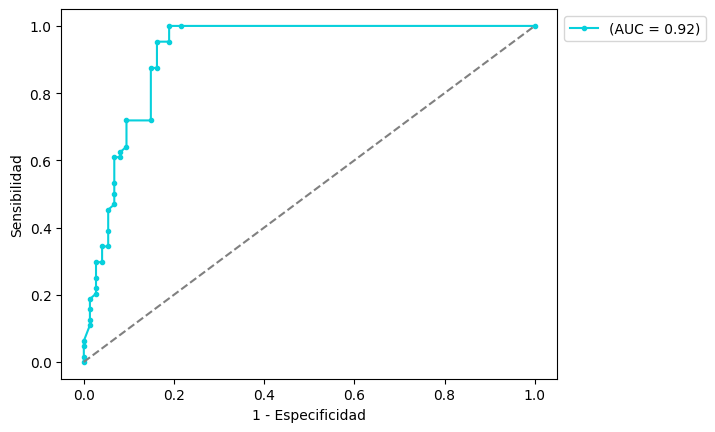

In [438]:
rf = RandomForestClassifier()
rf.fit(x_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [x_train, x_val, x_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = rf.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

####AdaBoost

Resultados en  Entrenamiento 



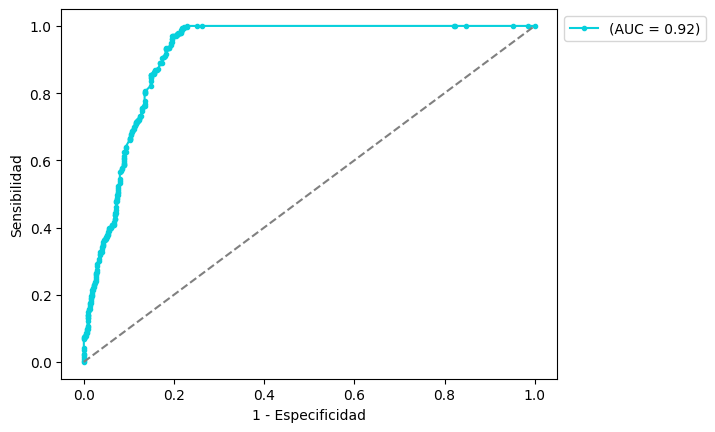

Resultados en  Validación 



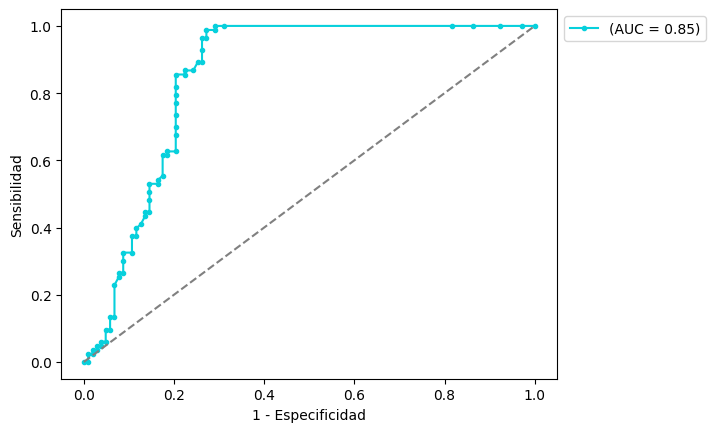

Resultados en  Testeo 



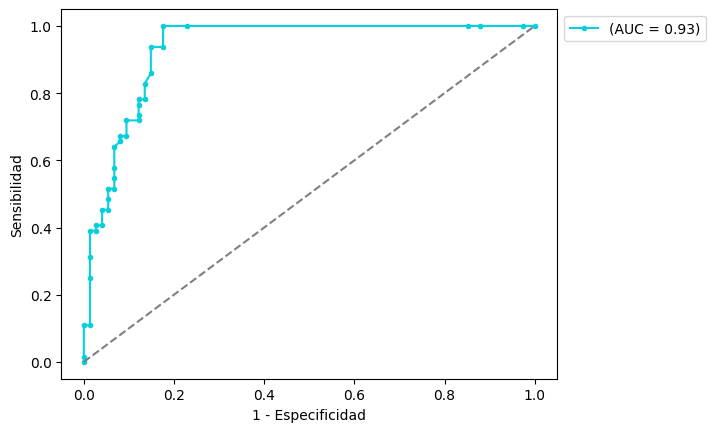

In [439]:
ab = AdaBoostClassifier()
ab.fit(x_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [x_train, x_val, x_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = ab.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

####SVM

Resultados en  Entrenamiento 



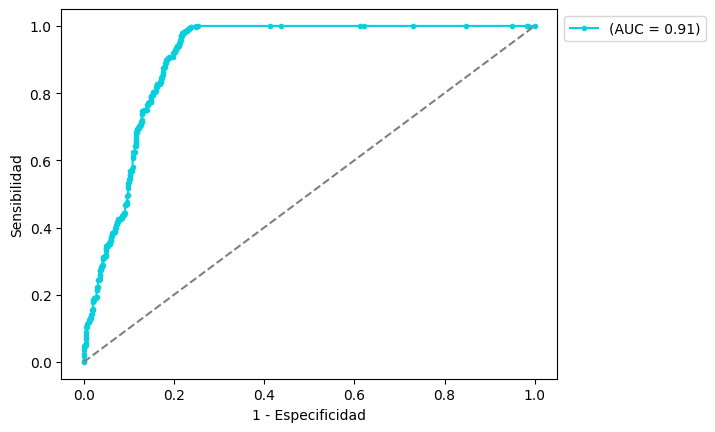

Resultados en  Validación 



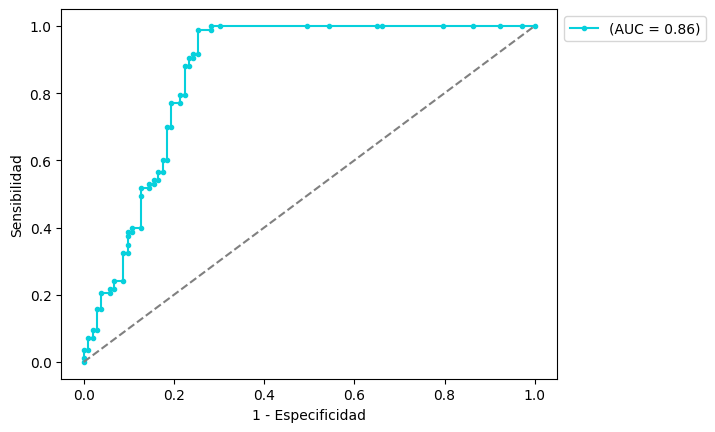

Resultados en  Testeo 



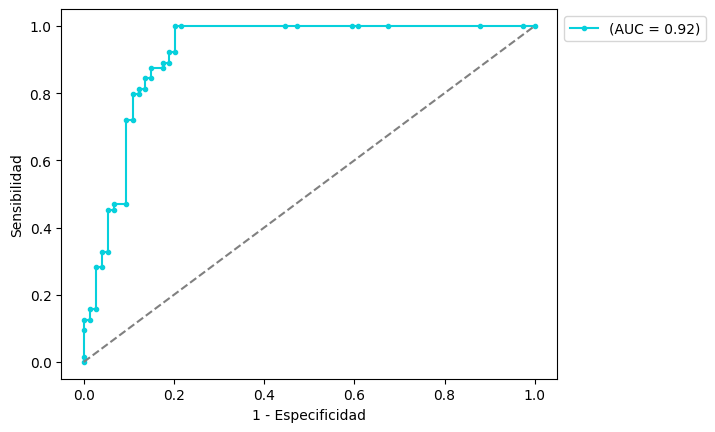

In [440]:
svm = SVC(probability=True)
svm.fit(x_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [x_train, x_val, x_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = svm.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

###b) Características de lesiones

In [441]:
predictores_lesion

['region', 'itch', 'grew', 'hurt', 'changed', 'bleed', 'elevation']

In [442]:
x_train = []
y_train = []

x_val = []
y_val = []

x_test = []
y_test = []

In [443]:
#Entrenamiento

x_train = []
y_train = []
for i,v in enumerate(train_index):
  try:
    sub = les_data_reducida.loc[v]
    aux = []
    for j,w in enumerate(predictores_lesion):
      aux.append(sub[w])
    x_train.append(np.asarray(aux))
    y_train.append(sub['malignancy'])
  except:
    pass

x_train = np.asarray(x_train)
y_train = np.asarray(y_train)

#Validación

x_val = []
y_val = []
for i,v in enumerate(val_index):
  try:
    sub = les_data_reducida.loc[v]
    aux = []
    for j,w in enumerate(predictores_lesion):
      aux.append(sub[w])
    x_val.append(np.asarray(aux))
    y_val.append(sub['malignancy'])
  except:
    pass

x_val = np.asarray(x_val)
y_val = np.asarray(y_val)

#Testeo

x_test = []
y_test = []
for i,v in enumerate(test_index):
  try:
    sub = les_data_reducida.loc[v]
    aux = []
    for j,w in enumerate(predictores_lesion):
      aux.append(sub[w])
    x_test.append(np.asarray(aux))
    y_test.append(sub['malignancy'])
  except:
    pass

x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

In [444]:
x_train.shape, y_train.shape, x_val.shape, y_val.shape, x_test.shape, y_test.shape

((1432, 7), (1432,), (261, 7), (261,), (197, 7), (197,))

In [445]:
print('En entrenamiento hay %d BENIGNAS y %d MALIGNAS --> relación %.2f' %(y_train.tolist().count(0), y_train.tolist().count(1), y_train.tolist().count(0)/y_train.tolist().count(1)))
print('En validación hay %d BENIGNAS y %d MALIGNAS --> relación %.2f' %(y_val.tolist().count(0), y_val.tolist().count(1), y_val.tolist().count(0)/y_val.tolist().count(1)))
print('En testeo hay %d BENIGNAS y %d MALIGNAS --> relación %.2f' %(y_test.tolist().count(0), y_test.tolist().count(1), y_test.tolist().count(0)/y_test.tolist().count(1)))

En entrenamiento hay 814 BENIGNAS y 618 MALIGNAS --> relación 1.32
En validación hay 135 BENIGNAS y 126 MALIGNAS --> relación 1.07
En testeo hay 108 BENIGNAS y 89 MALIGNAS --> relación 1.21


####Perceptrón Multicapa

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Resultados en  Entrenamiento 



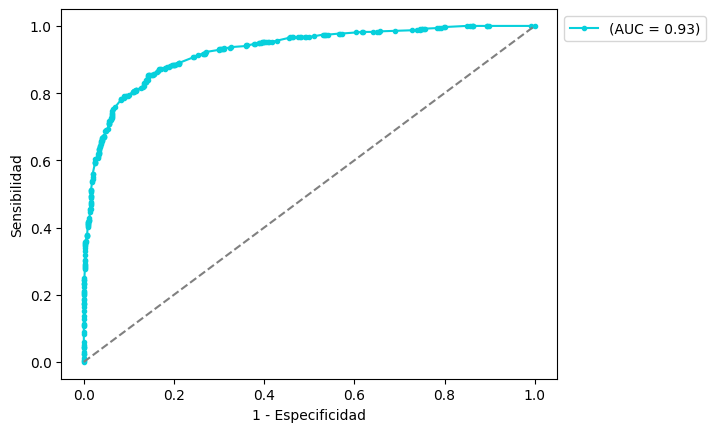

Resultados en  Validación 



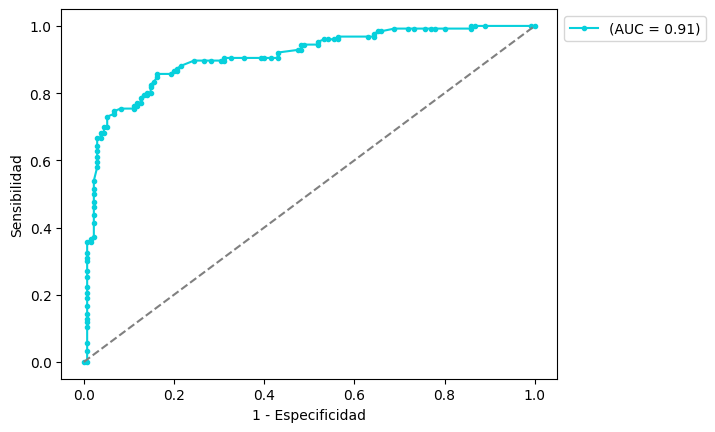

Resultados en  Testeo 



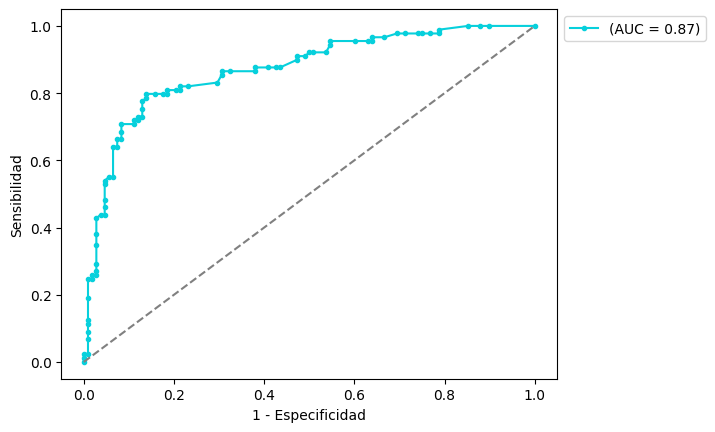

In [446]:
mlp = MLPClassifier()
mlp.fit(x_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [x_train, x_val, x_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = mlp.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

####Random Forest

Resultados en  Entrenamiento 



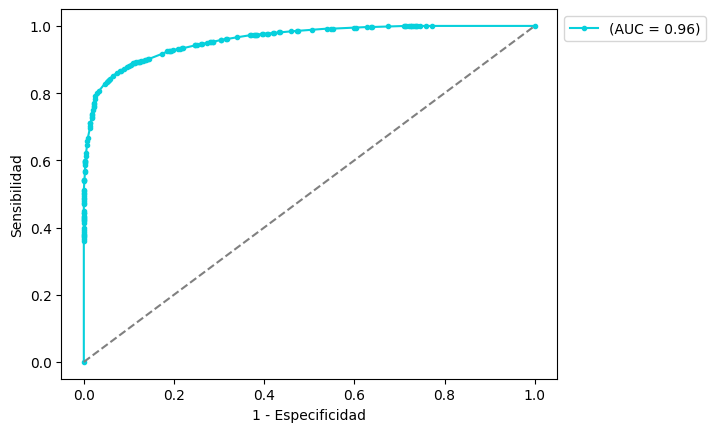

Resultados en  Validación 



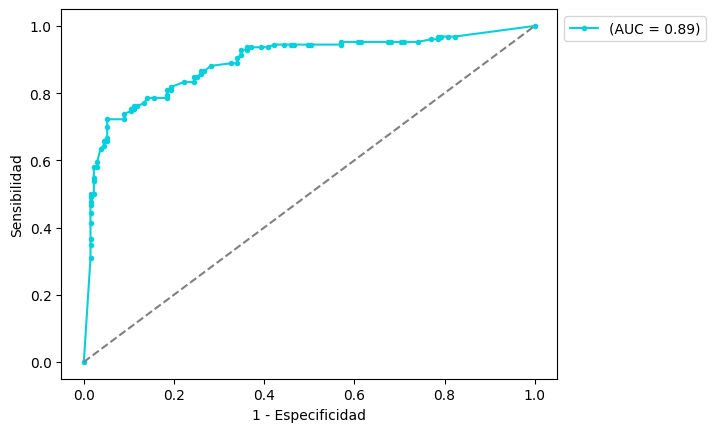

Resultados en  Testeo 



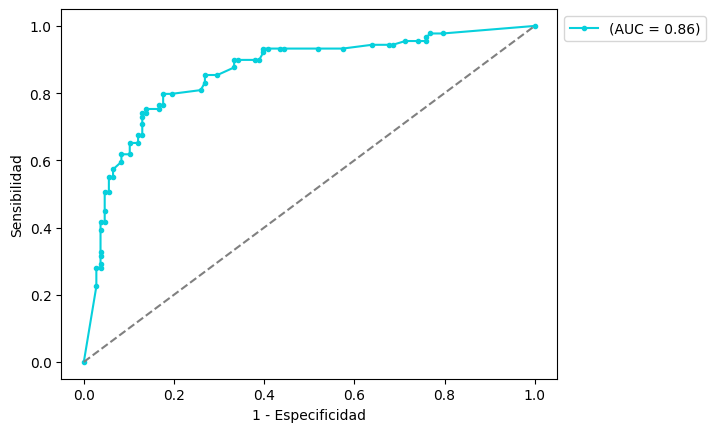

In [447]:
rf = RandomForestClassifier()
rf.fit(x_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [x_train, x_val, x_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = rf.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

####AdaBoost

Resultados en  Entrenamiento 



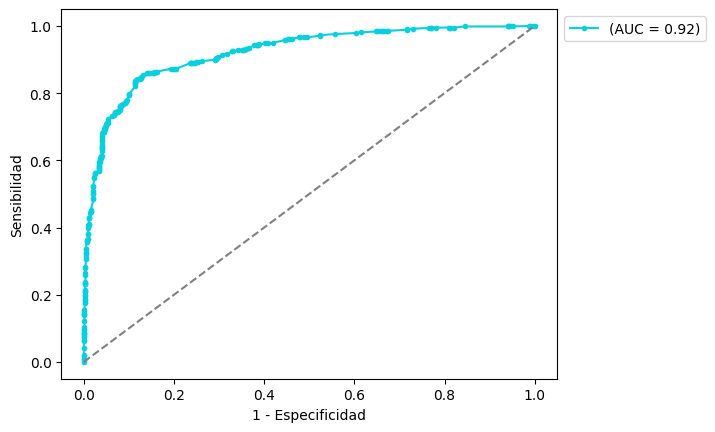

Resultados en  Validación 



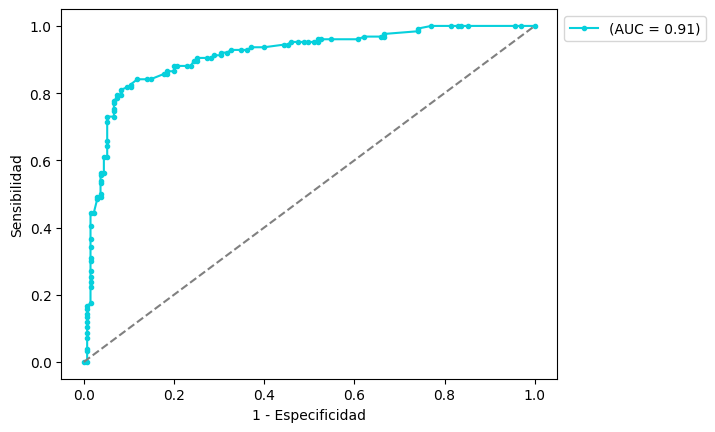

Resultados en  Testeo 



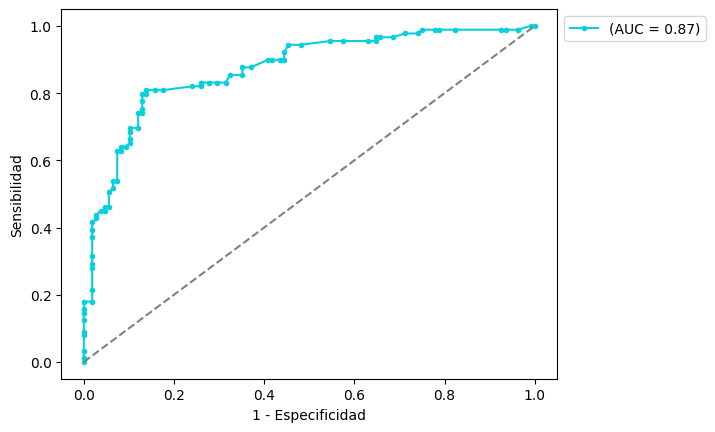

In [448]:
ab = AdaBoostClassifier()
ab.fit(x_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [x_train, x_val, x_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = ab.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

####SVM

Resultados en  Entrenamiento 



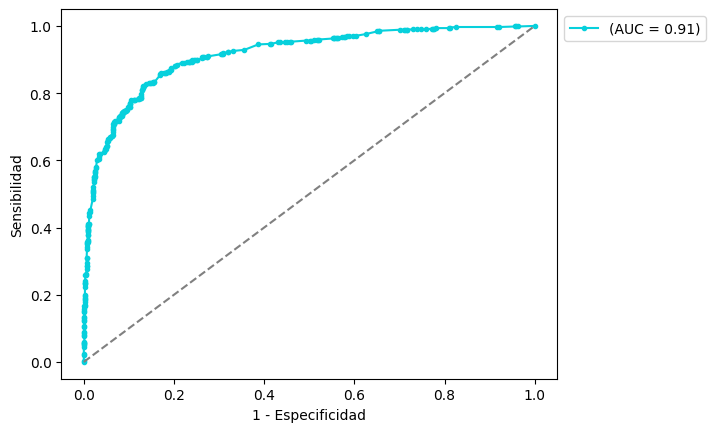

Resultados en  Validación 



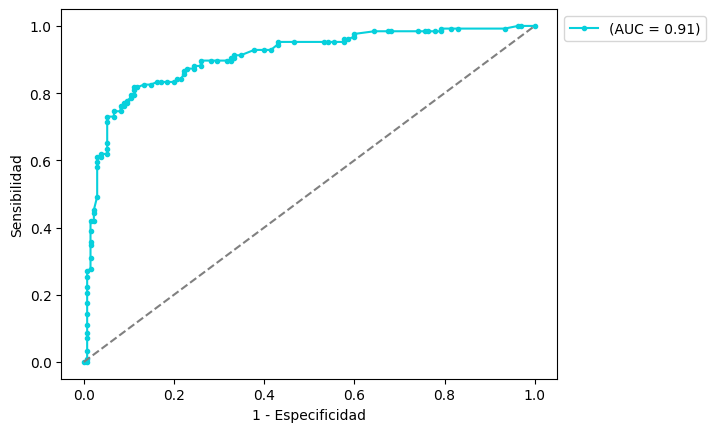

Resultados en  Testeo 



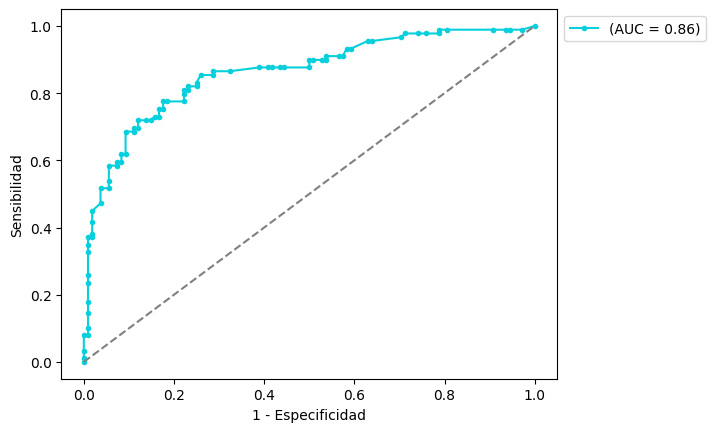

In [449]:
svm = SVC(probability=True)
svm.fit(x_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [x_train, x_val, x_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = svm.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

##3) Combinación CNN + ML

*Los siguientes experimentos requirieron el uso y la combinación de vectores de características extraidos de las imágenes, así como vectores resultantes de la combinación de los predictores tabulados en el dataset.*

#####Extracción de características

*Se importa el modelo y remueven las capas superiores para poder extraer las 512 características resultantes de la capa densa incorporada.*

In [450]:
i = cnn.input
o = cnn.layers[-3].output #512 features

cnn2 = Model(i, [o])
cnn2.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [451]:
x = np.asarray(data.img_id)
y = np.asarray(data.malignancy.replace('Maligno',1).replace('Benigno',0))

rnd_state = 4
test_split = 0.10
val_split = 0.15

groups = data['patient_id']
gss = GroupShuffleSplit(n_splits=1, train_size=1-test_split, random_state=rnd_state)

for tr_index, test_index in gss.split(x, y, groups):
    x_tr, x_test = x[tr_index], x[test_index]
    y_tr, y_test = y[tr_index], y[test_index]

groups2 = data['patient_id'][tr_index]
gss2 = GroupShuffleSplit(n_splits=1, train_size=1-val_split, random_state=rnd_state)

old_idx = groups2.index.tolist()

for train_index_dummy, val_index_dummy in gss2.split(x_tr, y_tr, groups2):
    train_index = np.asarray(old_idx)[train_index_dummy]
    val_index = np.asarray(old_idx)[val_index_dummy]

x_train, x_val = x[train_index], x[val_index]
y_train, y_val = y[train_index], y[val_index]

In [452]:
xf_train = [] #Features extraidas para los datos de entrenamiento
xf_val = [] #Features extraidas para los datos de validación
xf_test = [] #Features extraidas para los datos de testeo

In [453]:
for i,v in enumerate(x_train):
  img = BGR_norm(v, dim, norm_dict, augment=False)
  img = np.expand_dims(img, axis=0)
  pred = cnn2.predict(img)  
  xf_train.append(pred)
  if (i%100==0):
    print(i)

xf_train = np.asarray([x[0] for x in xf_train])
xf_train.shape

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700


(1734, 512)

In [454]:
for i,v in enumerate(x_val):
  img = BGR_norm(v, dim, norm_dict, augment=False)
  img = np.expand_dims(img, axis=0)
  pred = cnn2.predict(img)  
  xf_val.append(pred)

xf_val = np.asarray([x[0] for x in xf_val])
xf_val.shape

(326, 512)

In [455]:
for i,v in enumerate(x_test):
  img = BGR_norm(v, dim, norm_dict, augment=False)
  img = np.expand_dims(img, axis=0)
  pred = cnn2.predict(img)  
  xf_test.append(pred)

xf_test = np.asarray([x[0] for x in xf_test])
xf_test.shape

(235, 512)

#####Visualización de características de entrenamiento

perplexity=5 in 53 sec


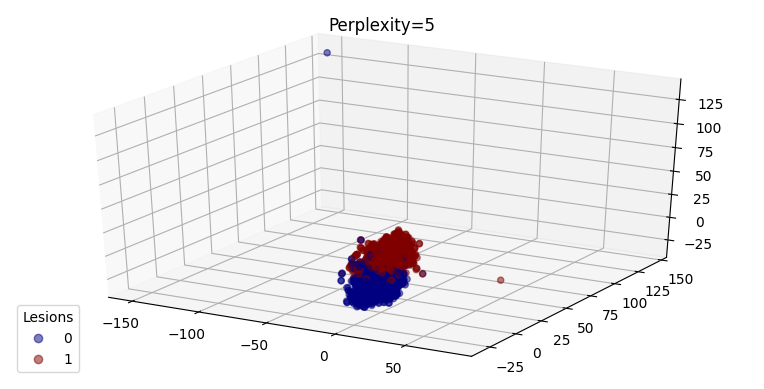

perplexity=10 in 59 sec


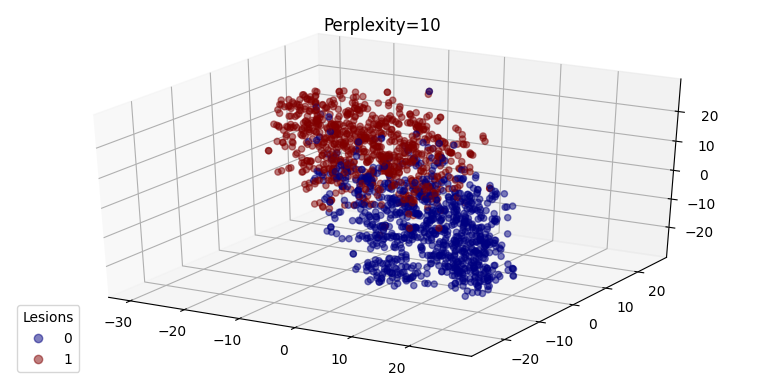

perplexity=15 in 69 sec


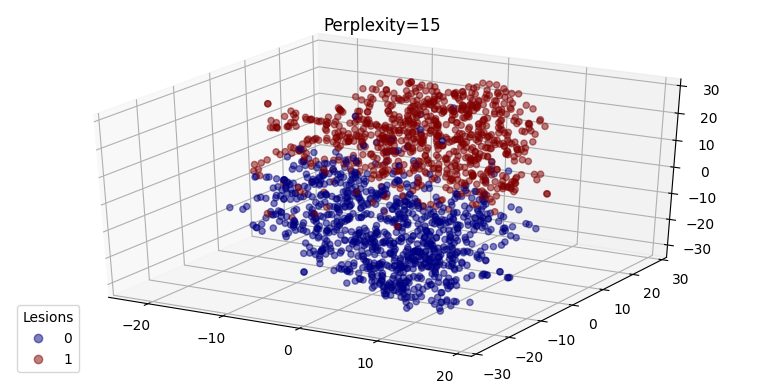

perplexity=25 in 87 sec


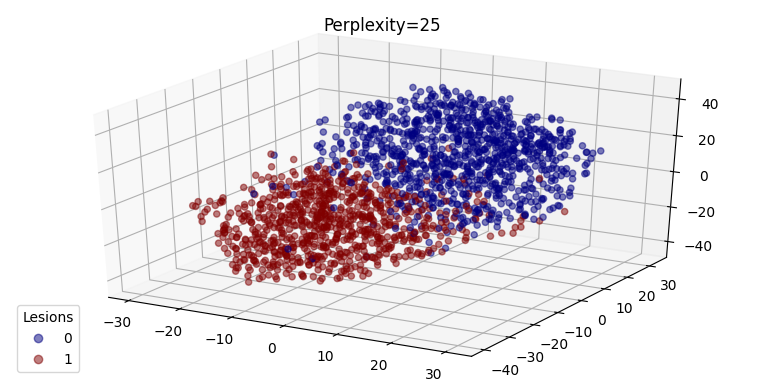

perplexity=35 in 96 sec


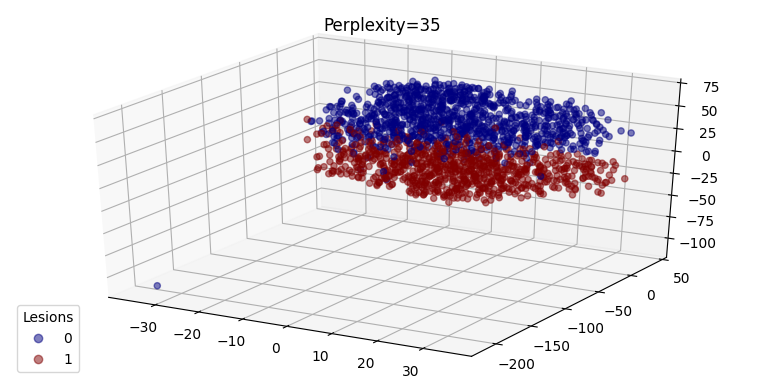

perplexity=45 in 71 sec


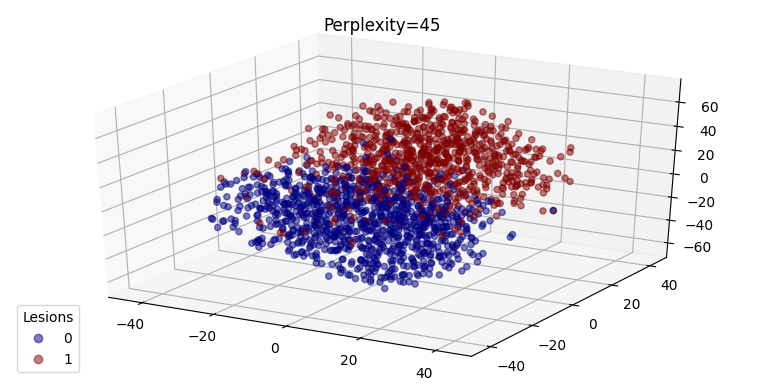

perplexity=50 in 1.4e+02 sec


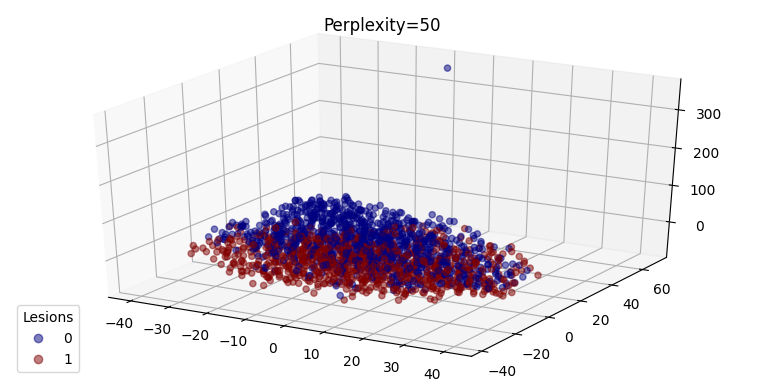

In [456]:
perplexities = [5, 10, 15, 25, 35, 45, 50]

pca = PCA(n_components=50)
X_pca = pca.fit_transform(xf_train)

cmap_classes = plt.cm.get_cmap('jet', len(np.unique(y_train)))

for i, perplexity in enumerate(perplexities):
    fig = plt.figure(figsize=plt.figaspect(0.5))  
    ax = fig.add_subplot(111, projection='3d')
   
    t0 = time()
    tsne = TSNE(n_components=3, init='random',random_state=0, perplexity=perplexity)
    tsne_features = tsne.fit_transform(X_pca)
    t1 = time()
    print("perplexity=%d in %.2g sec" % (perplexity, t1 - t0))
    ax.set_title("Perplexity=%d" % perplexity)
    scatter = ax.scatter3D(tsne_features[:,0], tsne_features[:,1], tsne_features[:,2],cmap=cmap_classes, c= y_train,alpha=0.5)
    ax.legend(*scatter.legend_elements(),loc="lower left", title="Lesions")

    plt.show()

*Con distinos valores de perplejidad se observa una clara diferenciación entre las imágenes correspondientes a lesiones benignas (en azul) y a lesiones malignas (en bordó) al valerse de las características extraídas por la red neuronal convolucional. La diferencia con la visualización generada al utilizar todos los píxeles crudos de las imágenes es notable.*

####i) Sólo imágenes

#####Perceptrón Multicapa

Resultados en  Entrenamiento 



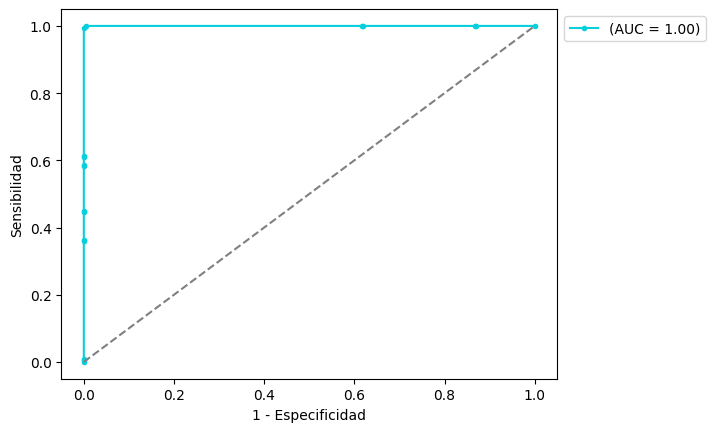

Resultados en  Validación 



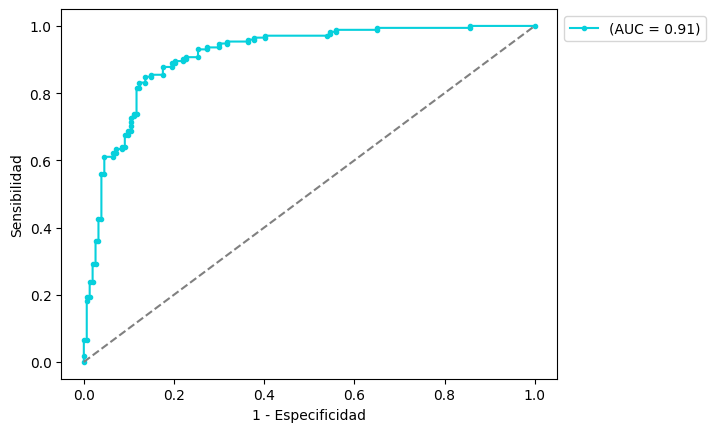

Resultados en  Testeo 



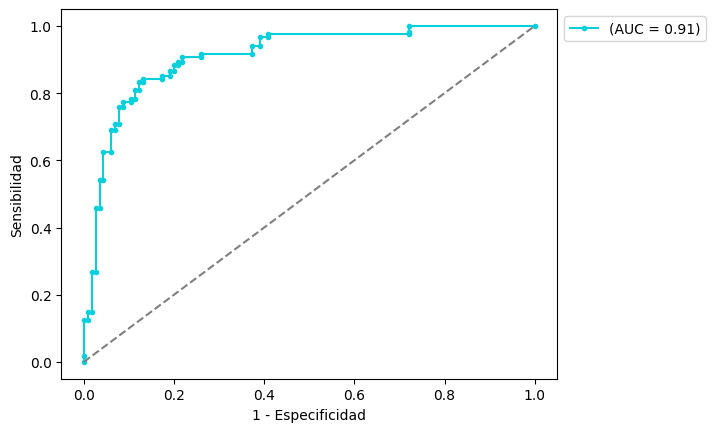

In [457]:
mlp = MLPClassifier()
mlp.fit(xf_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xf_train, xf_val, xf_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = mlp.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####Random Forest

Resultados en  Entrenamiento 



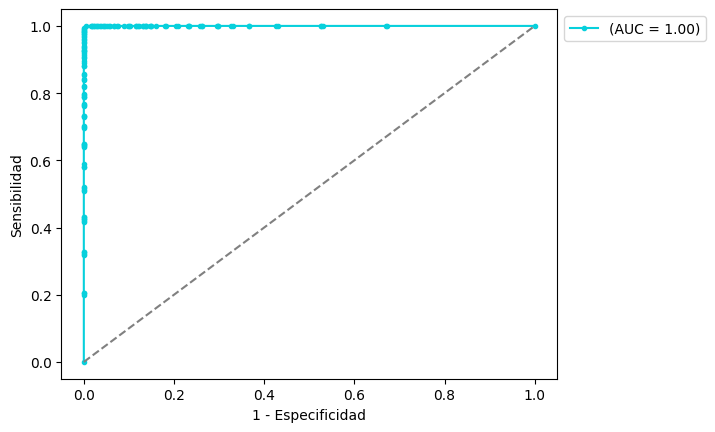

Resultados en  Validación 



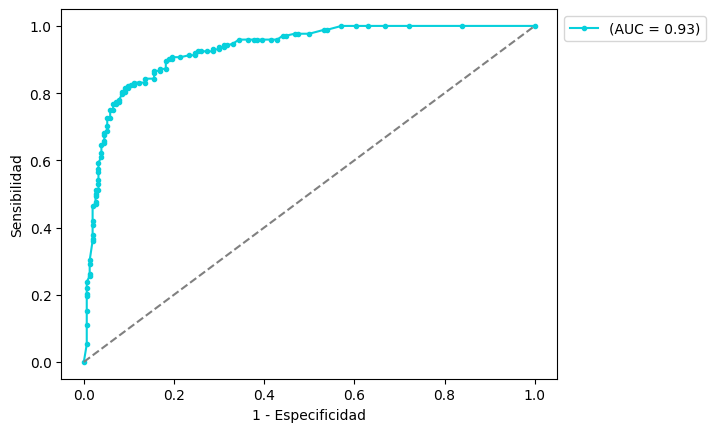

Resultados en  Testeo 



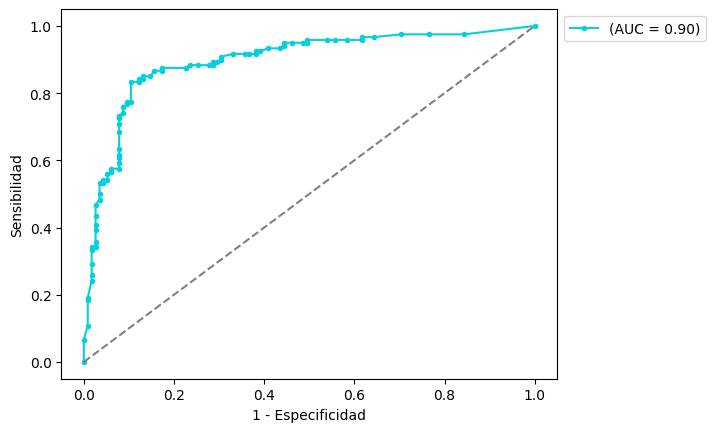

In [458]:
rf = RandomForestClassifier()
rf.fit(xf_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xf_train, xf_val, xf_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = rf.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####AdaBoost

Resultados en  Entrenamiento 



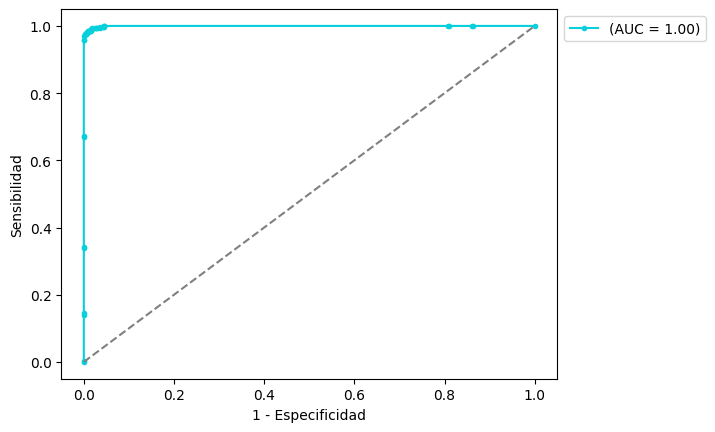

Resultados en  Validación 



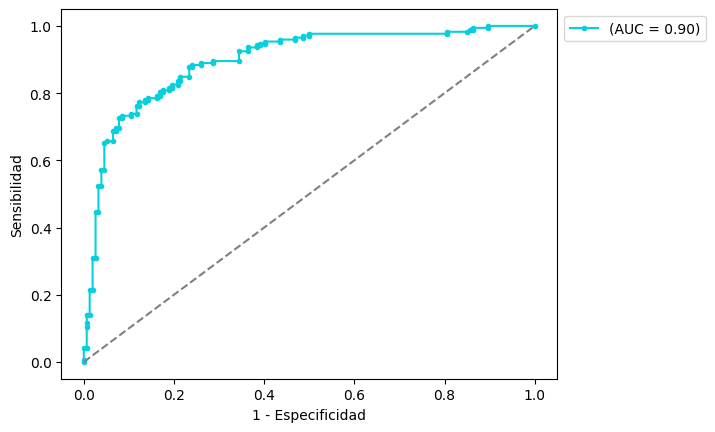

Resultados en  Testeo 



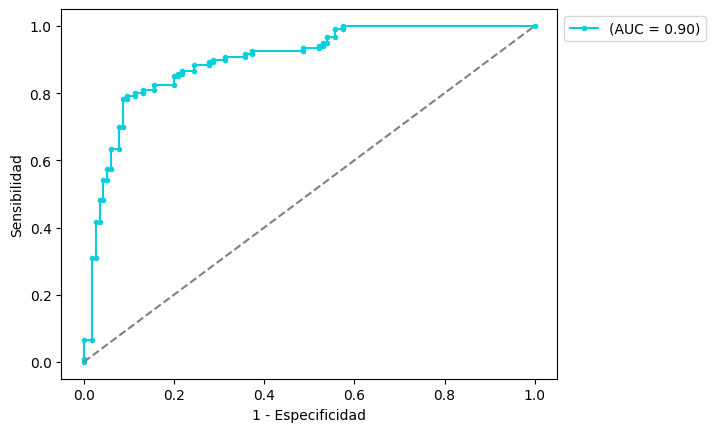

In [459]:
ab = AdaBoostClassifier()
ab.fit(xf_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xf_train, xf_val, xf_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = ab.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####SVM

Resultados en  Entrenamiento 



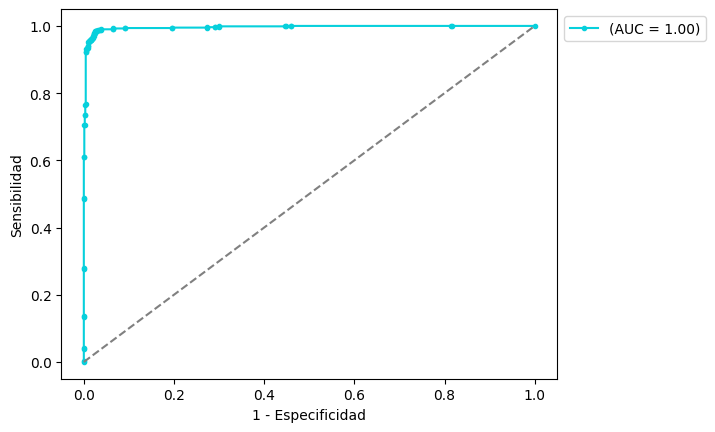

Resultados en  Validación 



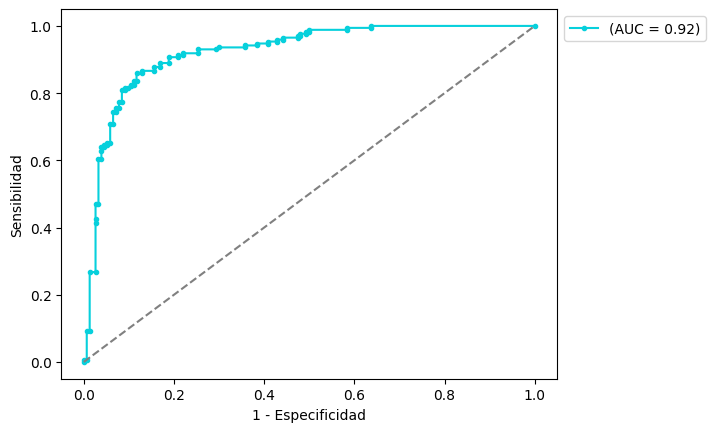

Resultados en  Testeo 



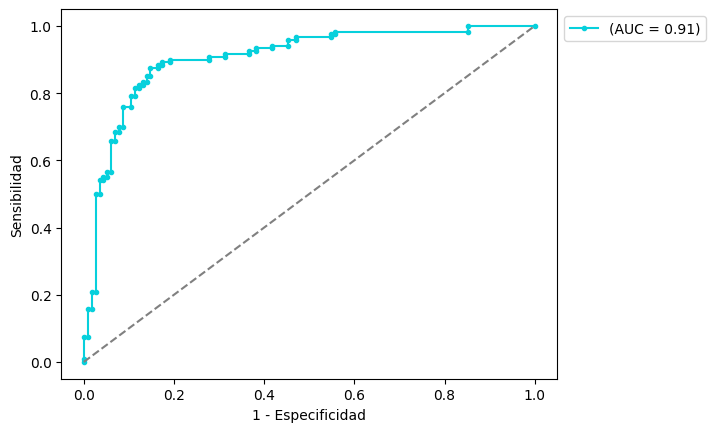

In [460]:
svm = SVC(probability=True)
svm.fit(xf_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xf_train, xf_val, xf_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = svm.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

####b) Imágenes y metadata paciente

In [461]:
predictores_paciente

['smoke',
 'drink',
 'background_father',
 'background_mother',
 'age_group',
 'pesticide',
 'gender',
 'skin_cancer_history',
 'cancer_history',
 'has_piped_water',
 'has_sewage_system',
 'fitspatrick']

In [462]:
xfm_train = []
for i,v in enumerate(train_index):
  aux = xf_train[i]
  for j,w in enumerate(predictores_paciente):
    aux = (np.append(aux, image_data[w][v]))
        
  xfm_train.append(aux)

xfm_train = np.asarray(xfm_train)
print(xfm_train.shape)

xfm_val = []
for i,v in enumerate(val_index):
  aux = xf_val[i]
  for j,w in enumerate(predictores_paciente):
    aux = (np.append(aux, image_data[w][v]))
  xfm_val.append(aux)

xfm_val = np.asarray(xfm_val)
print(xfm_val.shape)

xfm_test = []
for i,v in enumerate(test_index):
  aux = xf_test[i]
  for j,w in enumerate(predictores_paciente):
    aux = (np.append(aux, image_data[w][v]))
  xfm_test.append(aux)

xfm_test = np.asarray(xfm_test)
print(xfm_test.shape)

(1734, 524)
(326, 524)
(235, 524)


#####Perceptrón Multicapa

Resultados en  Entrenamiento 



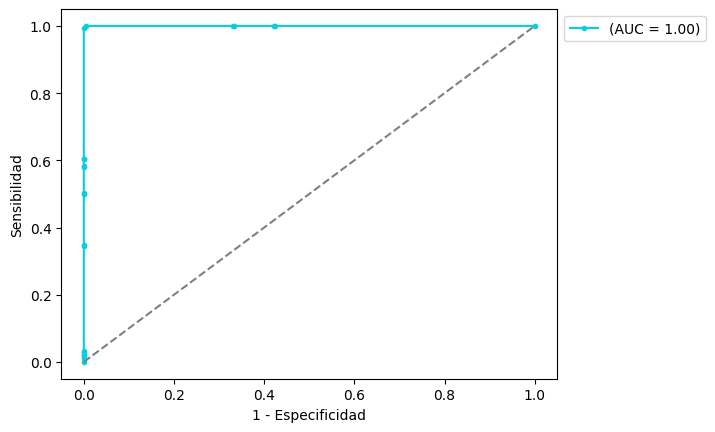

Resultados en  Validación 



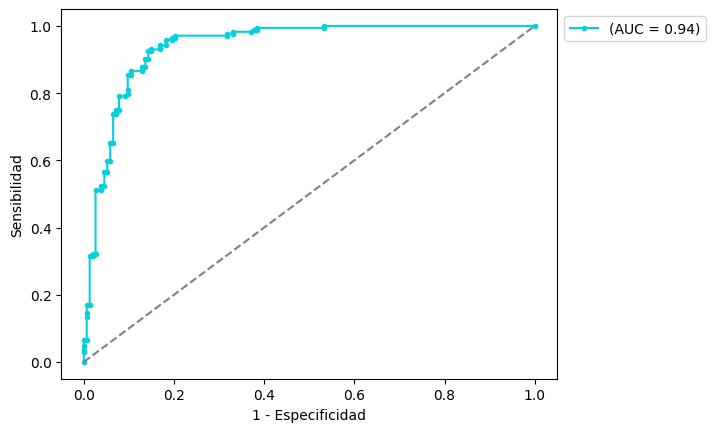

Resultados en  Testeo 



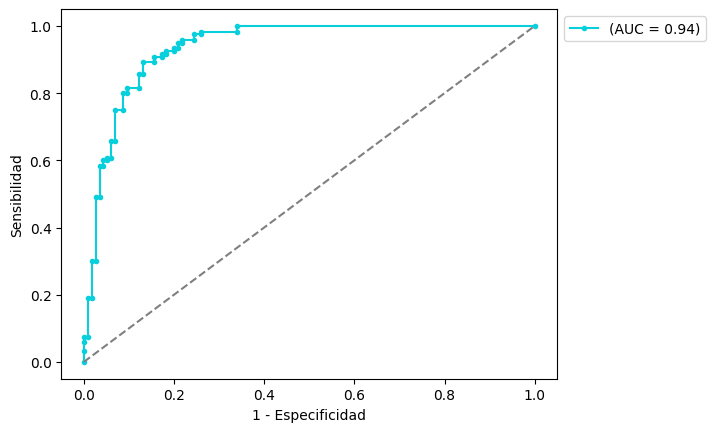

In [463]:
mlp = MLPClassifier()
mlp.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = mlp.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####Random Forest

Resultados en  Entrenamiento 



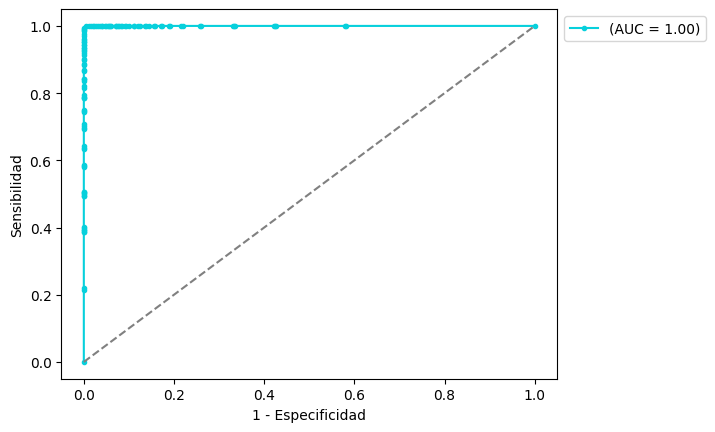

Resultados en  Validación 



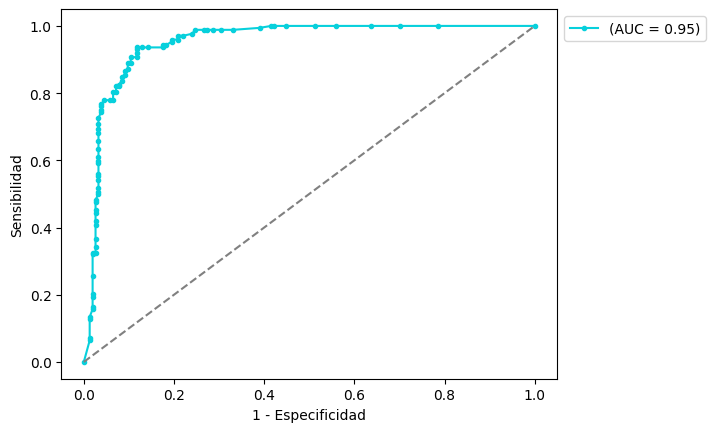

Resultados en  Testeo 



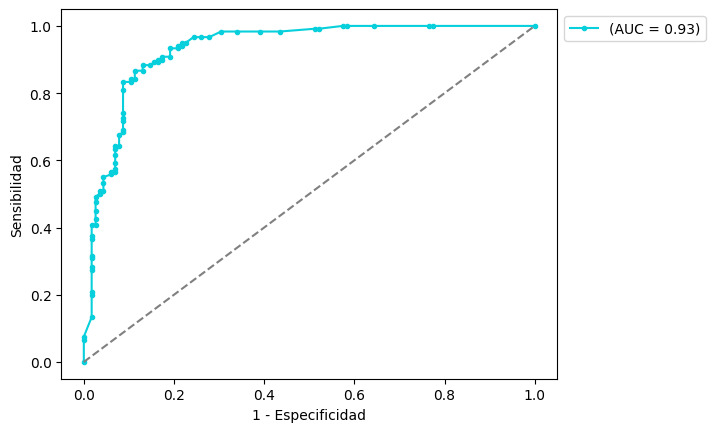

In [464]:
rf = RandomForestClassifier()
rf.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = rf.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####AdaBoost

Resultados en  Entrenamiento 



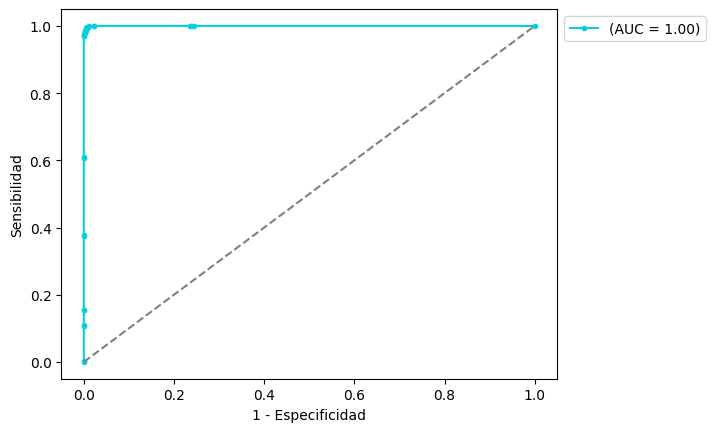

Resultados en  Validación 



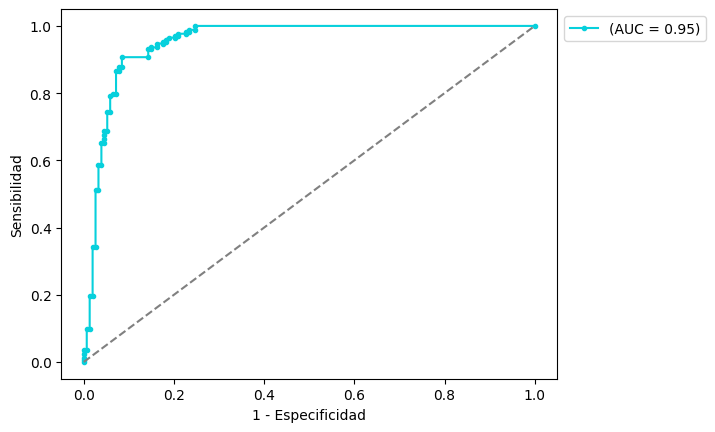

Resultados en  Testeo 



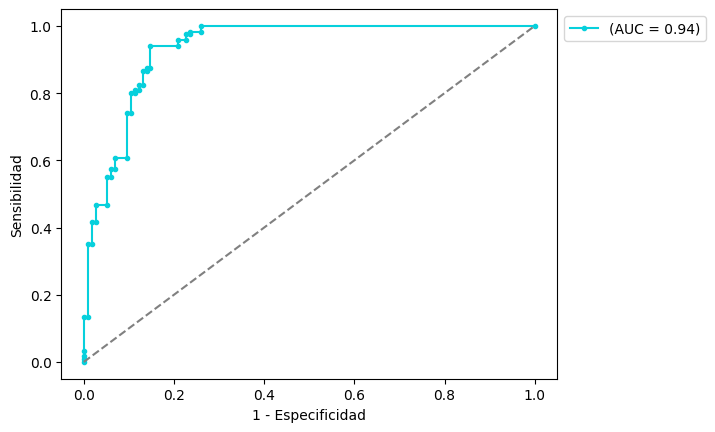

In [465]:
ab = AdaBoostClassifier()
ab.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = ab.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####SVM

Resultados en  Entrenamiento 



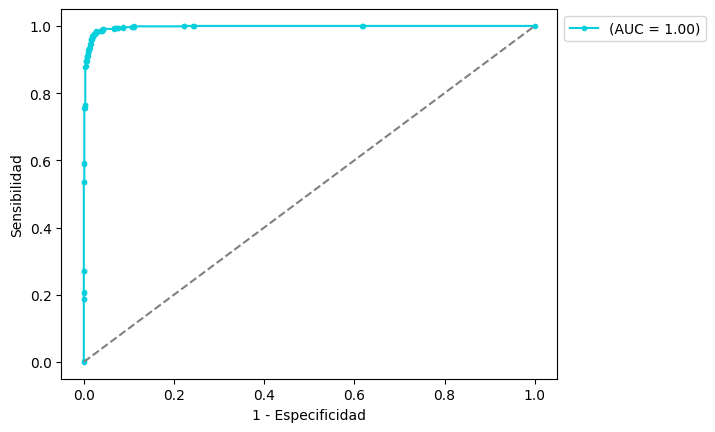

Resultados en  Validación 



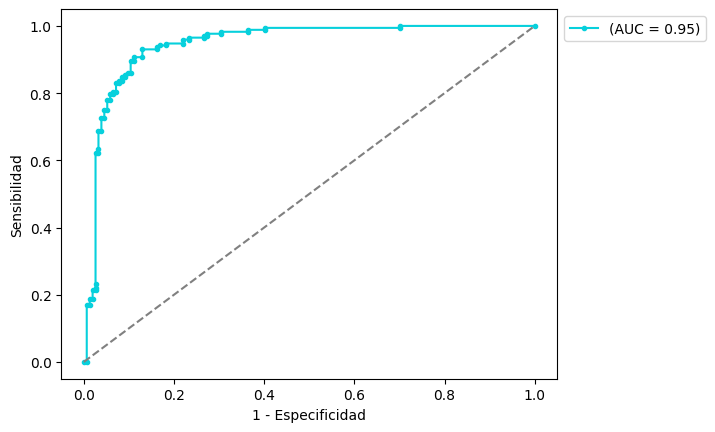

Resultados en  Testeo 



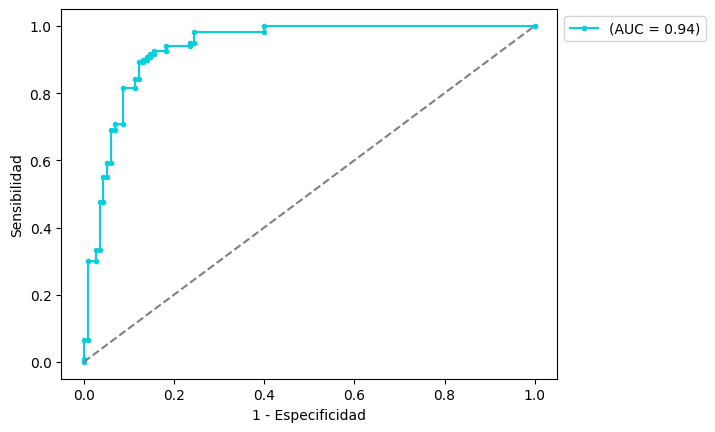

In [466]:
svm = SVC(probability=True)
svm.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = svm.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

####c) Imágenes y metadata lesiones

In [467]:
predictores_lesion

['region', 'itch', 'grew', 'hurt', 'changed', 'bleed', 'elevation']

In [468]:
xfm_train = []
for i,v in enumerate(train_index):
  aux = xf_train[i]
  for j,w in enumerate(predictores_lesion):
    aux = (np.append(aux, image_data[w][v]))
        
  xfm_train.append(aux)

xfm_train = np.asarray(xfm_train)
print(xfm_train.shape)

xfm_val = []
for i,v in enumerate(val_index):
  aux = xf_val[i]
  for j,w in enumerate(predictores_lesion):
    aux = (np.append(aux, image_data[w][v]))
  xfm_val.append(aux)

xfm_val = np.asarray(xfm_val)
print(xfm_val.shape)

xfm_test = []
for i,v in enumerate(test_index):
  aux = xf_test[i]
  for j,w in enumerate(predictores_lesion):
    aux = (np.append(aux, image_data[w][v]))
  xfm_test.append(aux)

xfm_test = np.asarray(xfm_test)
print(xfm_test.shape)

(1734, 519)
(326, 519)
(235, 519)


#####Perceptrón Multicapa

Resultados en  Entrenamiento 



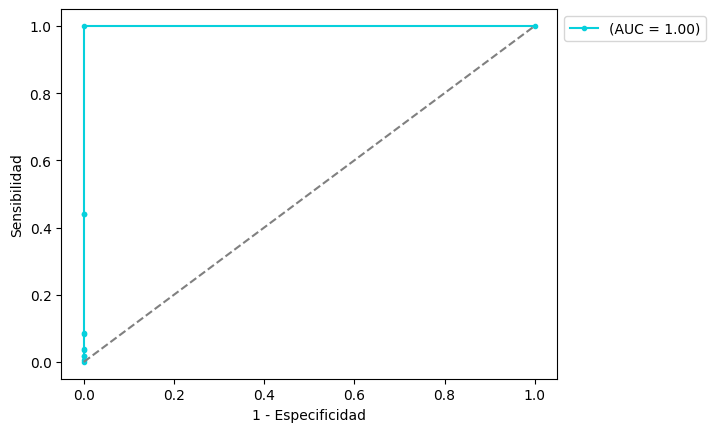

Resultados en  Validación 



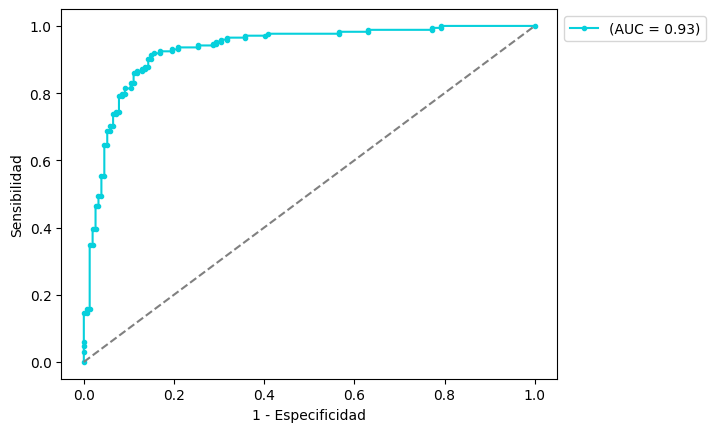

Resultados en  Testeo 



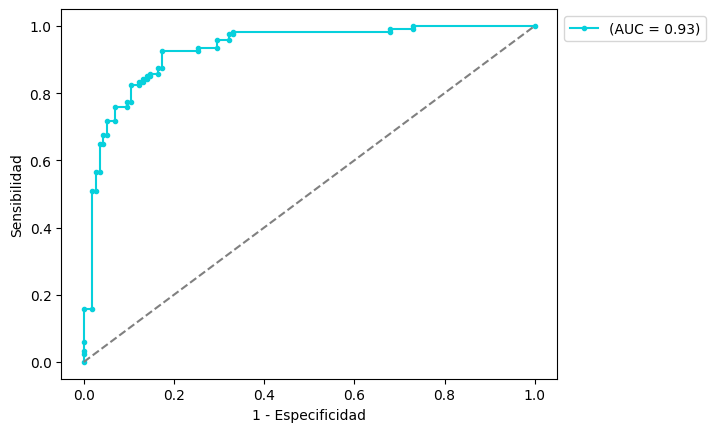

In [469]:
mlp = MLPClassifier()
mlp.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = mlp.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####Random Forest

Resultados en  Entrenamiento 



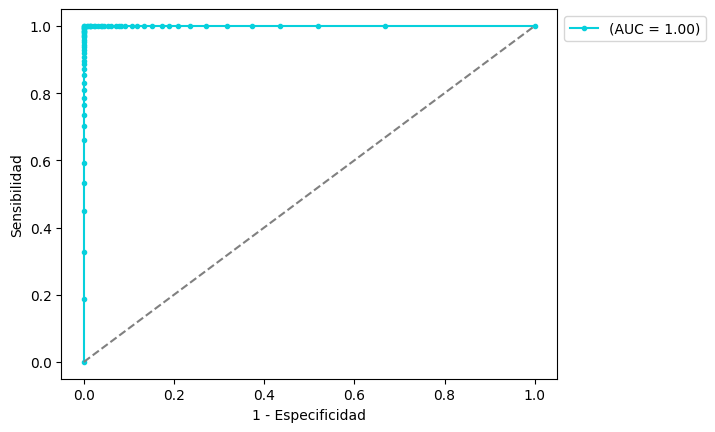

Resultados en  Validación 



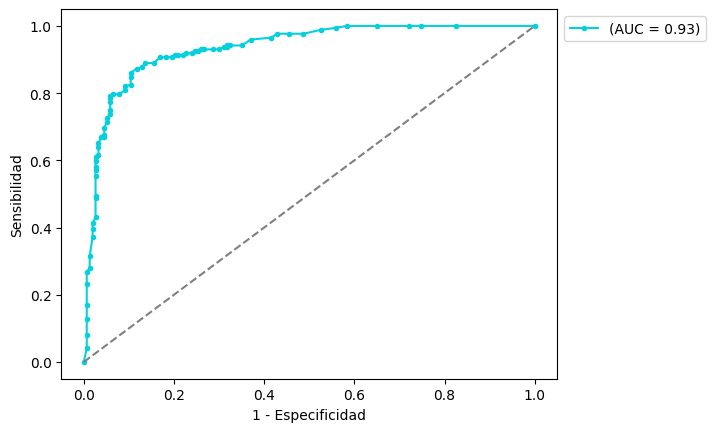

Resultados en  Testeo 



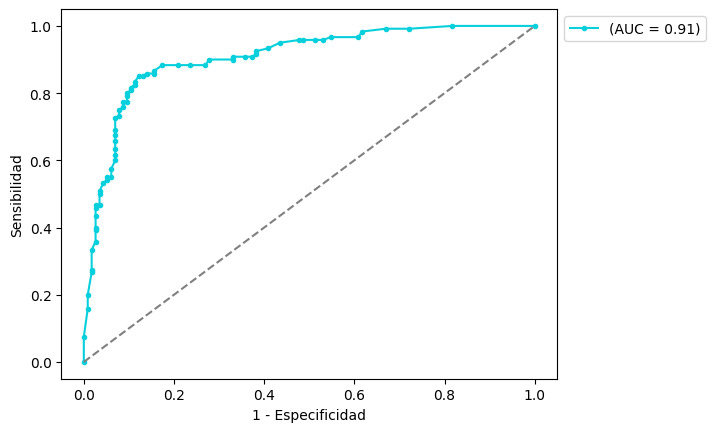

In [470]:
rf = RandomForestClassifier()
rf.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = rf.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####AdaBoost

Resultados en  Entrenamiento 



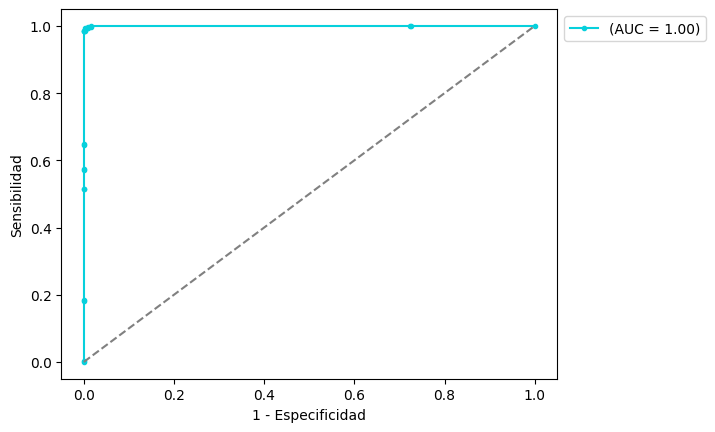

Resultados en  Validación 



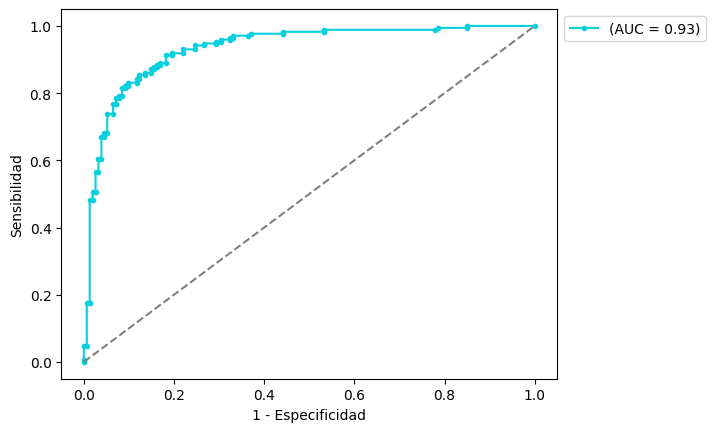

Resultados en  Testeo 



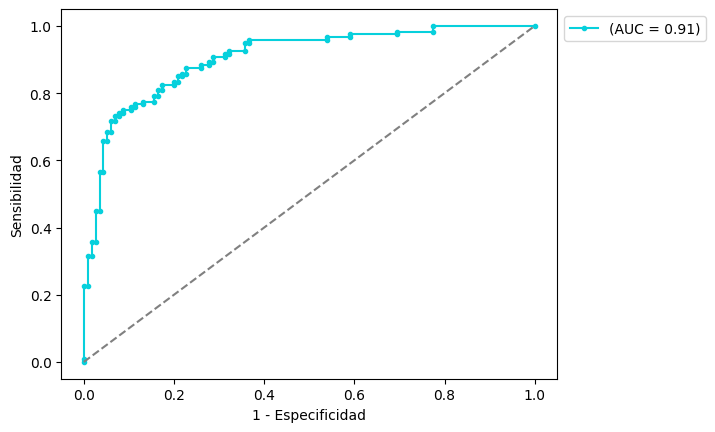

In [471]:
ab = AdaBoostClassifier()
ab.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = ab.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####SVM

Resultados en  Entrenamiento 



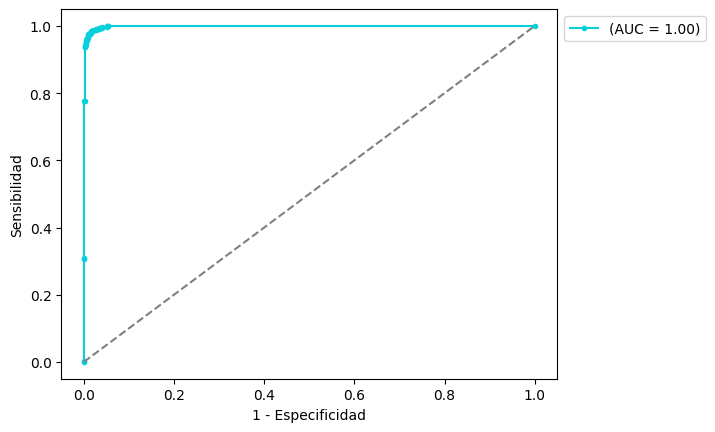

Resultados en  Validación 



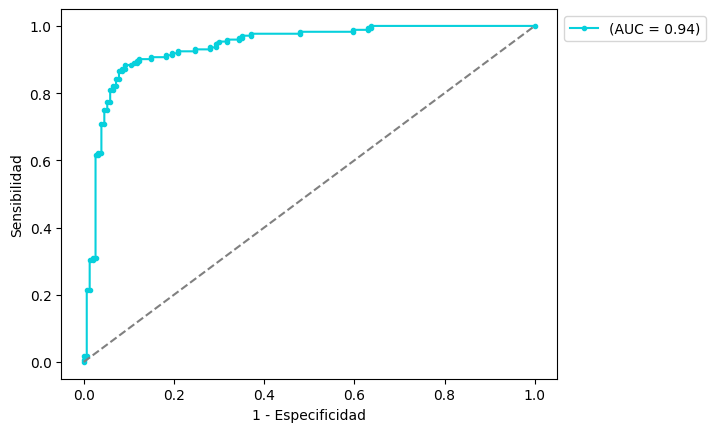

Resultados en  Testeo 



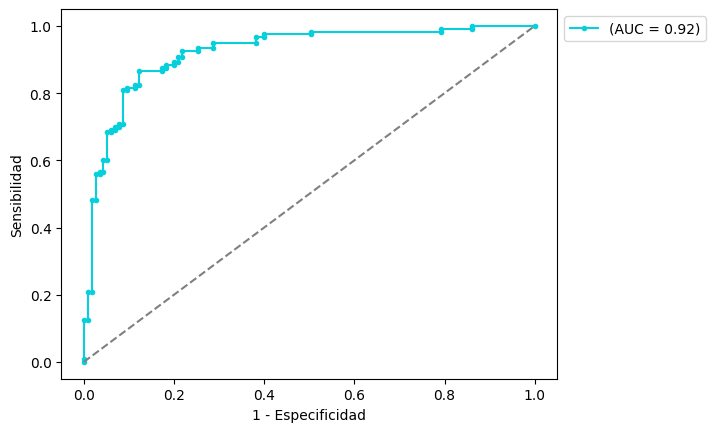

In [472]:
svm = SVC(probability=True)
svm.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = svm.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

####d) Imágenes y metadata (paciente y lesiones)

In [473]:
predictores

['smoke',
 'drink',
 'background_father',
 'background_mother',
 'pesticide',
 'gender',
 'age_group',
 'skin_cancer_history',
 'cancer_history',
 'has_piped_water',
 'has_sewage_system',
 'fitspatrick',
 'region',
 'itch',
 'grew',
 'hurt',
 'changed',
 'bleed',
 'elevation']

In [474]:
xfm_train = []
for i,v in enumerate(train_index):
  aux = xf_train[i]
  for j,w in enumerate(predictores):
    aux = (np.append(aux, image_data[w][v]))
        
  xfm_train.append(aux)

xfm_train = np.asarray(xfm_train)
print(xfm_train.shape)

xfm_val = []
for i,v in enumerate(val_index):
  aux = xf_val[i]
  for j,w in enumerate(predictores):
    aux = (np.append(aux, image_data[w][v]))
  xfm_val.append(aux)

xfm_val = np.asarray(xfm_val)
print(xfm_val.shape)

xfm_test = []
for i,v in enumerate(test_index):
  aux = xf_test[i]
  for j,w in enumerate(predictores):
    aux = (np.append(aux, image_data[w][v]))
  xfm_test.append(aux)

xfm_test = np.asarray(xfm_test)
print(xfm_test.shape)

(1734, 531)
(326, 531)
(235, 531)


#####Perceptrón Multicapa

Resultados en  Entrenamiento 



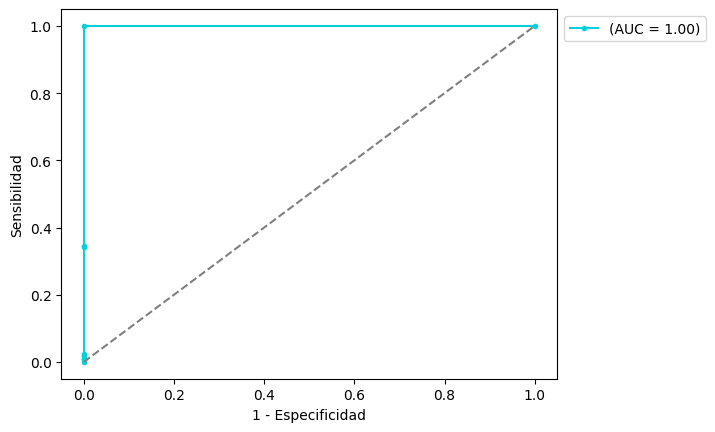

Resultados en  Validación 



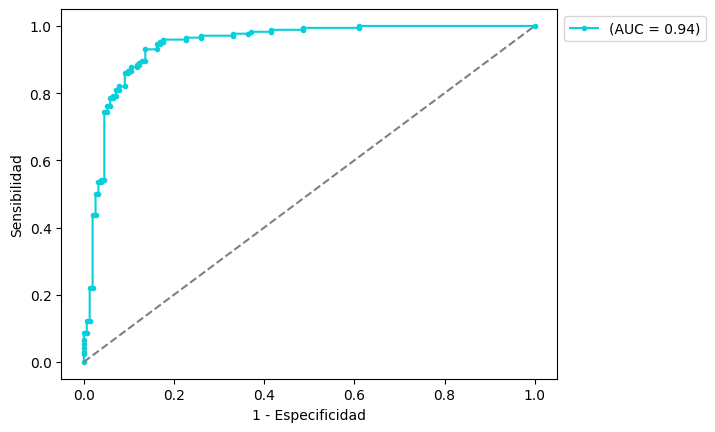

Resultados en  Testeo 



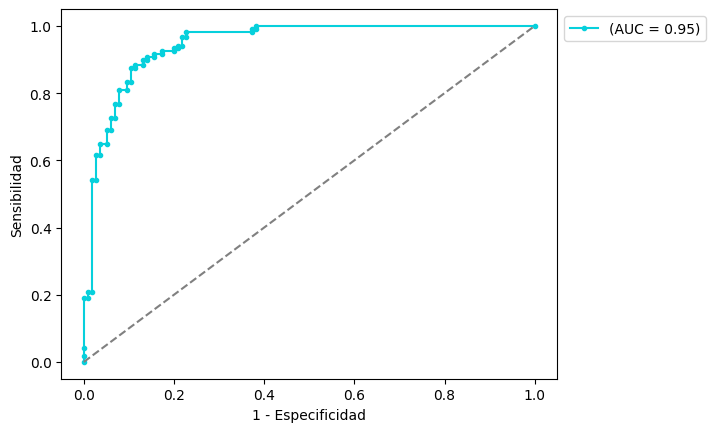

In [475]:
mlp = MLPClassifier()
mlp.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = mlp.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####Random Forest

Resultados en  Entrenamiento 



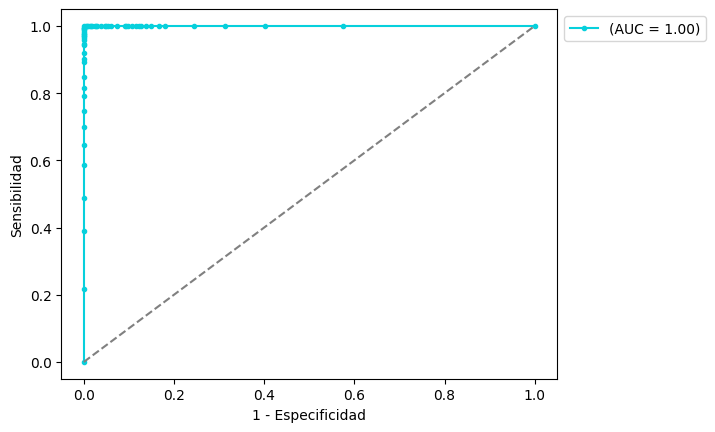

Resultados en  Validación 



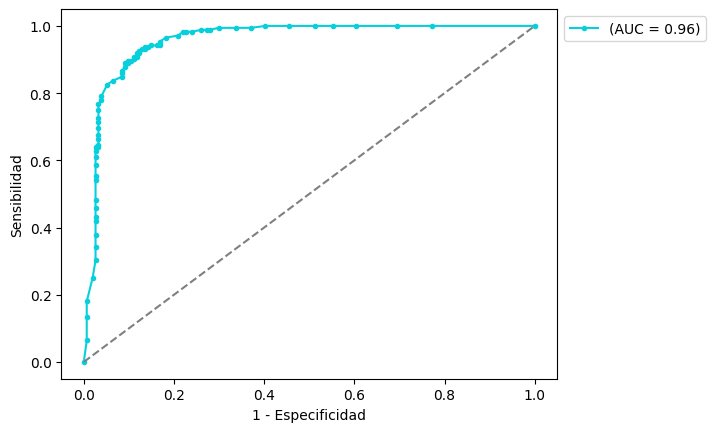

Resultados en  Testeo 



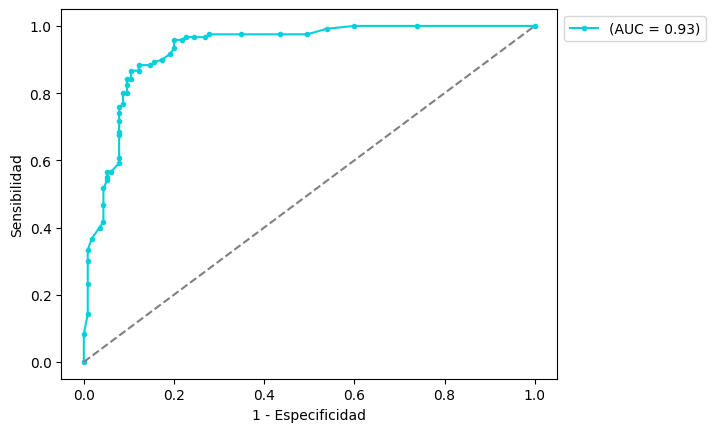

In [476]:
rf = RandomForestClassifier()
rf.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = rf.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####AdaBoost

Resultados en  Entrenamiento 



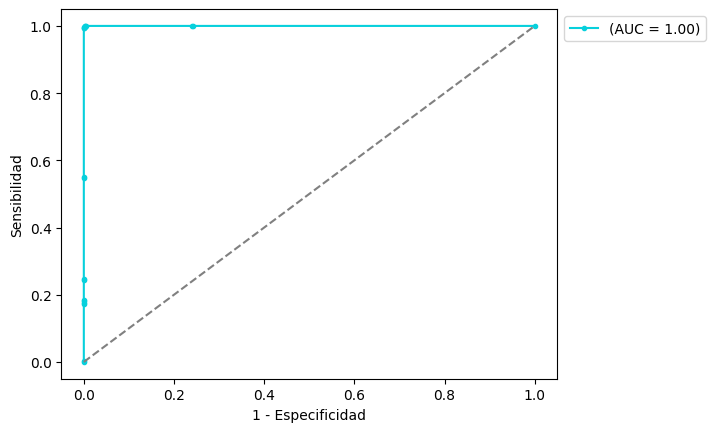

Resultados en  Validación 



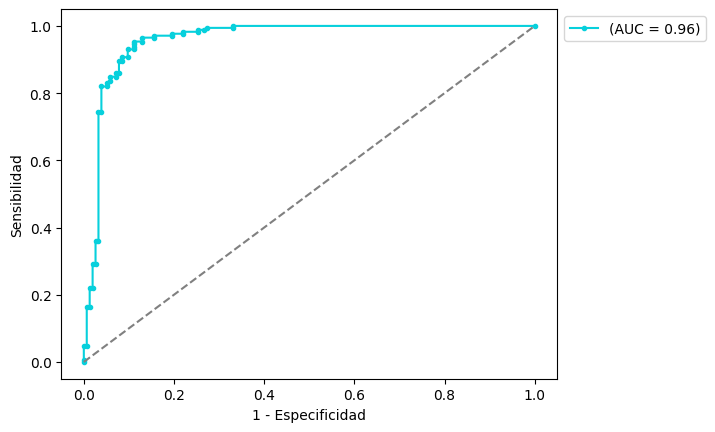

Resultados en  Testeo 



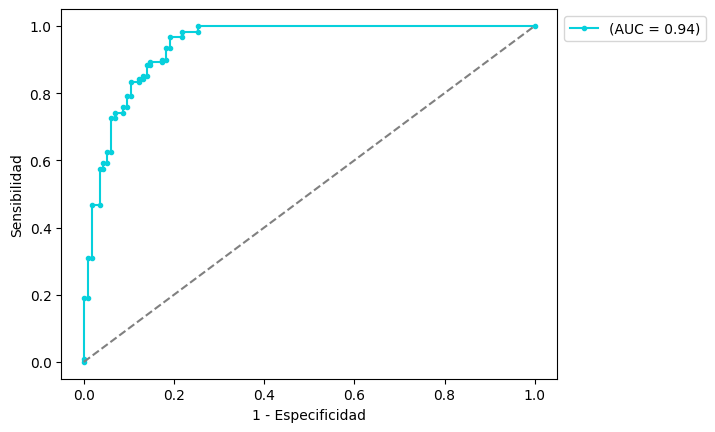

In [478]:
ab = AdaBoostClassifier()
ab.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = ab.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

#####SVM

Resultados en  Entrenamiento 



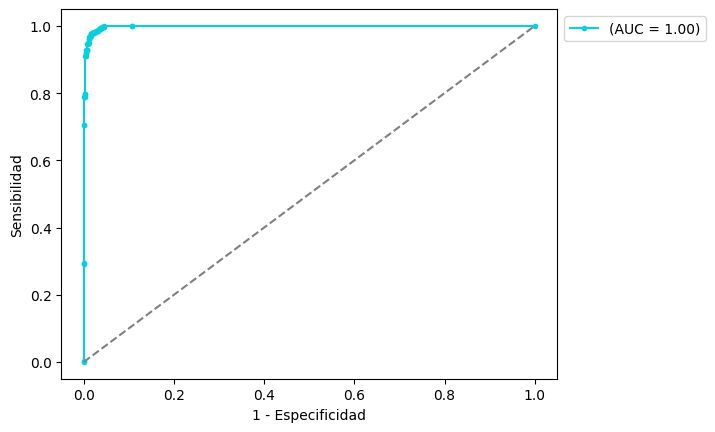

Resultados en  Validación 



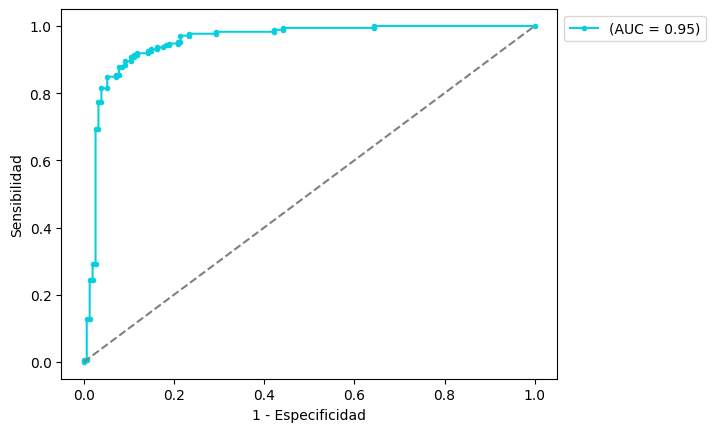

Resultados en  Testeo 



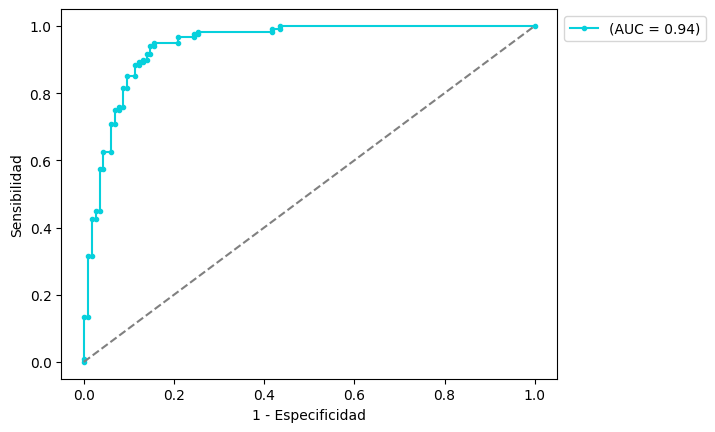

In [479]:
svm = SVC(probability=True)
svm.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = svm.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

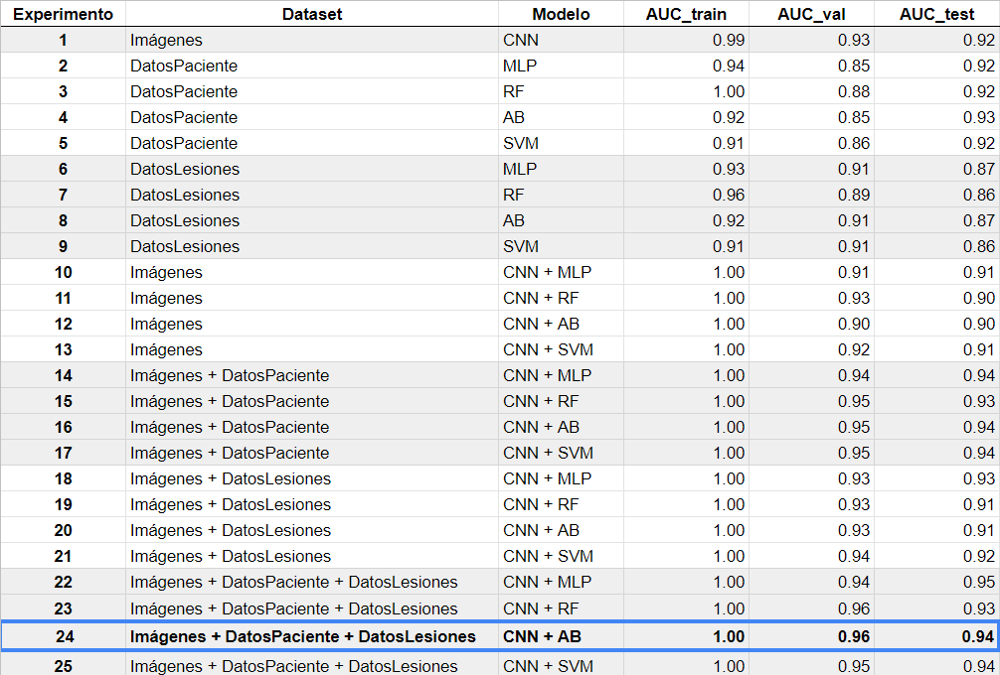

*Todos los experimentos se llevaron a cabo empleando la configuración por defecto de los algoritmos de Machine Learning.*

*Se observó un incremento en el desempeño en términos de área bajo la curva de la característica operativa del receptor al emplear los tres tipos de datos disponibles (imágenes, datos de los pacientes y datos de las lesiones). Uno de los mejores modelos resultó de la combinación de redes neuronales convolucionales para la extracción de vectores de características de las imágenes, que luego fueron complementados con los datos de pacientes y lesiones tabulados para finalmente ser procesados a través de un algoritmo AdaBoost.*

*Los mejores desempeños para una única modalidad de dato correspondieron al uso de información de los pacientes y al uso de características extraidas mediante redes de las imágenes. El desempeño de los modelos ajustados empleando solamente datos de lesiones fue ligeramente inferior. Es interesante resaltar, que en el uso de tSNE para la visualización de estos dos tipos de datos, se observó una mayor diferenciación entre las clases benignas y malignas, lo cual posteriormente se tradujo en mejores resultados al aplicar algoritmos sobre cada caso.*

*Es posible notar, que si debiera optarse por una única modalidad de dato por cuestiones de practicidad, la mejor opción sería utilizar imágenes ya sea procesadas únicamente por redes o por redes sumado a otro algoritmo más clásico.*

##4) Optimización del mejor modelo logrado

####Selección de características

*Para finalizar, se optó por no recurrir a un algoritmo particular de selección de características o reducción de dimensionalidad. Por el contrario, se tuvo en cuenta el contexto de posible aplicación de esta herramienta y se eligieron manualmente aquellas características que podrían ser fácilmente recuperadas en una consulta o desde la Historia Clínica de los pacientes.*

In [489]:
predictores_sel = ['smoke','drink', 'gender', 'age_group','skin_cancer_history', 'cancer_history', 'fitspatrick', 'region']
predictores_sel

['smoke',
 'drink',
 'gender',
 'age_group',
 'skin_cancer_history',
 'cancer_history',
 'fitspatrick',
 'region']

In [490]:
xfm_train = []
for i,v in enumerate(train_index):
  aux = xf_train[i]
  for j,w in enumerate(predictores_sel):
    aux = (np.append(aux, image_data[w][v]))
        
  xfm_train.append(aux)

xfm_train = np.asarray(xfm_train)
print(xfm_train.shape)

xfm_val = []
for i,v in enumerate(val_index):
  aux = xf_val[i]
  for j,w in enumerate(predictores_sel):
    aux = (np.append(aux, image_data[w][v]))
  xfm_val.append(aux)

xfm_val = np.asarray(xfm_val)
print(xfm_val.shape)

xfm_test = []
for i,v in enumerate(test_index):
  aux = xf_test[i]
  for j,w in enumerate(predictores_sel):
    aux = (np.append(aux, image_data[w][v]))
  xfm_test.append(aux)

xfm_test = np.asarray(xfm_test)
print(xfm_test.shape)

(1734, 520)
(326, 520)
(235, 520)


*Modelo base a partir de AdaBoost*

Resultados en  Entrenamiento 



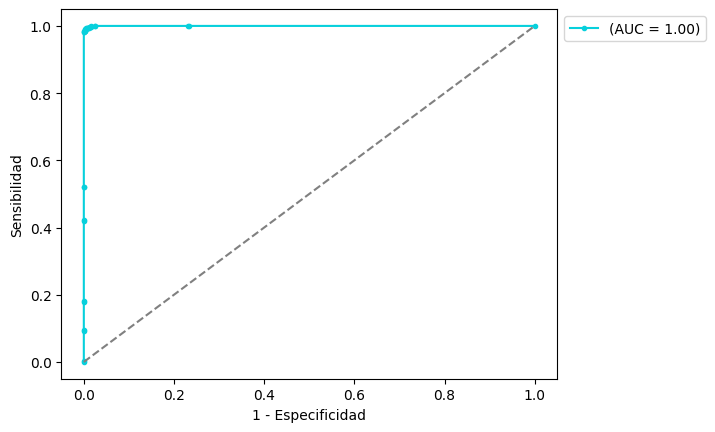

Resultados en  Validación 



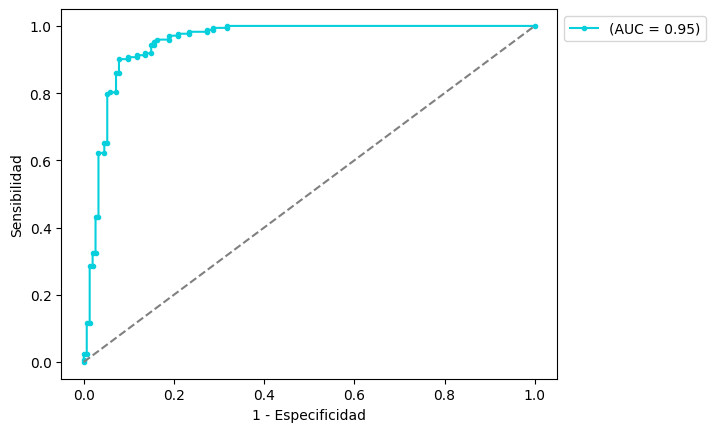

Resultados en  Testeo 



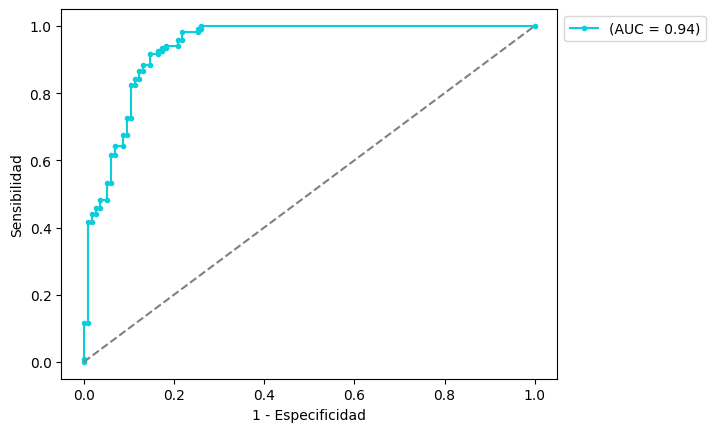

In [491]:
ab = AdaBoostClassifier()
ab.fit(xfm_train, y_train)

subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = ab.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

*Reduciendo los predictores tabulados de pacientes y lesiones de 19 a 8, se lograron resultados similares a los conseguidos previamente. Se procedió con la búsqueda por grilla de hiperparámetros para indagar si es posible incrementar aún más estas métricas.*

###Búsqueda por grilla

In [497]:
ab = AdaBoostClassifier()
crossvalidation=KFold(n_splits=5,shuffle=True,random_state=1)
params={'n_estimators':[500,1000,2000],'learning_rate':[.001,0.01,.1]}
gs=GridSearchCV(estimator=ab,param_grid=params,scoring='roc_auc',n_jobs=1,cv=crossvalidation)
gs.fit(xfm_train, y_train)


GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             error_score=nan,
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None,
                                          learning_rate=1.0, n_estimators=50,
                                          random_state=None),
             iid='deprecated', n_jobs=1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'n_estimators': [500, 1000, 2000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='roc_auc', verbose=0)

In [498]:
print('Mejores parámetros\n', gs.best_params_)
print('Mejor AUC\n', gs.best_score_)

Mejores parámetros
 {'learning_rate': 0.01, 'n_estimators': 2000}
Mejor AUC
 0.9906478702697677


In [503]:
gs.best_estimator_

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=0.01,
                   n_estimators=2000, random_state=None)

In [504]:
ab = AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=0.01,
                   n_estimators=2000, random_state=None)

*Como para hacer gridsearch se realizó validación cruzada de K particiones, se ajusta el algoritmo sobre todos los datos de entrenamiento.*

In [505]:
ab.fit(xfm_train,y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=0.01,
                   n_estimators=2000, random_state=None)

Resultados en  Entrenamiento 



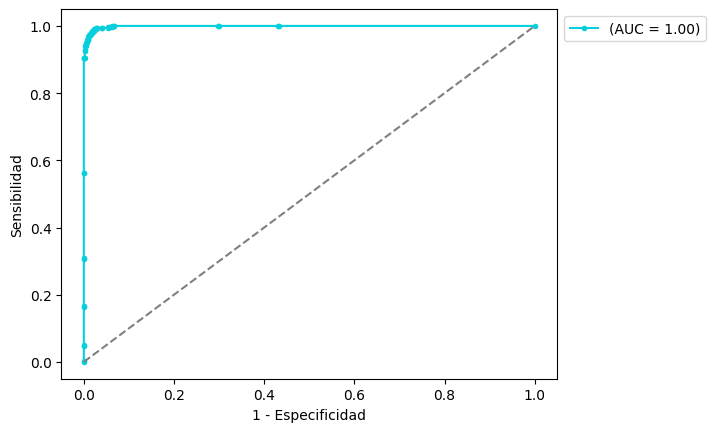

Resultados en  Validación 



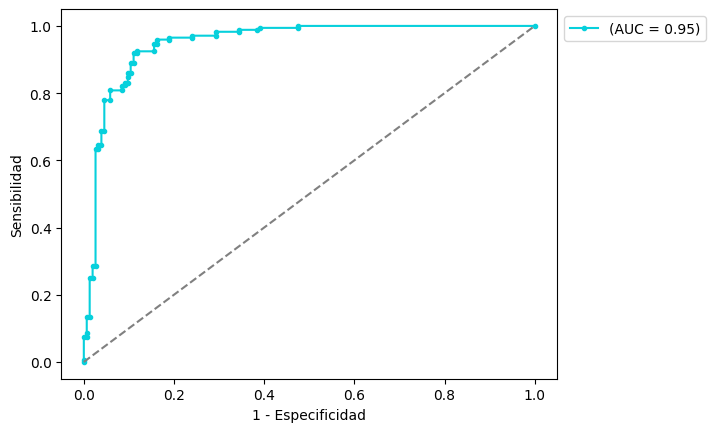

Resultados en  Testeo 



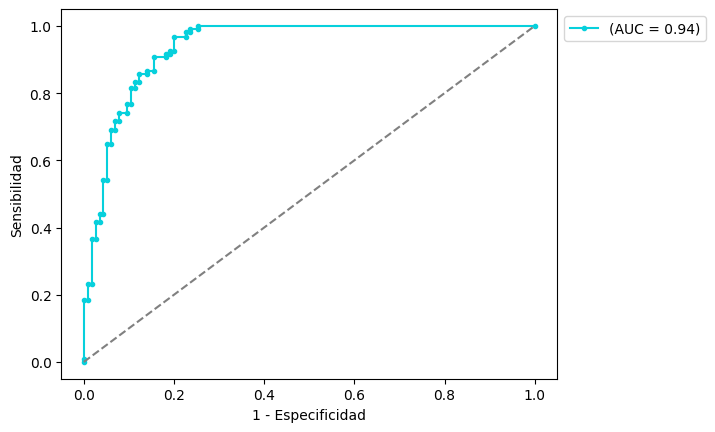

In [506]:
subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_pred = ab.predict_proba(x[i])
  plot_ROC(y[i],y_pred[:,1])
  plt.show()

*La búsqueda por grilla, si bien no fue exhaustiva, permitió obtener los mismos buenos resultados logrados previamente. En otra instancia podrían probarse más parámetros e incluso una búsqueda aleatorizada.*

###Selección del punto de corte

*Utilizando únicamente los datos de entrenamiento, se busca el mejor punto de corte a partir del Youden Index, de modo de conseguir el mejor par de valores para la sensibilidad y la especificidad.*

In [525]:
y_proba = ab.predict_proba(xfm_train)

In [526]:
def YI(tpr, fpr):
    #Youden index
    return np.argmax(tpr-fpr)

In [527]:
fpr, tpr, thresholds = metrics.roc_curve(y, y_proba[:,1])
idx = YI(tpr, fpr)
print(idx)

40


In [528]:
thr = thresholds[idx]
print('Umbral óptimo:', thr)

Umbral óptimo: 0.502954464026776


###Métricas de clasificación

*Matrices de confusión*

Resultados en  Entrenamiento 



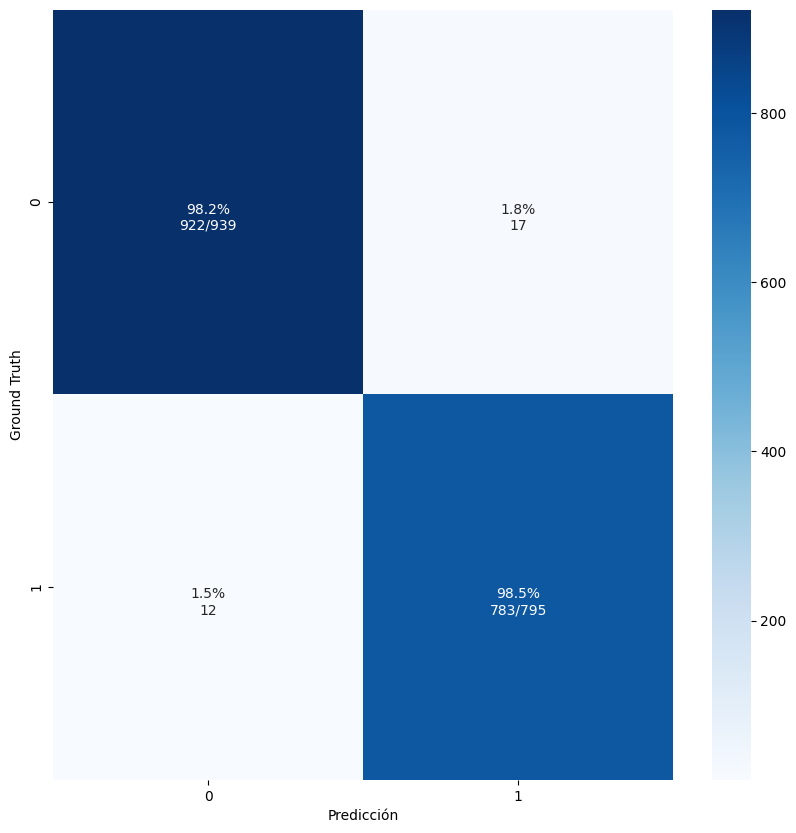

Resultados en  Validación 



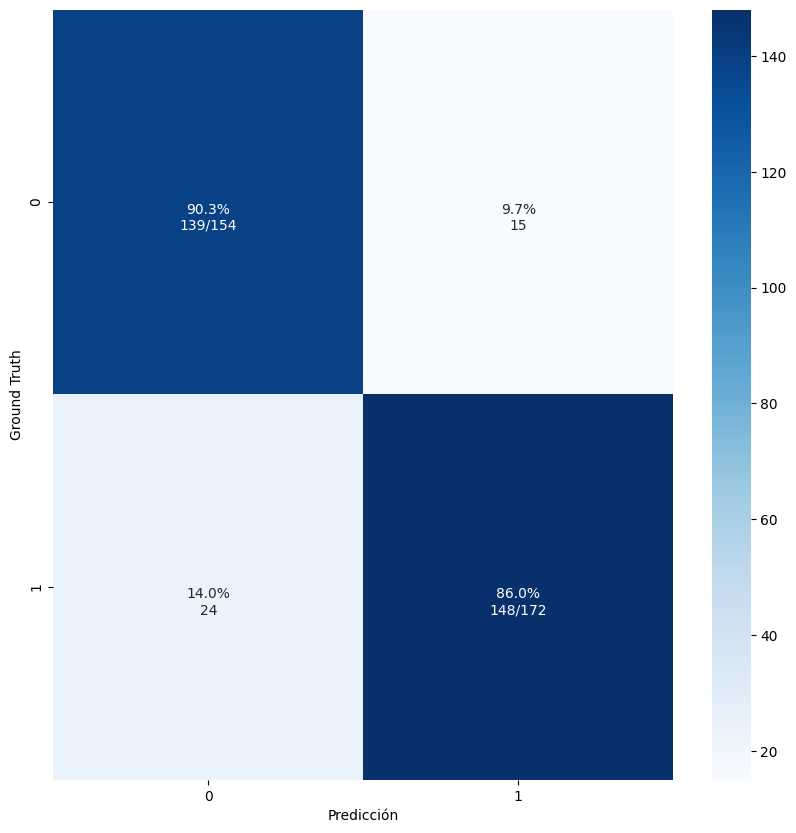

Resultados en  Testeo 



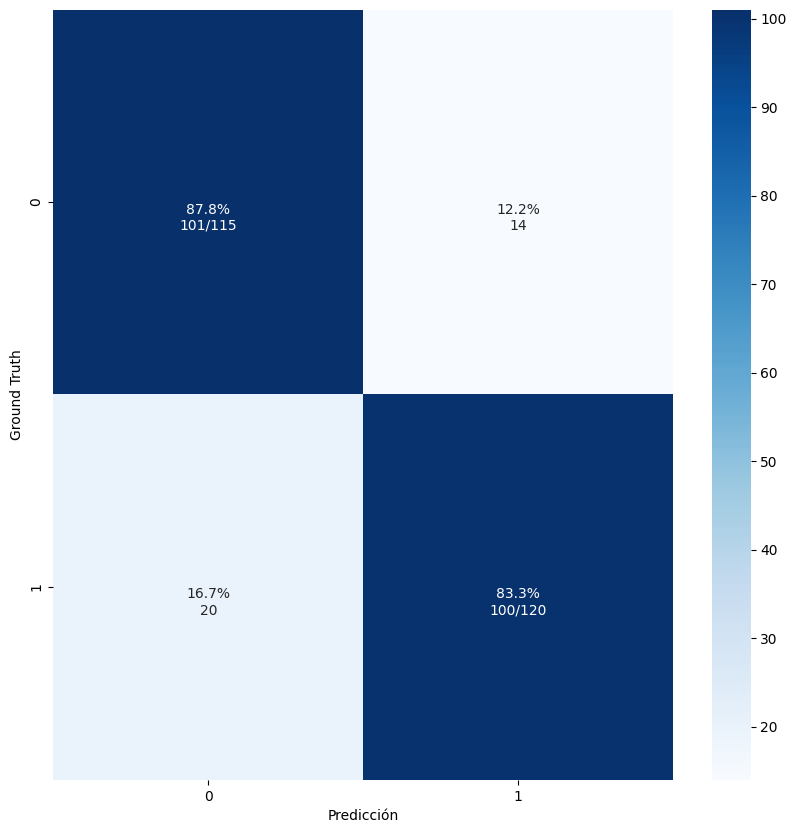

In [532]:
subconjuntos = ['Entrenamiento', 'Validación', 'Testeo']
x = [xfm_train, xfm_val, xfm_test]
y = [y_train, y_val, y_test]
y_probas = []
y_preds = []

for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  y_proba = ab.predict_proba(x[i])
  y_probas.append(y_proba)
  y_pred = []
  for j,w in enumerate(y_proba[:,1]):
    if (w<thr):
      y_pred.append(0)
    else:
      y_pred.append(1)
  y_preds.append(y_pred)

  cm_analysis(y[i],y_pred, [0,1])
  plt.show()

*Reporte de clasificación*

In [534]:
for i,v in enumerate(subconjuntos):
  print('Resultados en ', v, '\n')
  print(classification_report(y[i], y_preds[i]))

Resultados en  Entrenamiento 

              precision    recall  f1-score   support

           0       0.99      0.98      0.98       939
           1       0.98      0.98      0.98       795

    accuracy                           0.98      1734
   macro avg       0.98      0.98      0.98      1734
weighted avg       0.98      0.98      0.98      1734

Resultados en  Validación 

              precision    recall  f1-score   support

           0       0.85      0.90      0.88       154
           1       0.91      0.86      0.88       172

    accuracy                           0.88       326
   macro avg       0.88      0.88      0.88       326
weighted avg       0.88      0.88      0.88       326

Resultados en  Testeo 

              precision    recall  f1-score   support

           0       0.83      0.88      0.86       115
           1       0.88      0.83      0.85       120

    accuracy                           0.86       235
   macro avg       0.86      0.86      0.86  

*Se obtuvieron buenos resultados con la metodología adoptada. En un futuro podría implementarse la reducción del vector de características imagenológicas extraido mediante la red neuronal convolucional, la utilización de algún método de selección de caracterísicas para los restantes datos, la evaluación de otros métodos de clasificación, entre otros. Múltiples experimentos pueden conducirse para mejorar aún los resultados en los conjuntos de validación y testeo, incluyendo la elección de un mejor umbral teniendo en cuenta el contexto de aplicación, dado que el área bajo la curva en ambos casos es superior a 0.90.*

*Otro trabajo futuro estaría vinculado a la clasificación de múltiples lesiones cutáneas en lugar de acotar el alcance a una clasificación binaria.*